# Statistics for Michel electron candidates

# All current available DATA

### Created by Shu, 202603---

### Based on new20251205; the main difference is #opWVF>=3 instead of 4

### Beam events removed

<br />
<br />
<br />
<br />
<br />
<br />

## WVF Coincidence Explore:

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import os


# ------------------------------------------------------------
# 1️⃣ Define input files
# ------------------------------------------------------------
input_files = []
coinNum = []     # waveform coincidence numbers


# --- Files in current ./statResult_pds
base_dir = "./statResult_pds"
run_numbers = [
    "28778", "28777", "28796", "28806", "28836", "28867", "28893",
    "28776", "28762", "28759", "28758", "28751"
    # add more run numbers here
]

for r in run_numbers:
    input_files.append(os.path.join(base_dir, f"print_count_{r}.txt"))

# --- Extra file 1
input_files.append(
    "../beamRun28891_202602/beam_removal/statResult_pds/print_wvfCoin_count202602.txt"
)

# --- Extra file 2
input_files.append(
    "../cosmicRun28116_FullRun/new20260128/statResult_pds/print_wvfCoin_count20251205.txt"
)


# ------------------------------------------------------------
# 2️⃣ Read waveform coincidence counts
# ------------------------------------------------------------
for fname in input_files:
    if not os.path.exists(fname):
        print(f"[WARN] File not found: {fname}")
        continue

    with open(fname, "r") as file:
        for line in file:
            line = line.strip()
            if not line:
                continue

            parts = line.split(":")
            if len(parts) >= 2:
                try:
                    number = int(parts[1].strip())
                    coinNum.append(number)
                except ValueError:
                    print(f"[WARN] Could not convert '{parts[1].strip()}' in {fname} to an integer.")


# ------------------------------------------------------------
# ✅ Summary
# ------------------------------------------------------------
print("Track candidates (TPC cut)  : xxx")
print("Track candidates with NO wvf: xxx")
print("Number of track candidates  :", len(coinNum))

#coinNum.extend([0] * 5000)

# optional: convert to numpy array
coinNum = np.array(coinNum, dtype=int)

# optional: save it
#np.save("coinNum.npy", coinNum)
#np.savetxt("coinNum.txt", coinNum, fmt="%d")

Track candidates (TPC cut)  : xxx
Track candidates with NO wvf: xxx
Number of track candidates  : 187165



Candidates with #opWvf>=3:  158615 / 187165 (84.75%)


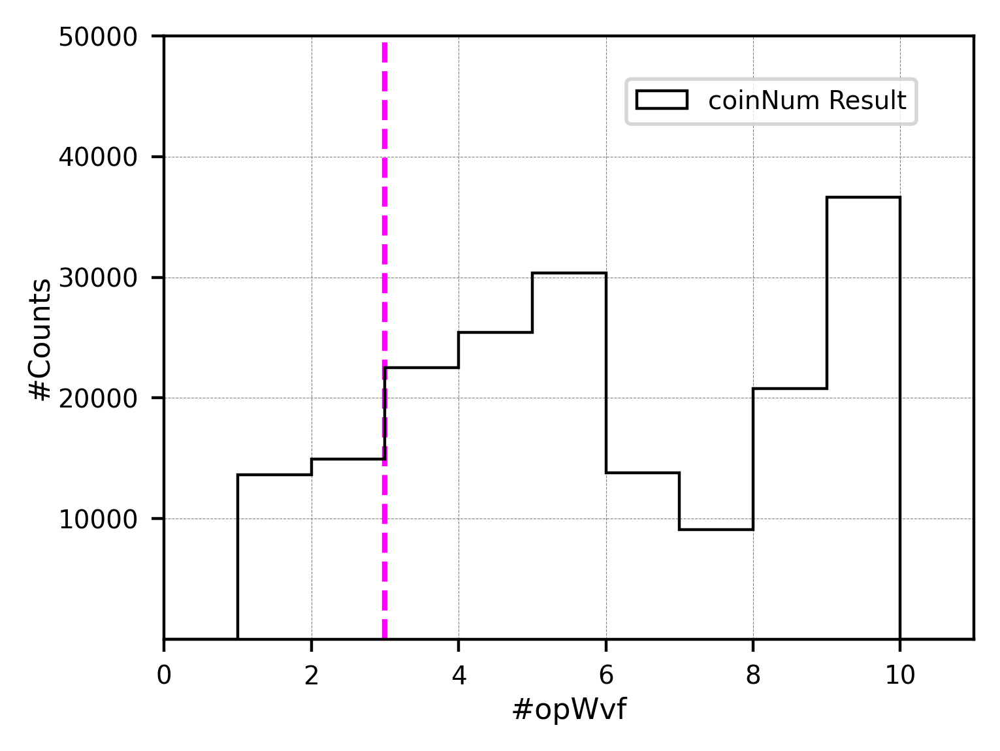

In [4]:
#Apply preliminary cut #opWvf >=3:=====================
coinNum_cut4 = []
coinNum_trueE_cut4 = []
for i in range(0, len(coinNum)):
    coin = coinNum[i]

    if coin >=3:
        coinNum_cut4.append(coin)

print("\nCandidates with #opWvf>=3: ", len(coinNum_cut4), "/", len(coinNum), "({:.2f}%)".format(len(coinNum_cut4)/len(coinNum)*100))




# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 1
range_min = 0
range_max = 11
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.plot([3, 3], [0, 50000], color="magenta", linewidth=1.5, linestyle='--')

plt.hist(coinNum, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label='coinNum Result')

plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.xlim(0, 11)
plt.xlabel('#opWvf', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.1, 50000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show() 






<br />
<br />
<br />
<br />
<br />
<br />

## Process WVF:
### After TPC cuts & (#opWvf >= 3) (This can be taken as "PDS Cut 1")

In [5]:
from dataclasses import dataclass
from typing import Optional
import matplotlib.pyplot as plt
import numpy as np
import re
from mpl_toolkits.mplot3d import Axes3D



# ------------------- Dataclass -------------------
@dataclass
class PdsEvent:
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    third_time: Optional[int] = None             # NEW
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None      # NEW
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None
    # muon
    mu_leftTurn: Optional[int] = None
    mu_rightTurn: Optional[int] = None
    mu_leftHeight: Optional[float] = None
    mu_rightHeight: Optional[float] = None
    # michel
    mi_leftTurn: Optional[int] = None
    mi_rightTurn: Optional[int] = None
    mi_leftHeight: Optional[float] = None
    mi_rightHeight: Optional[float] = None
    # third peak
    th_leftTurn: Optional[int] = None            # NEW
    th_rightTurn: Optional[int] = None           # NEW
    th_leftHeight: Optional[float] = None        # NEW
    th_rightHeight: Optional[float] = None       # NEW
    # Michel-level attributes
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None            # ✅ NEW



# ------------------- Helpers -------------------
def parse_event_track(path_str: str):
    """Extract eventID and trackID from a file path string."""
    m = re.search(r"event(\d+)_trackID(\d+)", path_str)
    if m:
        return int(m.group(1)), int(m.group(2))
    return None, None



def read_total_files(files, dates, kind="muon"):
    """
    Read *_total_xxx.txt files.
    Each line: path: t, I, leftTurn, leftHeight, rightTurn, rightHeight
    """
    records = []
    for fname, date in zip(files, dates):
        try:
            with open(fname, "r") as f:
                for line in f:
                    line = line.strip()
                    if not line:
                        continue
                    parts = line.split(":")
                    if len(parts) < 2:
                        continue

                    path_part = parts[0].strip()
                    values = [v.strip() for v in parts[1].split(",")]
                    if len(values) < 6:
                        print(f"[WARN] Malformed line in {fname}: {line}")
                        continue

                    try:
                        time_val = int(values[0])
                        inten_val = float(values[1])
                        left_turn = int(values[2])
                        left_h = float(values[3])
                        right_turn = int(values[4])
                        right_h = float(values[5])
                    except ValueError:
                        print(f"[WARN] Could not parse numbers in {line}")
                        continue

                    evID, trID = parse_event_track(path_part)
                    rec = {"eventID": evID, "trackID": trID, "date": int(date)}

                    if kind == "muon":
                        rec.update({
                            "muon_time": time_val,
                            "muon_intensity": inten_val,
                            "mu_leftTurn": left_turn,
                            "mu_leftHeight": left_h,
                            "mu_rightTurn": right_turn,
                            "mu_rightHeight": right_h
                        })
                    elif kind == "michel":
                        rec.update({
                            "michel_time": time_val,
                            "michel_intensity": inten_val,
                            "mi_leftTurn": left_turn,
                            "mi_leftHeight": left_h,
                            "mi_rightTurn": right_turn,
                            "mi_rightHeight": right_h
                        })
                    elif kind == "third":
                        rec.update({
                            "third_time": time_val,
                            "third_intensity": inten_val,
                            "th_leftTurn": left_turn,
                            "th_leftHeight": left_h,
                            "th_rightTurn": right_turn,
                            "th_rightHeight": right_h
                        })

                    records.append(rec)
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return records




def read_plain_files(files, cast_type=float):
    """Read one or more plain text files with one number per line and return concatenated values."""
    values = []
    for fname in files:
        try:
            with open(fname, "r") as file:
                for line in file:
                    value = line.strip()
                    if value:
                        try:
                            values.append(cast_type(value))
                        except ValueError:
                            print(f"Could not convert {value} in {fname}")
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return values



# ------------------- Load data -------------------------
# dates here are in fact run number
dates = ["28777", "28778", "28796", "28806", "28836", "28867", "28893",
         "28776", "28762", "28759", "28758", "28751"] 

muon_files   = [f"./statResult_pds/muon_total_{d}.txt" for d in dates]
michel_files = [f"./statResult_pds/michel_total_{d}.txt" for d in dates]
third_files  = [f"./statResult_pds/third_total_{d}.txt" for d in dates]

muon_records   = read_total_files(muon_files, dates, kind="muon")
michel_records = read_total_files(michel_files, dates, kind="michel")
third_records  = read_total_files(third_files, dates, kind="third")

# --- plain text attributes ---
posX     = read_plain_files([f"./statResult_pds/posX_extract_{d}.txt" for d in dates])
posY     = read_plain_files([f"./statResult_pds/posY_extract_{d}.txt" for d in dates])
posZ     = read_plain_files([f"./statResult_pds/posZ_extract_{d}.txt" for d in dates])
miScore  = read_plain_files([f"./statResult_pds/michelScore_extract_{d}.txt" for d in dates])
miHits   = read_plain_files([f"./statResult_pds/michelHits_extract_{d}.txt" for d in dates], cast_type=int)




# ------------------- Load extra runs ---------------------------------
extra_runs = [
    ("202602", "../beamRun28891_202602/beam_removal/statResult_pds"),
    ("20251205", "../cosmicRun28116_FullRun/new20260128/statResult_pds")
]

extra_muon_records   = []
extra_michel_records = []
extra_third_records  = []

extra_posX = []
extra_posY = []
extra_posZ = []
extra_miScore = []
extra_miHits = []

for run, base in extra_runs:

    # total files
    mu_file = [f"{base}/muon_total_{run}.txt"]
    mi_file = [f"{base}/michel_total_{run}.txt"]
    th_file = [f"{base}/third_total_{run}.txt"]

    extra_muon_records   += read_total_files(mu_file, [run], kind="muon")
    extra_michel_records += read_total_files(mi_file, [run], kind="michel")
    extra_third_records  += read_total_files(th_file, [run], kind="third")

    # plain attribute files
    extra_posX   += read_plain_files([f"{base}/posX_extract_{run}.txt"])
    extra_posY   += read_plain_files([f"{base}/posY_extract_{run}.txt"])
    extra_posZ   += read_plain_files([f"{base}/posZ_extract_{run}.txt"])
    extra_miScore += read_plain_files([f"{base}/michelScore_extract_{run}.txt"])
    extra_miHits  += read_plain_files([f"{base}/michelHits_extract_{run}.txt"], cast_type=int)

# merge datasets
muon_records   += extra_muon_records
michel_records += extra_michel_records
third_records  += extra_third_records

posX += extra_posX
posY += extra_posY
posZ += extra_posZ

miScore += extra_miScore
miHits  += extra_miHits







# ------------------- Build dataset -------------------
events_veryInitial = []
n_events = min(
    len(muon_records), len(michel_records), len(third_records),
    len(posX), len(posY), len(posZ),
    len(miScore), len(miHits)
)

for i in range(n_events):
    rec_mu = muon_records[i]
    rec_mi = michel_records[i]
    rec_th = third_records[i]

    ev = PdsEvent(
        eventID=rec_mu.get("eventID", rec_mi.get("eventID", rec_th.get("eventID"))),
        trackID=rec_mu.get("trackID", rec_mi.get("trackID", rec_th.get("trackID"))),
        date=rec_mu.get("date", rec_mi.get("date", rec_th.get("date"))),

        # muon
        muon_time=rec_mu.get("muon_time"),
        muon_intensity=rec_mu.get("muon_intensity"),
        mu_leftTurn=rec_mu.get("mu_leftTurn"),
        mu_leftHeight=rec_mu.get("mu_leftHeight"),
        mu_rightTurn=rec_mu.get("mu_rightTurn"),
        mu_rightHeight=rec_mu.get("mu_rightHeight"),

        # michel
        michel_time=rec_mi.get("michel_time"),
        michel_intensity=rec_mi.get("michel_intensity"),
        mi_leftTurn=rec_mi.get("mi_leftTurn"),
        mi_leftHeight=rec_mi.get("mi_leftHeight"),
        mi_rightTurn=rec_mi.get("mi_rightTurn"),
        mi_rightHeight=rec_mi.get("mi_rightHeight"),
        michel_score=miScore[i],
        michel_hits=miHits[i],

        # third
        third_time=rec_th.get("third_time"),
        third_intensity=rec_th.get("third_intensity"),
        th_leftTurn=rec_th.get("th_leftTurn"),
        th_leftHeight=rec_th.get("th_leftHeight"),
        th_rightTurn=rec_th.get("th_rightTurn"),
        th_rightHeight=rec_th.get("th_rightHeight"),

        # physical properties
        posX=posX[i], posY=posY[i], posZ=posZ[i]
    )
    events_veryInitial.append(ev)

print("Very initial dataset:", len(events_veryInitial))

example = events_veryInitial[0]
print("\nExample Event (index 0):")
for field, value in vars(example).items():
    print(f"  {field:20s}: {value}")









#Apply cuts on peak intensities-----------------------------
events_reco_initial = []

for ev in events_veryInitial:
    muIntensity = ev.muon_intensity
    miIntensity = ev.michel_intensity

    ms = ev.michel_score
    mh = ev.michel_hits

    if muIntensity > 0.3  and miIntensity > -0.1  and ms > 0.3 and mh > 3:#mu & mi are cuts in following block already!
        events_reco_initial.append(ev)


print("\nDataset after initial intensity-cut----------------------")
print("Michel initial dataset   : ", len(events_reco_initial))






Very initial dataset: 151777

Example Event (index 0):
  muon_time           : 59
  michel_time         : 411
  third_time          : 870
  muon_intensity      : 3.75384
  michel_intensity    : 0.410011
  third_intensity     : 0.338561
  posX                : -103.764
  posY                : 34.2177
  posZ                : 410.316
  eventID             : 10006
  trackID             : 2
  date                : 28777
  mu_leftTurn         : 25
  mu_rightTurn        : 77
  mu_leftHeight       : 5.38741
  mu_rightHeight      : 3.75384
  mi_leftTurn         : 387
  mi_rightTurn        : 423
  mi_leftHeight       : 0.593695
  mi_rightHeight      : 0.410011
  th_leftTurn         : 851
  th_rightTurn        : 885
  th_leftHeight       : 0.368456
  th_rightHeight      : 0.338561
  michel_score        : 0.725665
  michel_hits         : 13

Dataset after initial intensity-cut----------------------
Michel initial dataset   :  104537


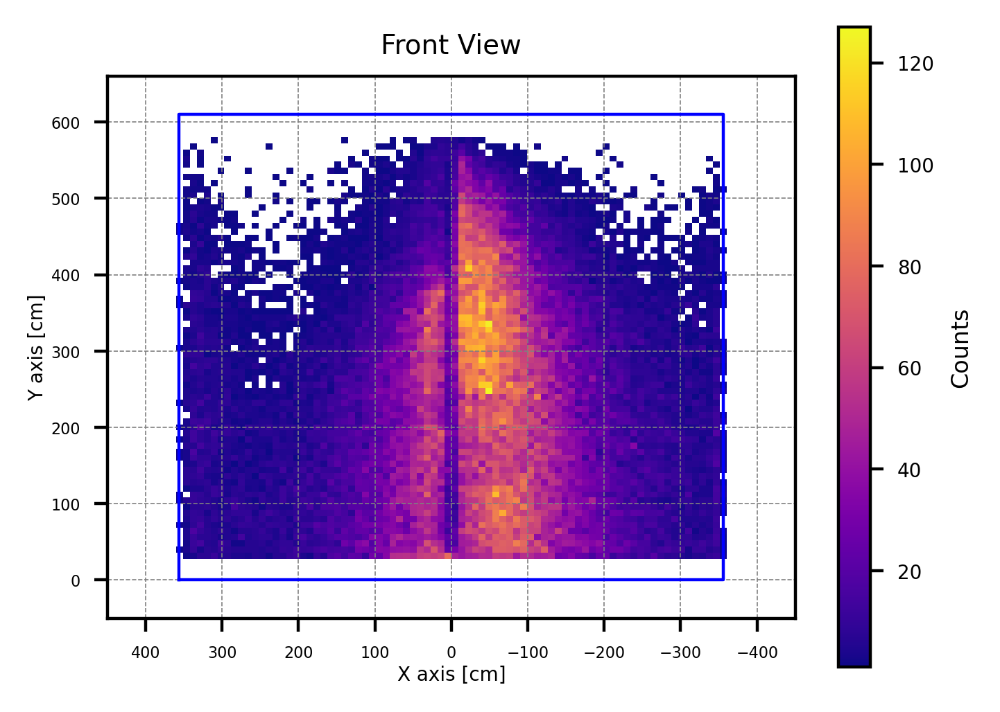

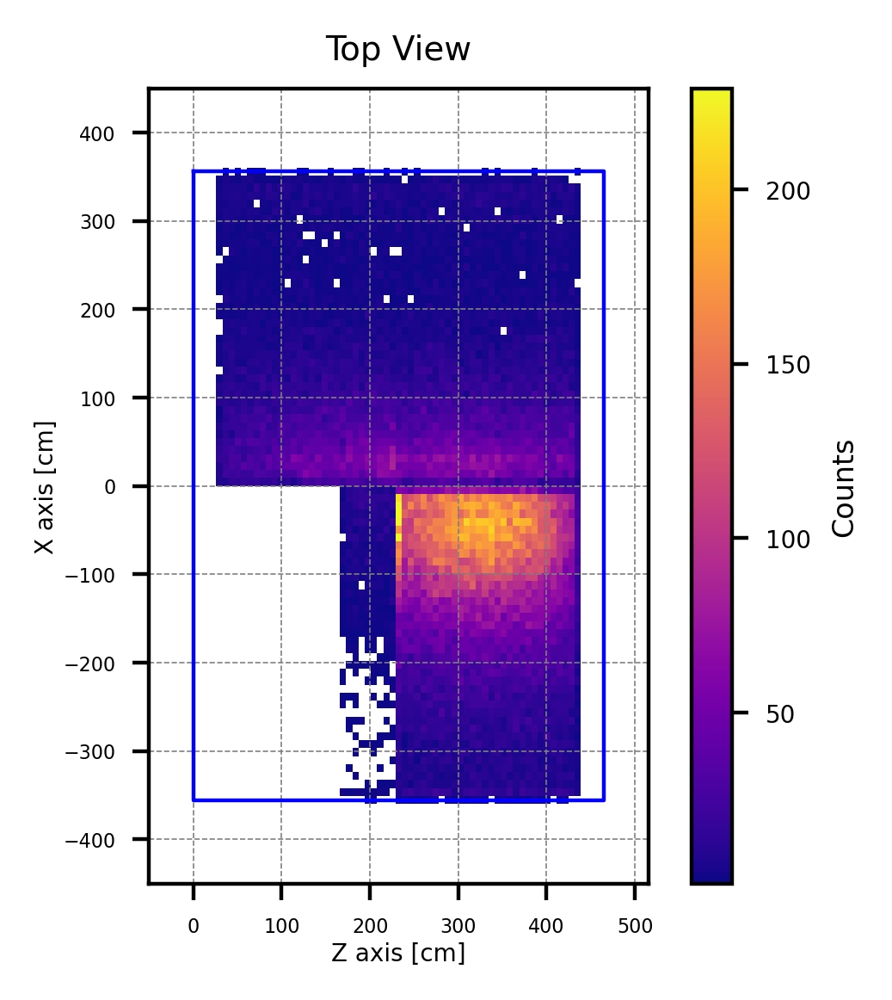


Decay points distribution (TPC & #opWvf cuts): 
# of X < 0 :  72080 (68.95%)
# of X >= 0:  32457 (31.05%)


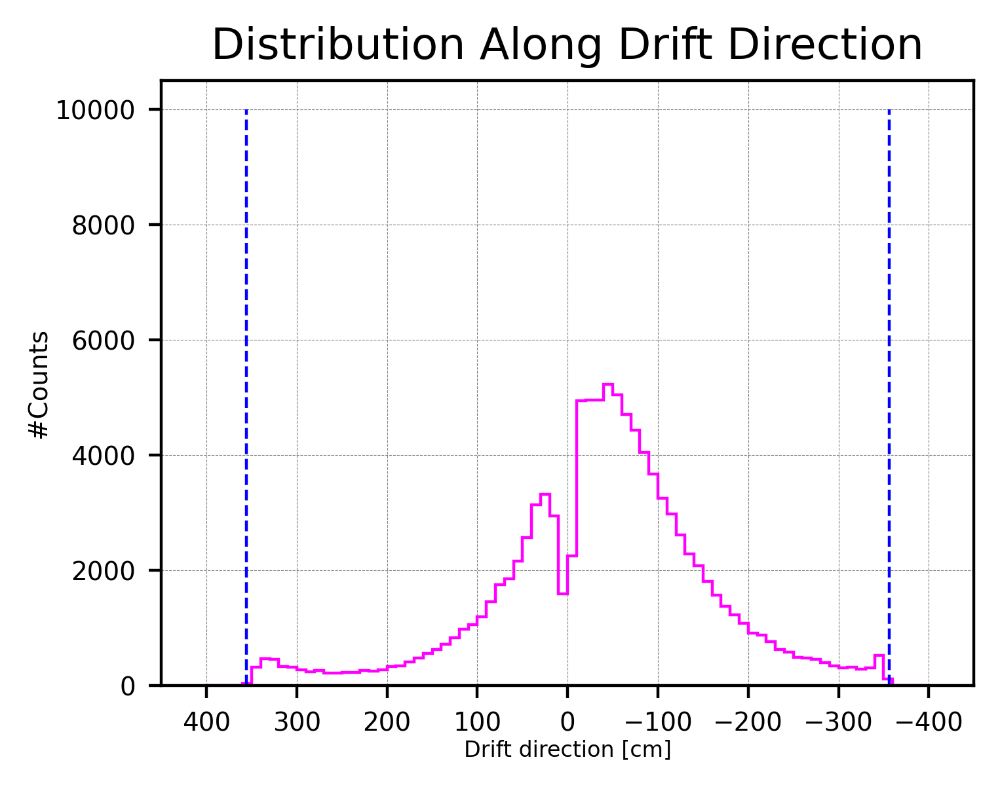

In [6]:
posX = [ev.posX for ev in events_reco_initial]
posY = [ev.posY for ev in events_reco_initial]
posZ = [ev.posZ for ev in events_reco_initial]




#Y-X plane ploting (Front View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#Set the limts of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

#Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')


# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posX, posY, bins=(100, 100), range=[[xmin, xmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-450, 450)#z---
plt.ylim(-50, 660)
plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Front View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 




#Z-X plane ploting (Top View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux1 = [0, 465, 465, 0, 0] #y shoud be y---
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posZ, posX, bins=(100, 100), range=[[zmin, zmax], [xmin, xmax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.3)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)

plt.axis('scaled')
plt.ylim(-450, 450)#z---
plt.xlim(-50, 515)
plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.title('Top View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()








#Decay points distribution:==================================================================
print("\nDecay points distribution (TPC & #opWvf cuts): ")

posX = np.array(posX)
neg_X = np.sum(posX < 0)
pos_X = np.sum(posX >= 0)
print("# of X < 0 : ", neg_X, "({:.2f}%)".format(neg_X/len(posX)*100))
print("# of X >= 0: ", pos_X, "({:.2f}%)".format(pos_X/len(posX)*100))      




#============================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(posX, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

#APA planes---
plt.plot([-356, -356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([356, 356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')


plt.xlim(-450, 450)
plt.xlabel('Drift direction [cm]', labelpad=1, fontsize=6)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylabel('#Counts', labelpad=1, fontsize=7)
#plt.ylim(0.1, 5000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution Along Drift Direction', fontsize=12)
plt.show()  






#### Quick distance test ---

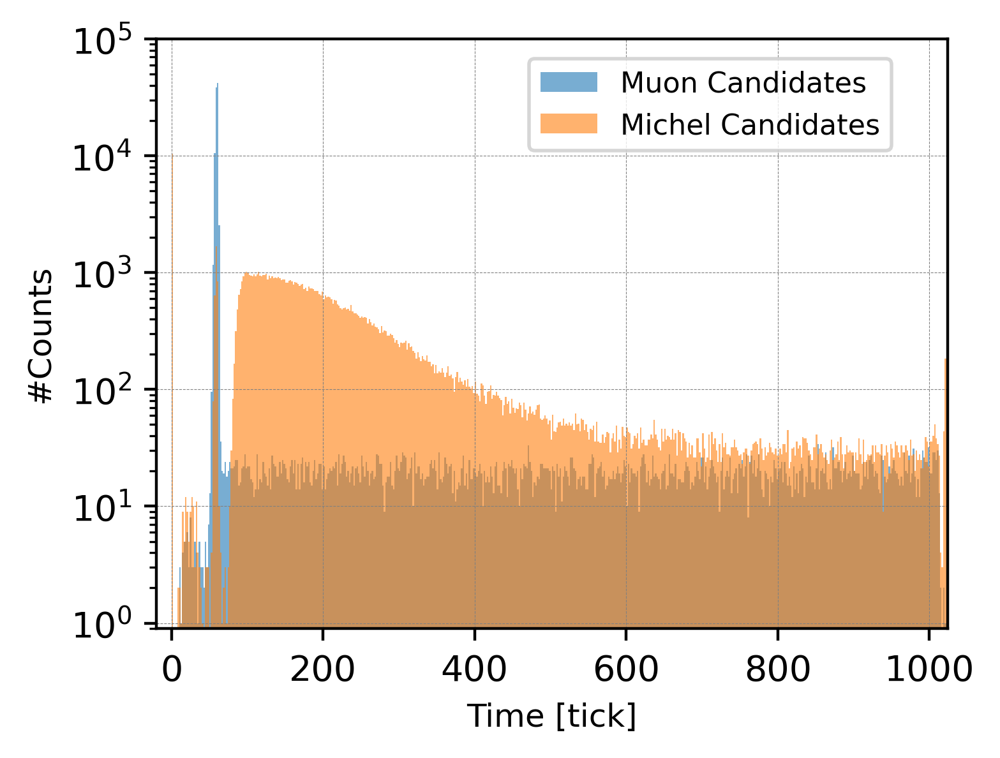

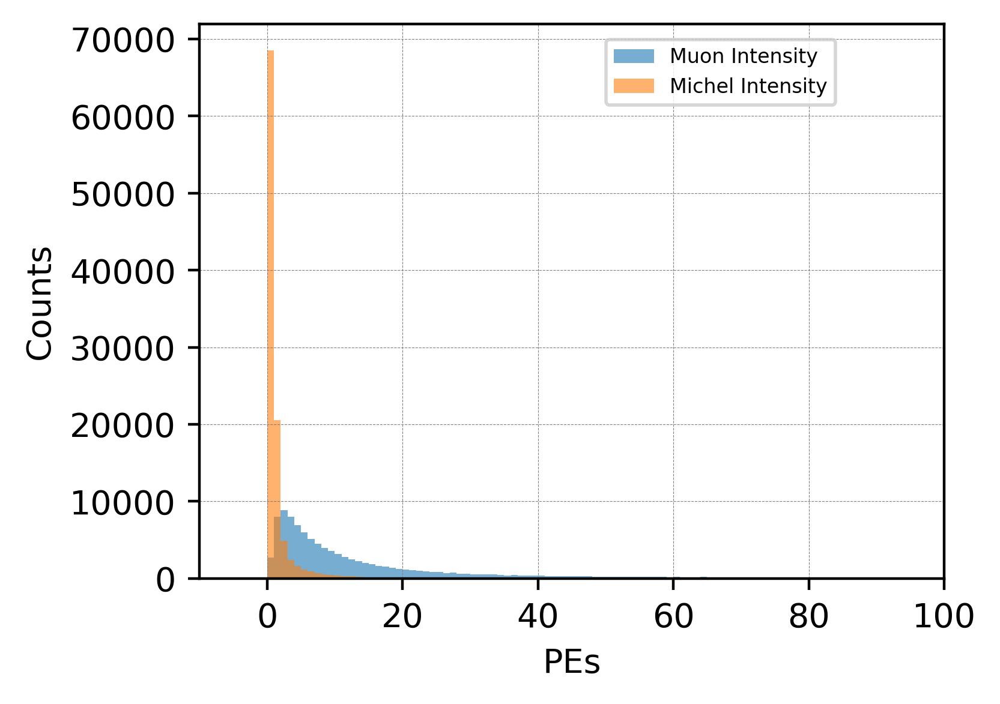

In [7]:
muon_time = [ev.muon_time for ev in events_reco_initial]
michel_time = [ev.michel_time for ev in events_reco_initial]

muon_intensity = [ev.muon_intensity for ev in events_reco_initial]
michel_intensity = [ev.michel_intensity for ev in events_reco_initial]



#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 2  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_time, bins=bins, alpha=0.6, label='Muon Candidates')
plt.hist(michel_time, bins=bins, alpha=0.6, label='Michel Candidates')

plt.xlabel('Time [tick]', fontsize=9)
plt.ylabel('#Counts', fontsize=9)
plt.yscale('log')
plt.xlim(-20, 1024)
#plt.xlim(-20, 100)
plt.ylim(0.9, 100000)
#plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), 
           fontsize=12, markerscale=6, ncol=1, prop={'size':8})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()




#Initial Mu and Michel intensity distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 100
bin_width_initial = 1  # You can change this value
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_intensity, bins=bins, alpha=0.6, label='Muon Intensity')
plt.hist(michel_intensity, bins=bins, alpha=0.6, label='Michel Intensity')

plt.xlabel('PEs')
plt.ylabel('Counts')
#plt.yscale('log')
plt.xlim(-10, 100)
#plt.title('Initial Hists of Muon and Michel Intensities', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()









 





<br />
<br />
<br />
<br />


### Purification / cut 2: remove abnormal muon signals (constrain muTime to [50, 70])

Muon events selection (mu peak constrained to [50, 65]):
Updated Muon events:  95161 / 104537 (91.03%)
Length of time_difference (Updated):  95161
Adding muTIme < miTime:
Updated Muon events:  87055 / 104537 (83.28%)


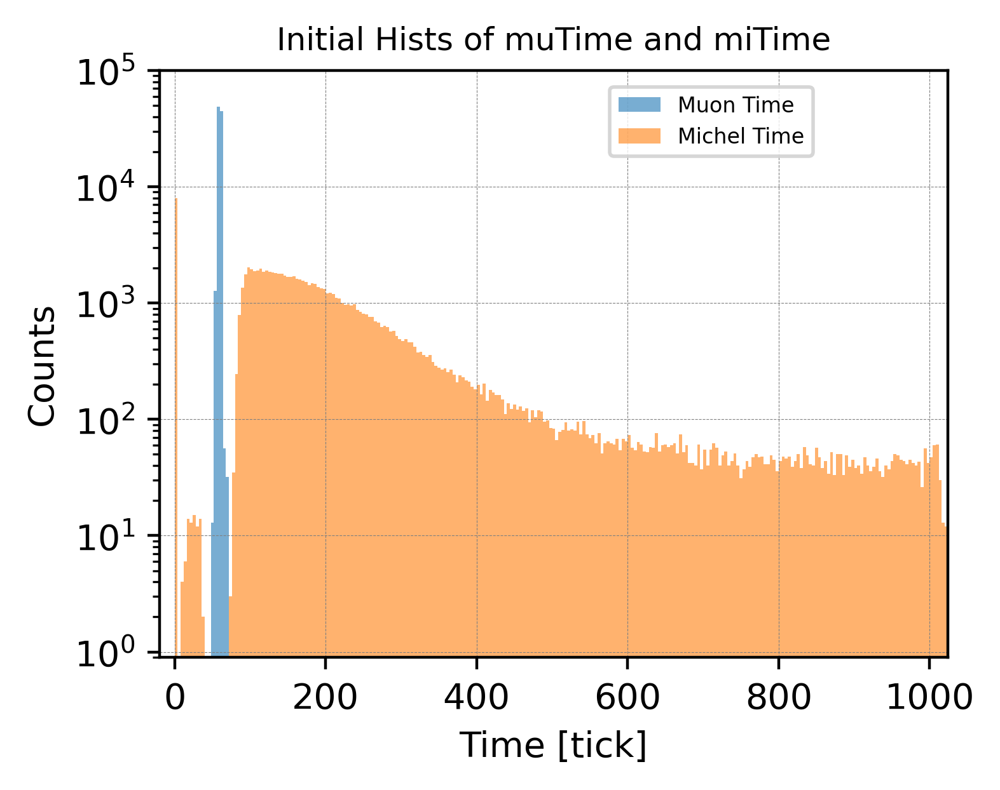




Lifetime distribution (Updated):
# Initial Candidates [-16000, 16000]:  95161


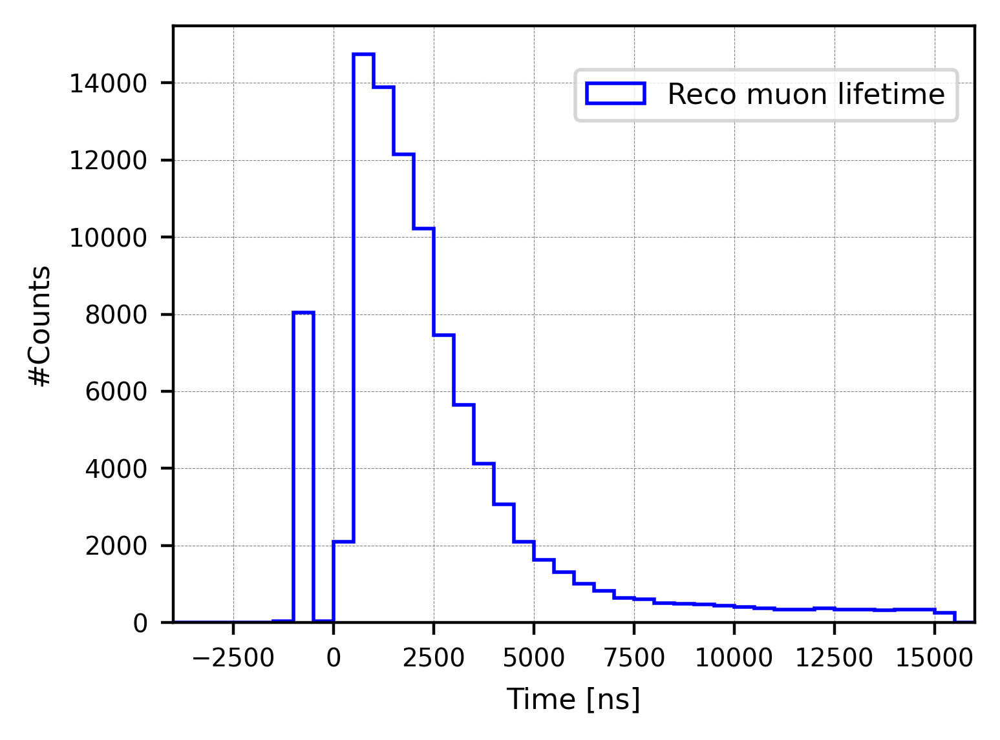

In [8]:
events_reco_update1 = []

lifetime_reco_update1 = []

events_reco_update1X = []


for ev in events_reco_initial:
    muTime = ev.muon_time
    miTime = ev.michel_time

    #if 50 <= muTime <= 65:
    if 50 <= muTime <= 70:
        events_reco_update1.append(ev)
        t = miTime-muTime
        lifetime_reco_update1.append(t)

        if muTime < miTime:
            events_reco_update1X.append(ev)


print("Muon events selection (mu peak constrained to [50, 65]):")
print("Updated Muon events: ", len(events_reco_update1), "/", len(events_reco_initial),
       "({:.2f}%)".format(len(events_reco_update1)/len(events_reco_initial)*100))

# Element-wise subtraction: (mi - mu) for each corresponding element
print("Length of time_difference (Updated): ", len(lifetime_reco_update1))


print("Adding muTIme < miTime:")
print("Updated Muon events: ", len(events_reco_update1X), "/", len(events_reco_initial),
       "({:.2f}%)".format(len(events_reco_update1X)/len(events_reco_initial)*100))








#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

muTime_update = [ev.muon_time for ev in events_reco_update1]
miTime_update = [ev.michel_time for ev in events_reco_update1]


# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muTime_update, bins=bins, alpha=0.6, label='Muon Time')
plt.hist(miTime_update, bins=bins, alpha=0.6, label='Michel Time')

plt.xlabel('Time [tick]')
plt.ylabel('Counts')
plt.yscale('log')
plt.xlim(-20, 1024)
plt.ylim(0.9, 100000)
plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()








# #Initial_X Mu and Michel time distributions=================================================
# plt.figure(figsize=(4,3),dpi=400)

# muTime_update = [ev.muon_time for ev in events_reco_update1X]
# miTime_update = [ev.michel_time for ev in events_reco_update1X]


# # Example: set your bin parameters
# range_min_initial = 0
# range_max_initial = 1024
# bin_width_initial = 4  # You can change this value; default: 4
# bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# # Plot histograms on the same canvas
# plt.hist(muTime_update, bins=bins, alpha=0.6, label='Muon Time')
# plt.hist(miTime_update, bins=bins, alpha=0.6, label='Michel Time')

# plt.xlabel('Time [tick]')
# plt.ylabel('Counts')
# plt.yscale('log')
# plt.xlim(-20, 1024)
# plt.ylim(0.9, 100000)
# #plt.title('Initial Hists of muTime and miTime', fontsize=9)

# plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
# plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

# plt.show()






# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Convert to ns (assuming mu_lifetime is already defined)
timdeDiff_update_ns = [value * 16 for value in lifetime_reco_update1]#reco lifetime---



print("\n\n\nLifetime distribution (Updated):")
print("# Initial Candidates [-16000, 16000]: ", len(timdeDiff_update_ns))

# Define histogram parameters
bin_width = 500
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(timdeDiff_update_ns, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')



plt.xlim(-4000, 16000)
#plt.ylim(0.9, 5000)
#plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()






<br />
<br />
<br />
<br />


### Purification / cut 3: remove events with unphysical lifetime (constrain lifetime to [500, inf))

#### (20251022): lifetime cut should be >0 here (we know later that 500 is NOT a good standard)




Lifetime distribution (Updated):
# Updated Candidates [0, 16000]:  87055


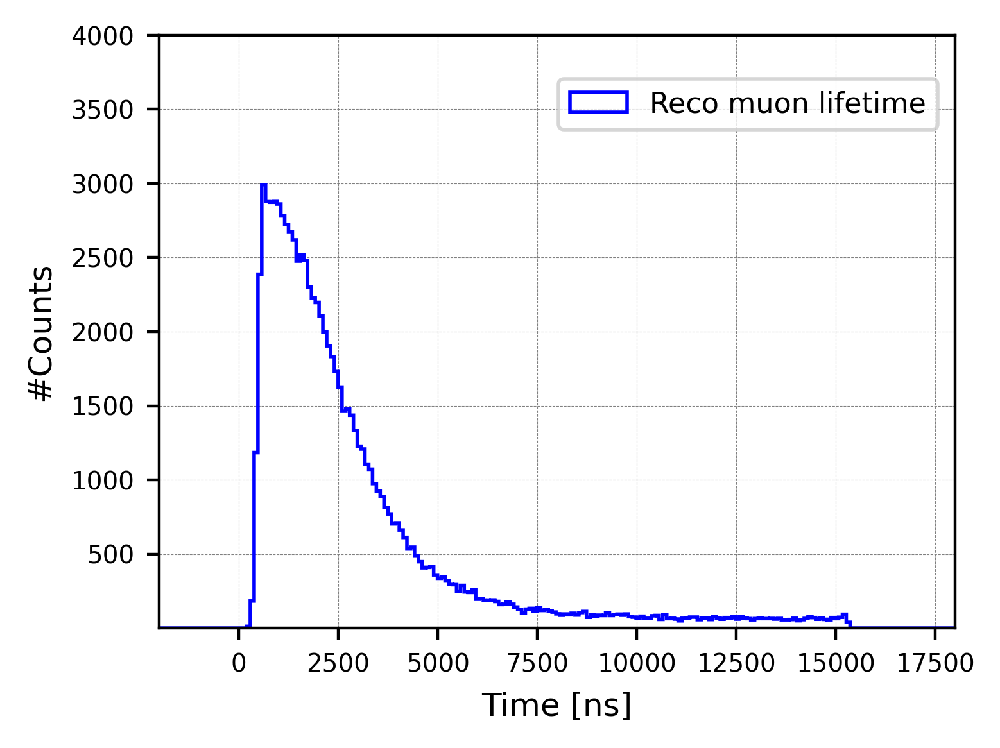

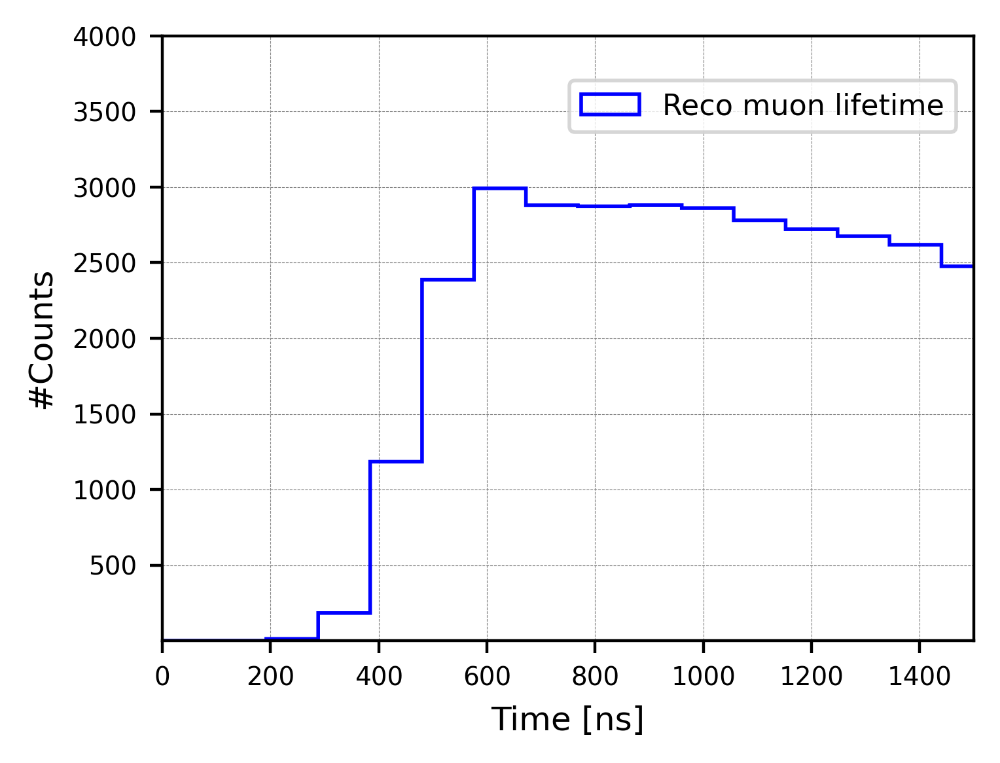

In [9]:
events_reco_update2 = []#Dataset after Purification 2---
lifetime_reco_update2 = []

for ev in events_reco_update1:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---

    if 0 <= timeDiff: #keep physical events here---
        events_reco_update2.append(ev)
        lifetime_reco_update2.append(timeDiff)


print("\n\n\nLifetime distribution (Updated):")
print("# Updated Candidates [0, 16000]: ", len(events_reco_update2))






# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(lifetime_reco_update2, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')

#plt.plot([-2000, 20000], [5, 5], color="green", linewidth=0.8, linestyle='--', label='y = 5')
#plt.plot([-2000, 20000], [10, 10], color="magenta", linewidth=0.8, linestyle='--', label='y = 10')

plt.xlim(-2000, 18000)
plt.ylim(0.9, 4000)
#plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=9)
plt.ylabel('#Counts', fontsize=9)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()









# zoomed-in plot--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(lifetime_reco_update2, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')



plt.xlim(0, 1500)
plt.ylim(0.9, 4000)
plt.xlabel('Time [ns]', fontsize=9)
plt.ylabel('#Counts', fontsize=9)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()



<br />
<br />
<br />
<br />
<br />
<br />
<br />

## Explore Dataset After purification 3 [RecoT>0]:

In [10]:
@dataclass
class PdsEventNew: #new class containing reco lifetime, true lifetime & diff
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None 
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None 
    reco_lifetime: Optional[float] = None
    michel_rise: Optional[float] = None
    michel_drop: Optional[float] = None



#Test print---------------
print("Size of events_reco_update2 (previous class): ", len(events_reco_update2))



#Rise is intensity related: rise ~ intensity / time; 20251207---
#Shifted and scaled from MC & DATA comparison---
#miInt_DATA_scaled = 2.5 * np.array(miInt_diff) - 0.45



#New calculated reco & true lifetime lists:
recoLife_update2 = []

michel_rise_slope = []
michel_drop_slope = []

for ev in events_reco_update2:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---

    recoLife_update2.append(timeDiff)

#    left_slope = ev.mi_leftHeight / (miTime - ev.mi_leftTurn)
#    right_slope = ev.mi_rightHeight / (ev.mi_rightTurn - miTime)
    left_slope = (2.5 * ev.mi_leftHeight - 0.45) / (miTime - ev.mi_leftTurn) #20251207---
    right_slope = (2.5 * ev.mi_rightHeight - 0.45) / (ev.mi_rightTurn - miTime)


#    left_slope = (miTime - ev.mi_leftTurn)
#    right_slope = (ev.mi_rightTurn - miTime)

    michel_rise_slope.append(left_slope)
    michel_drop_slope.append(right_slope)

print("Size of lifetime_reco_update2               : ", len(recoLife_update2))



#Final events with new features----------
events_newClass = []
for ev, reco_life, rise, drop in zip(
    events_reco_update2, 
    recoLife_update2,
    michel_rise_slope,
    michel_drop_slope
    ):
    new_ev = PdsEventNew(
        muon_time=ev.muon_time,
        michel_time=ev.michel_time,
        muon_intensity=ev.muon_intensity,
        michel_intensity=ev.michel_intensity,
        third_intensity=ev.third_intensity,
        posX=ev.posX,
        posY=ev.posY,
        posZ=ev.posZ,
        eventID=ev.eventID,
        trackID=ev.trackID,
        date=ev.date,
        michel_score=ev.michel_score,
        michel_hits=ev.michel_hits, 
        reco_lifetime=reco_life,
        michel_rise=rise,
        michel_drop=drop
    )
    events_newClass.append(new_ev)

print("\nLength of final dataset in format of new class: ", len(events_newClass))




Size of events_reco_update2 (previous class):  87055
Size of lifetime_reco_update2               :  87055

Length of final dataset in format of new class:  87055


<br />
<br />
<br />
<br />

### MC DATA Intensity Comparison:

Array sizes:
  DATA muon          : 87055
  DATA Michel        : 87055
  MC muon            : 230076
  MC Michel (total)  : 230076
  MC Michel (true )  : 96212
  MC Michel (bkg  )  : 133864


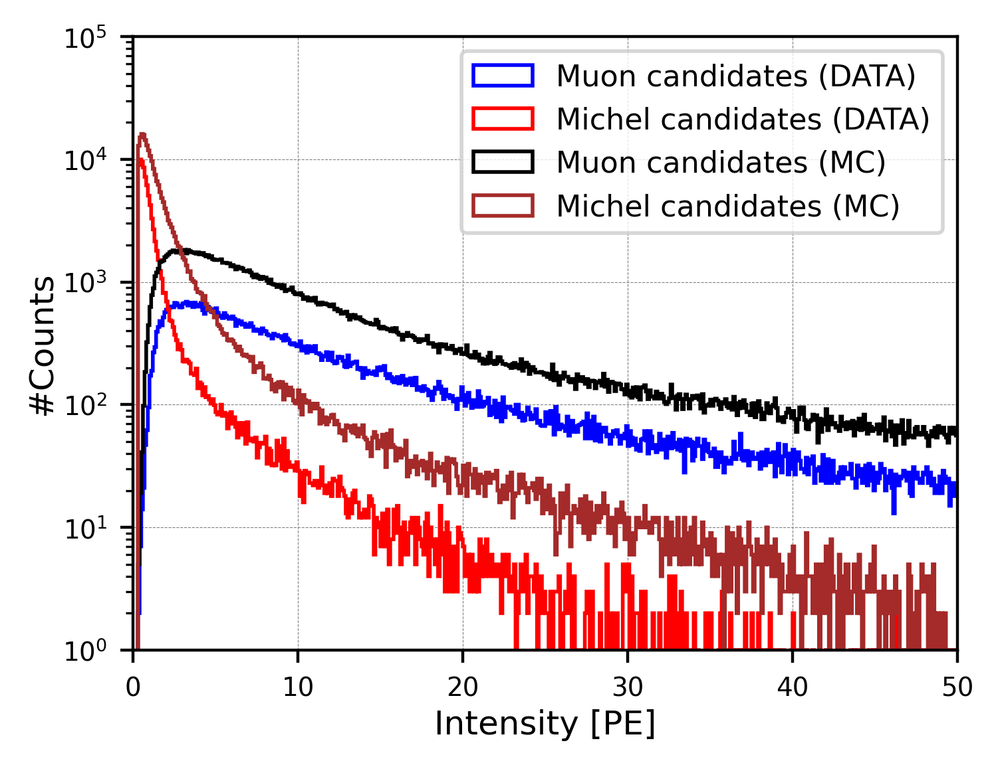

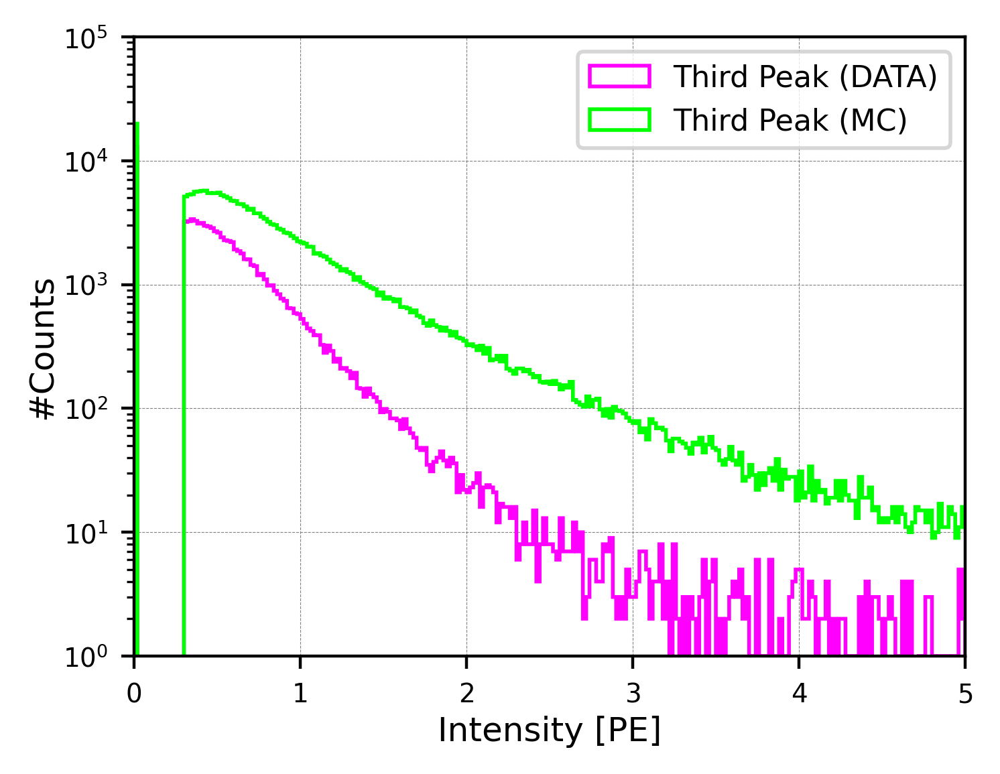

In [11]:
from scipy.stats import gaussian_kde
from matplotlib import colors
import matplotlib.patches as mpatches
from iminuit import Minuit
import numpy as np
import matplotlib.pyplot as plt

#============================================================
# 1. Prepare arrays
# ============================================================
recoLife_diff = [ev.reco_lifetime for ev in events_newClass]
muInt_diff = [ev.muon_intensity for ev in events_newClass]
miInt_diff = [ev.michel_intensity for ev in events_newClass]
thirdInt_diff = [ev.third_intensity for ev in events_newClass]
X_diff = [ev.posX for ev in events_newClass]

muInt_diff = np.array(muInt_diff, dtype=float)
miInt_diff = np.array(miInt_diff, dtype=float)

# Compare with MC ====================================
# muInt_total_MC = np.load("../MC_new20251010_70s/muInt_total_MC.npy")
# miInt_total_MC = np.load("../MC_new20251010_70s/miInt_total_MC.npy")
# thirdInt_total_MC = np.load("../MC_new20251010_70s/thirdInt_total_MC.npy")
# miInt_diff0_MC = np.load("../MC_new20251010_70s/miInt_diff0_MC.npy")
# miInt_diff500_MC = np.load("../MC_new20251010_70s/miInt_diff500_MC.npy")
muInt_total_MC = np.load("../MC_official2025/muInt_total_MC.npy")
miInt_total_MC = np.load("../MC_official2025/miInt_total_MC.npy")
thirdInt_total_MC = np.load("../MC_official2025/thirdInt_total_MC.npy")
miInt_diff0_MC = np.load("../MC_official2025/miInt_diff0_MC.npy")
miInt_diff500_MC = np.load("../MC_official2025/miInt_diff500_MC.npy")
# muInt_total_MC = np.load("../MC_official2025/muInt_new2025_MC.npy")
# miInt_total_MC = np.load("../MC_official2025/miInt_new2025_MC.npy")
# thirdInt_total_MC = np.load("../MC_official2025/thirdInt_new2025_MC.npy")
# miInt_diff0_MC = np.load("../MC_official2025/miInt_diff0_MC.npy")
# miInt_diff500_MC = np.load("../MC_official2025/miInt_diff500_MC.npy")

muInt_total_MC = np.array(muInt_total_MC, dtype=float)
miInt_total_MC = np.array(miInt_total_MC, dtype=float)
miInt_diff0_MC = np.array(miInt_diff0_MC, dtype=float)
miInt_diff500_MC = np.array(miInt_diff500_MC, dtype=float)

print("Array sizes:")
print(f"  DATA muon          : {len(muInt_diff)}")
print(f"  DATA Michel        : {len(miInt_diff)}")
print(f"  MC muon            : {len(muInt_total_MC)}")
print(f"  MC Michel (total)  : {len(miInt_total_MC)}")
print(f"  MC Michel (true )  : {len(miInt_diff0_MC)}")
print(f"  MC Michel (bkg  )  : {len(miInt_diff500_MC)}")




plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.1
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_diff, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Muon candidates (DATA)")
plt.hist(miInt_diff, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label="Michel candidates (DATA)")

plt.hist(muInt_total_MC, bins=bins, range=(range_min, range_max), edgecolor='black',
         histtype='step', linewidth=1.0, label="Muon candidates (MC)")
plt.hist(miInt_total_MC, bins=bins, range=(range_min, range_max), edgecolor='brown', 
         histtype='step', linewidth=1.0, label="Michel candidates (MC)")

#plt.plot([1, 1], [0, 40000], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([4, 4], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 50)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=9)
plt.ylabel('#Counts', labelpad=1, fontsize=9)
plt.ylim(1, 100000)
plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.title('Data MC Intensity Comparison', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 






# 3rd peak intensity distributions----------
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.02
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(thirdInt_diff, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=1.0, label="Third Peak (DATA)")

plt.hist(thirdInt_total_MC, bins=bins, range=(range_min, range_max), edgecolor='lime',
         histtype='step', linewidth=1.0, label="Third Peak (MC)")

#plt.plot([1, 1], [0, 40000], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([4, 4], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 5)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=9)
plt.ylabel('#Counts', labelpad=1, fontsize=9)
plt.ylim(1, 100000)
plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.title('Data MC Intensity Comparison', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 


<br />

### Muon Scaling:
For the muon scaling fit, a good practical choice is fit window [0.3, 20] with bin width 0.1.

##### Muon intensity scaling

To compare the muon intensity distributions between DATA and MC, a linear transformation
is applied to the MC intensity:

$$
I_{\mathrm{MC}}^{\mathrm{scaled}} = a\, I_{\mathrm{MC}} + b ,
$$

where \(a\) is a multiplicative scaling factor and \(b\) is an additive shift.

The predicted MC counts in histogram bin \(i\) are then

$$
M_i(a,b,N) = N \, H_i\!\left(a\, I_{\mathrm{MC}} + b\right),
$$

where

- \($H_i$\) is the number of MC events falling into bin \(i\) after the intensity transformation,
- \(N\) is an overall normalization factor accounting for the different sample sizes of DATA and MC.

The parameters \((a,b,N)\) are determined by minimizing the following \($\chi^2$\) function:

$$
\chi^2(a,b,N)
=
\sum_{i}
\frac{\left[D_i - M_i(a,b,N)\right]^2}
{D_i + M_i(a,b,N) + 1},
$$

where \(D_i\) denotes the number of DATA events in bin \(i\).

The best-fit parameters are therefore obtained from

$$
(a^*, b^*, N^*)
=
\operatorname*{argmin}_{a,b,N} \chi^2(a,b,N).
$$

The resulting transformation is applied to the MC intensity distribution to obtain the
DATA–MC comparison for muon candidates.

In [12]:

# ============================================================
# 2. Fit settings
# ============================================================
fit_min = 0.3
fit_max = 20.0
fit_bin_width = 0.1
fit_bins = np.arange(fit_min, fit_max + fit_bin_width, fit_bin_width)
fit_bin_centers = 0.5 * (fit_bins[:-1] + fit_bins[1:])

print(f"Number of bins = {len(fit_bins) - 1}")



# ============================================================
# 3. Helper functions
# ============================================================
def transform_mc(mc_array, x_scale, x_shift):
    return x_scale * mc_array + x_shift


def make_hist(array, bins):
    hist, edges = np.histogram(array, bins=bins)
    return hist.astype(float), edges


# ============================================================
# 4. Fit wrapper using Minuit
# ============================================================
def fit_data_mc_scaling_minuit(
    data_array,
    mc_array,
    bins,
    init_x_scale=1.0,
    init_x_shift=0.0,
    init_y_scale=1.0,
    fit_name="sample"
):
    data_hist, edges = np.histogram(data_array, bins=bins)
    data_hist = data_hist.astype(float)

    def chi2(x_scale, x_shift, y_scale):
        if x_scale <= 0.0 or y_scale <= 0.0:
            return 1.0e30

        mc_transformed = transform_mc(mc_array, x_scale, x_shift)
        mc_hist, _ = np.histogram(mc_transformed, bins=bins)
        mc_hist = mc_hist.astype(float)

        mc_hist_scaled = y_scale * mc_hist

        # Safe variance
        sigma2 = data_hist + mc_hist_scaled + 1.0

        value = np.sum((data_hist - mc_hist_scaled) ** 2 / sigma2)
        return value

    m = Minuit(
        chi2,
        x_scale=init_x_scale,
        x_shift=init_x_shift,
        y_scale=init_y_scale
    )

    # χ2 fit
    m.errordef = Minuit.LEAST_SQUARES

    # Parameter limits
    m.limits["x_scale"] = (1.0e-6, None)
    m.limits["y_scale"] = (1.0e-12, None)
    # x_shift can be positive or negative, so leave it free
    # If you want, you may later constrain it:
    # m.limits["x_shift"] = (-1.0, 1.0)

    m.migrad()
    m.hesse()

    best_x_scale = m.values["x_scale"]
    best_x_shift = m.values["x_shift"]
    best_y_scale = m.values["y_scale"]

    err_x_scale = m.errors["x_scale"]
    err_x_shift = m.errors["x_shift"]
    err_y_scale = m.errors["y_scale"]

    mc_best = transform_mc(mc_array, best_x_scale, best_x_shift)
    mc_hist, _ = np.histogram(mc_best, bins=bins)
    mc_hist = mc_hist.astype(float)
    mc_hist_scaled = best_y_scale * mc_hist

    sigma2 = data_hist + mc_hist_scaled + 1.0
    chi2_val = np.sum((data_hist - mc_hist_scaled) ** 2 / sigma2)

    n_bins_used = len(data_hist)
    n_params = m.nfit
    ndf = n_bins_used - n_params
    chi2_ndf = chi2_val / ndf if ndf > 0 else np.nan

    fit_result = {
        "fit_name": fit_name,
        "success": m.fmin.is_valid,
        "message": str(m.fmin),
        "minuit": m,
        "x_scale": best_x_scale,
        "x_shift": best_x_shift,
        "y_scale": best_y_scale,
        "x_scale_err": err_x_scale,
        "x_shift_err": err_x_shift,
        "y_scale_err": err_y_scale,
        "chi2": chi2_val,
        "ndf": ndf,
        "chi2_ndf": chi2_ndf,
        "data_hist": data_hist,
        "mc_hist_scaled": mc_hist_scaled,
        "edges": edges,
        "bin_centers": 0.5 * (edges[:-1] + edges[1:]),
        "mc_best_array": mc_best
    }

    return fit_result


# # ============================================================
# # 5. Fit Michel candidates
# # ============================================================
# fit_michel = fit_data_mc_scaling_minuit(
#     data_array=miInt_diff,
#     mc_array=miInt_total_MC,
#     bins=fit_bins,
#     init_x_scale=0.5,
#     init_x_shift=0.1,
#     init_y_scale=0.1,
#     fit_name="Michel"
# )

# print("Michel fit result:")
# print(f"  success      = {fit_michel['success']}")
# print(f"  x_scale      = {fit_michel['x_scale']:.6f} +/- {fit_michel['x_scale_err']:.6f}")
# print(f"  x_shift      = {fit_michel['x_shift']:.6f} +/- {fit_michel['x_shift_err']:.6f}")
# print(f"  y_scale      = {fit_michel['y_scale']:.6f} +/- {fit_michel['y_scale_err']:.6f}")
# print(f"  chi2         = {fit_michel['chi2']:.3f}")
# print(f"  ndf          = {fit_michel['ndf']}")
# print(f"  chi2/ndf     = {fit_michel['chi2_ndf']:.3f}") 

# ============================================================
# 6. Fit muon candidates
# ============================================================
fit_muon = fit_data_mc_scaling_minuit(
    data_array=muInt_diff,
    mc_array=muInt_total_MC,
    bins=fit_bins,
    init_x_scale=1.0,
    init_x_shift=0.0,
    init_y_scale=0.1,
    fit_name="Muon"
)

print("Muon fit result:")
print(f"  success      = {fit_muon['success']}")
print(f"  x_scale      = {fit_muon['x_scale']:.6f} +/- {fit_muon['x_scale_err']:.6f}")
print(f"  x_shift      = {fit_muon['x_shift']:.6f} +/- {fit_muon['x_shift_err']:.6f}")
print(f"  y_scale      = {fit_muon['y_scale']:.6f} +/- {fit_muon['y_scale_err']:.6f}")
print(f"  chi2         = {fit_muon['chi2']:.3f}")
print(f"  ndf          = {fit_muon['ndf']}")
print(f"  chi2/ndf     = {fit_muon['chi2_ndf']:.3f}")

# ============================================================
# 7. Final summary
# ============================================================
print("Diagnosis of Muon fitting:")
print(fit_muon["message"])
print(fit_muon["minuit"].fmin)
print(fit_muon["minuit"].params)

m = fit_muon["minuit"]
print("is_valid =", m.fmin.is_valid)
print("has_accurate_covar =", m.fmin.has_accurate_covar)
print("has_posdef_covar =", m.fmin.has_posdef_covar)
print("hesse_failed =", m.fmin.hesse_failed)
print("has_valid_parameters =", m.fmin.has_valid_parameters)
print("edm =", m.fmin.edm)
print("nfcn =", m.fmin.nfcn)






Number of bins = 197
Muon fit result:
  success      = True
  x_scale      = 1.058096 +/- 0.000002
  x_shift      = -0.000005 +/- 0.000047
  y_scale      = 0.380398 +/- 0.002150
  chi2         = 156.409
  ndf          = 194
  chi2/ndf     = 0.806
Diagnosis of Muon fitting:
┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 156.4                      │              Nfcn = 912              │
│ EDM = 0.00164 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────

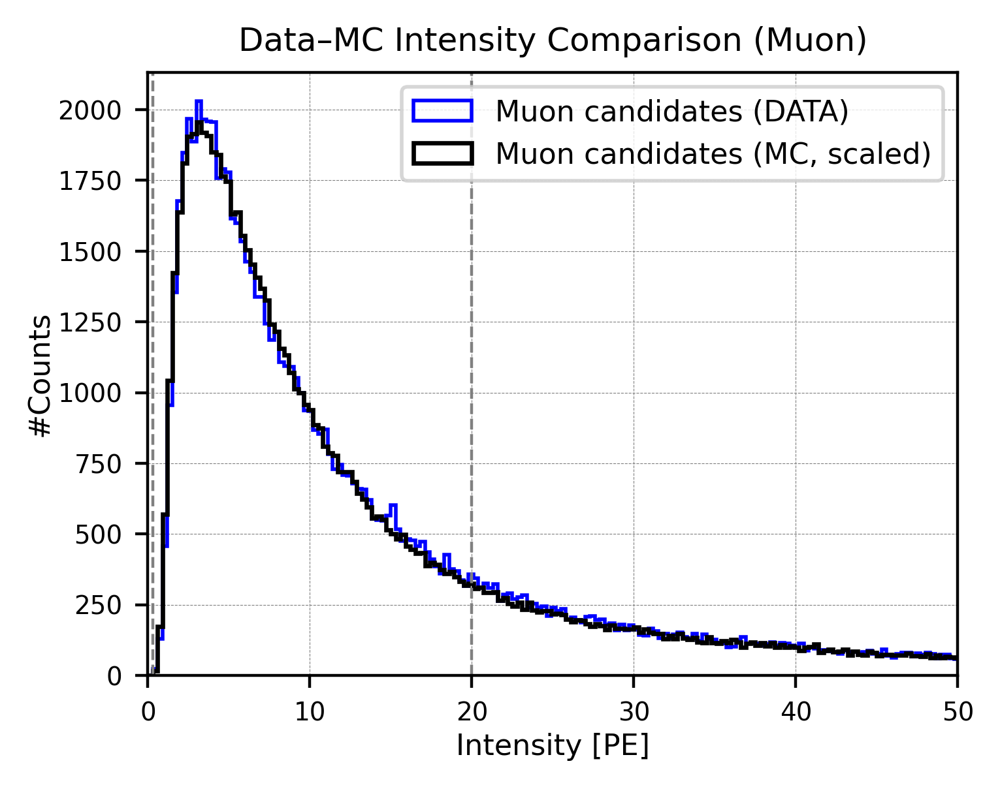

In [13]:
# Plotting=============================================================================
plt.figure(figsize=(4,3), dpi=400)

# ============================================================
# Plot settings
# ============================================================
plot_min = 0.0
plot_max = 50.0
plot_bin_width = 0.3
plot_bins = np.arange(plot_min, plot_max + plot_bin_width, plot_bin_width)


# ============================================================
# 1. Apply the fitted transformation to MC
# ============================================================
x_scale_mu = fit_muon["x_scale"]
x_shift_mu = fit_muon["x_shift"]
y_scale_mu = fit_muon["y_scale"]

muInt_MC_scaled = x_scale_mu * muInt_total_MC + x_shift_mu

# ============================================================
# 2. DATA histogram
# ============================================================
plt.hist(
    muInt_diff,
    bins=plot_bins,
    range=(range_min, range_max),
    histtype='step',
    edgecolor='blue',
    linewidth=1.0,
    label="Muon candidates (DATA)"
)

# ============================================================
# 3. MC histogram (scaled)
# ============================================================
weights_MC_mu = np.full(len(muInt_MC_scaled), y_scale_mu)

plt.hist(
    muInt_MC_scaled,
    bins=plot_bins,
    range=(range_min, range_max),
    histtype='step',
    linewidth=1.2,
    color='black',
    weights=weights_MC_mu,
    label="Muon candidates (MC, scaled)"
)

#Show fit range:
plt.axvline(fit_min, color='gray', linestyle='--', linewidth=0.8)
plt.axvline(fit_max, color='gray', linestyle='--', linewidth=0.8)


# ============================================================
# 4. Plot styling
# ============================================================
plt.xlim(0, 50)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)

#plt.ylim(1, 2000)
#plt.yscale('log')

plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.title('Data–MC Intensity Comparison (Muon)', fontsize=9)
plt.legend(fontsize=8, loc="upper right")

plt.show()

<br />

### Michel scaling:

#### Sample comparison:


Summary diagnostics:
  Mean DATA Michel       = 1.57
  Mean MC Total.         = 2.38
  Mean pure Michel MC    = 3.24
  Mean Michel bkg MC     = 1.77


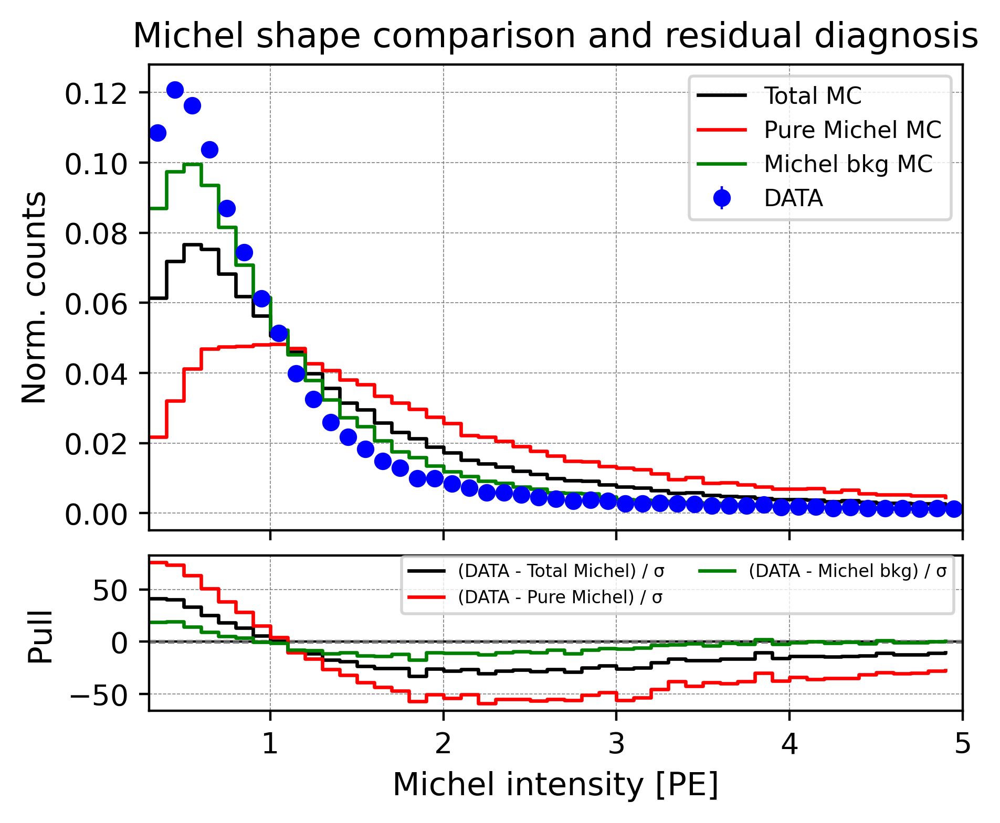

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# ============================================================
# STYLE CONTROLS
# ============================================================
marker_size = 5
title_size  = 12
label_size  = 11
tick_size   = 10
legend_size = 8
line_width  = 1.2
grid_width  = 0.3
print_precision = 2

# ============================================================
# HISTOGRAM SETTINGS
# ============================================================
xmin = 0.3
xmax = 5
bin_width = 0.1

bins = np.arange(xmin, xmax + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])

# ============================================================
# INPUT ARRAYS
# ============================================================
data = np.asarray(miInt_diff, dtype=float)
mcTotal  = np.asarray(miInt_total_MC, dtype=float)
sig  = np.asarray(miInt_diff0_MC, dtype=float)
bkg  = np.asarray(miInt_diff500_MC, dtype=float)

# ============================================================
# PRINT SUMMARY
# ============================================================
mean_data = np.mean(data)
mean_mcTotal = np.mean(mcTotal)
mean_sig  = np.mean(sig)
mean_bkg  = np.mean(bkg)

print("\nSummary diagnostics:")
print(f"  Mean DATA Michel       = {mean_data:.{print_precision}f}")
print(f"  Mean MC Total.         = {mean_mcTotal:.{print_precision}f}")
print(f"  Mean pure Michel MC    = {mean_sig:.{print_precision}f}")
print(f"  Mean Michel bkg MC     = {mean_bkg:.{print_precision}f}")

# ============================================================
# HISTOGRAMS
# ============================================================
data_hist, _ = np.histogram(data, bins=bins)
mcTotal_hist, _ = np.histogram(mcTotal, bins=bins)
sig_hist,  _ = np.histogram(sig,  bins=bins)
bkg_hist,  _ = np.histogram(bkg,  bins=bins)

data_hist = data_hist.astype(float)
mcTotal_hist = mcTotal_hist.astype(float)
sig_hist  = sig_hist.astype(float)
bkg_hist  = bkg_hist.astype(float)

# Normalize to shapes
data_shape = data_hist / np.sum(data_hist)
mcTotal_shape = mcTotal_hist / np.sum(mcTotal_hist)
sig_shape  = sig_hist  / np.sum(sig_hist)
bkg_shape  = bkg_hist  / np.sum(bkg_hist)

# DATA uncertainty on normalized shape
n_data = np.sum(data_hist)
data_err = np.sqrt(data_hist) / n_data

# Pulls
sigma = np.where(data_err > 0, data_err, np.nan)
pull_mcTotal = (data_shape - mcTotal_shape) / sigma
pull_sig = (data_shape - sig_shape) / sigma
pull_bkg = (data_shape - bkg_shape) / sigma

# ============================================================
# PLOT
# ============================================================
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[3, 1], hspace=0.08)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# -------------------- Top panel --------------------
ax1.errorbar(
    centers, data_shape, yerr=data_err,
    fmt='o', color='blue', markersize=marker_size,
    linewidth=0.8, label='DATA'
)

ax1.step(
    bins[:-1], mcTotal_shape, where='post',
    color='black', linewidth=line_width, label='Total MC'
)


ax1.step(
    bins[:-1], sig_shape, where='post',
    color='red', linewidth=line_width, label='Pure Michel MC'
)

ax1.step(
    bins[:-1], bkg_shape, where='post',
    color='green', linewidth=line_width, label='Michel bkg MC'
)

ax1.set_ylabel("Norm. counts", fontsize=label_size)
ax1.set_title("Michel shape comparison and residual diagnosis", fontsize=title_size)
ax1.tick_params(labelsize=tick_size)
ax1.grid(color='gray', linestyle='--', linewidth=grid_width)
ax1.legend(fontsize=legend_size, loc='upper right')

# Hide top x tick labels to match your shared style
ax1.tick_params(labelbottom=False)

# -------------------- Bottom panel --------------------
ax2.axhline(0.0, color='black', linewidth=0.8)
ax2.axhline(1.0, color='gray', linestyle='--', linewidth=0.6)
ax2.axhline(-1.0, color='gray', linestyle='--', linewidth=0.6)

ax2.step(
    bins[:-1], pull_mcTotal, where='post',
    color='black', linewidth=line_width, label='(DATA - Total Michel) / σ'
)

ax2.step(
    bins[:-1], pull_sig, where='post',
    color='red', linewidth=line_width, label='(DATA - Pure Michel) / σ'
)

ax2.step(
    bins[:-1], pull_bkg, where='post',
    color='green', linewidth=line_width, label='(DATA - Michel bkg) / σ'
)

ax2.set_xlim(xmin, xmax)
ax2.set_xlabel("Michel intensity [PE]", fontsize=label_size)
ax2.set_ylabel("Pull", fontsize=label_size)
ax2.tick_params(labelsize=tick_size)
ax2.grid(color='gray', linestyle='--', linewidth=grid_width)
ax2.legend(fontsize=6, loc='upper right', bbox_to_anchor=(1.0, 1.05), ncol=2, markerscale=0.7)

plt.show()

<br />


#### Approach 1: true Michel + background mixture

To compare the Michel intensity distributions between DATA and MC, the DATA Michel sample is modeled as a mixture of the true Michel MC template and the Michel background MC template.  
A linear transformation is applied to the true Michel MC intensity:

$$
I_{\mathrm{sig}}^{\mathrm{scaled}} = a\, I_{\mathrm{sig}} + b ,
$$

where $a$ is a multiplicative scaling factor and $b$ is an additive shift.

The predicted counts in histogram bin $i$ are then

$$
M_i(a,b,f_{\mathrm{bkg}})
=
N_{\mathrm{data}}
\left[
(1-f_{\mathrm{bkg}})\,S_i(a,b)
+
f_{\mathrm{bkg}}\,B_i
\right],
$$

where

- $S_i(a,b)$ is the normalized true Michel MC template in bin $i$ after the intensity transformation,
- $B_i$ is the normalized Michel background MC template in bin $i$,
- $f_{\mathrm{bkg}}$ is the background fraction in the DATA Michel sample,
- $N_{\mathrm{data}}$ is the total number of DATA Michel candidates.

The parameters $(a,b,f_{\mathrm{bkg}})$ are determined by minimizing the following $\chi^2$ function:

$$
\chi^2(a,b,f_{\mathrm{bkg}})
=
\sum_i
\frac{\left[D_i - M_i(a,b,f_{\mathrm{bkg}})\right]^2}
{D_i + M_i(a,b,f_{\mathrm{bkg}}) + 1},
$$

where $D_i$ denotes the number of DATA events in bin $i$.

The best-fit parameters are therefore obtained from

$$
(a^*, b^*, f_{\mathrm{bkg}}^*)
=
\operatorname*{argmin}_{a,b,f_{\mathrm{bkg}}}
\chi^2(a,b,f_{\mathrm{bkg}}).
$$

In [15]:
# ============================================================
# 2. Use the muon-fit scaling result for Michel background
# ============================================================
x_scale_bkg = 1.0   # effective scaling result of mu / fixed background scaling
x_shift_bkg = 0.0

print("Using fixed background scaling:")
print(f"  x_scale_bkg = {x_scale_bkg:.6f}")
print(f"  x_shift_bkg = {x_shift_bkg:.6f}")


# ============================================================
# 3. Fit settings for Michel 3-parameter fit
# ============================================================
fit_min = 0.3
fit_max = 10.0
bin_width = 0.1

bins = np.arange(fit_min, fit_max + bin_width, bin_width)
bin_centers = 0.5 * (bins[:-1] + bins[1:])

print(f"Michel fit window = [{fit_min}, {fit_max}]")
print(f"Michel bin width  = {bin_width}")
print(f"Number of bins    = {len(bins) - 1}")


# ============================================================
# 4. Prepare DATA histogram once
# ============================================================
data_hist, edges = np.histogram(miInt_diff, bins=bins)
data_hist = data_hist.astype(float)

n_data = len(miInt_diff)


# ============================================================
# 5. 3-parameter fit:
#    float x_scale_sig, x_shift_sig, f_bkg
#    fix Michel background scaling
# ============================================================
def chi2_3par(x_scale_sig, x_shift_sig, f_bkg):
    if x_scale_sig <= 0.0:
        return 1.0e30
    if not (0.0 <= f_bkg <= 1.0):
        return 1.0e30

    # transform templates
    sig_scaled = transform_mc(miInt_diff0_MC, x_scale_sig, x_shift_sig)
    bkg_scaled = transform_mc(miInt_diff500_MC, x_scale_bkg, x_shift_bkg)

    # make histograms
    sig_hist, _ = np.histogram(sig_scaled, bins=bins)
    bkg_hist, _ = np.histogram(bkg_scaled, bins=bins)

    sig_hist = sig_hist.astype(float)
    bkg_hist = bkg_hist.astype(float)

    # avoid empty histograms
    if np.sum(sig_hist) <= 0.0 or np.sum(bkg_hist) <= 0.0:
        return 1.0e30

    # normalize MC templates to shapes
    sig_shape = sig_hist / np.sum(sig_hist)
    bkg_shape = bkg_hist / np.sum(bkg_hist)

    # prediction: total normalization fixed to DATA size
    pred = n_data * ((1.0 - f_bkg) * sig_shape + f_bkg * bkg_shape)

    sigma2 = data_hist + pred + 1.0
    return np.sum((data_hist - pred) ** 2 / sigma2)


m3 = Minuit(
    chi2_3par,
    x_scale_sig = 1.0,
    x_shift_sig = 0.0,
    f_bkg       = 0.30
)

m3.errordef = Minuit.LEAST_SQUARES
m3.limits["x_scale_sig"] = (1.0e-6, None)
m3.limits["f_bkg"] = (0.0, 1.0)

m3.simplex()
m3.migrad()
m3.hesse()

best_x_scale_sig_3par = m3.values["x_scale_sig"]
best_x_shift_sig_3par = m3.values["x_shift_sig"]
best_f_bkg_3par       = m3.values["f_bkg"]

err_x_scale_sig_3par = m3.errors["x_scale_sig"]
err_x_shift_sig_3par = m3.errors["x_shift_sig"]
err_f_bkg_3par       = m3.errors["f_bkg"]


# ============================================================
# 6. Build best-fit prediction
# ============================================================
sig_scaled_best = transform_mc(miInt_diff0_MC, best_x_scale_sig_3par, best_x_shift_sig_3par)
bkg_scaled_best = transform_mc(miInt_diff500_MC, x_scale_bkg, x_shift_bkg)

sig_hist_best, _ = np.histogram(sig_scaled_best, bins=bins)
bkg_hist_best, _ = np.histogram(bkg_scaled_best, bins=bins)

sig_hist_best = sig_hist_best.astype(float)
bkg_hist_best = bkg_hist_best.astype(float)

sig_shape_best = sig_hist_best / np.sum(sig_hist_best)
bkg_shape_best = bkg_hist_best / np.sum(bkg_hist_best)

pred_3par = n_data * ((1.0 - best_f_bkg_3par) * sig_shape_best + best_f_bkg_3par * bkg_shape_best)
sig_comp_3par = n_data * (1.0 - best_f_bkg_3par) * sig_shape_best
bkg_comp_3par = n_data * best_f_bkg_3par * bkg_shape_best

sigma2_3par = data_hist + pred_3par + 1.0
chi2_val_3par = np.sum((data_hist - pred_3par) ** 2 / sigma2_3par)
ndf_3par = len(data_hist) - 3
chi2_ndf_3par = chi2_val_3par / ndf_3par


# ============================================================
# 7. Print fit result
# ============================================================
print("\n==================================================")
print("Michel 3-parameter fit result")
print("==================================================")
print(f"  success        = {m3.fmin.is_valid}")
print(f"  x_scale_sig    = {best_x_scale_sig_3par:.6f} +/- {err_x_scale_sig_3par:.6f}")
print(f"  x_shift_sig    = {best_x_shift_sig_3par:.6f} +/- {err_x_shift_sig_3par:.6f}")
print(f"  f_bkg          = {best_f_bkg_3par:.6f} +/- {err_f_bkg_3par:.6f}")
print(f"  chi2           = {chi2_val_3par:.3f}")
print(f"  ndf            = {ndf_3par}")
print(f"  chi2/ndf       = {chi2_ndf_3par:.3f}")

print("\nDiagnosis of Michel 3-parameter fitting:")
print(m3.fmin)

print("\nShu: The above fitting result tests whether scaled pure Michel + fixed Michel background can describe the DATA Michel sample...")

Using fixed background scaling:
  x_scale_bkg = 1.000000
  x_shift_bkg = 0.000000
Michel fit window = [0.3, 10.0]
Michel bin width  = 0.1
Number of bins    = 97

Michel 3-parameter fit result
  success        = False
  x_scale_sig    = 0.316680 +/- 0.000001
  x_shift_sig    = 0.176170 +/- 0.000009
  f_bkg          = 0.254410 +/- 0.019800
  chi2           = 330.167
  ndf            = 94
  chi2/ndf       = 3.512

Diagnosis of Michel 3-parameter fitting:
┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 330.2                      │             Nfcn = 1013              │
│ EDM = 1.22 (Goal: 0.0002)        │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │   ABOVE EDM threshold (goal x 10)    │
├───────────

#### Approach 2: total MC template (The same as the muon scaling in principle) [Current Best!]

To compare the Michel intensity distributions between DATA and MC, the total MC Michel-candidate sample is used as a single template.  
A linear transformation is applied to the MC intensity:

$$
I_{\mathrm{MC}}^{\mathrm{scaled}} = a\, I_{\mathrm{MC}} + b ,
$$

where $a$ is a multiplicative scaling factor and $b$ is an additive shift.

The predicted MC counts in histogram bin $i$ are then

$$
M_i(a,b)
=
N_{\mathrm{data}}\,T_i(a,b),
$$

where

- $T_i(a,b)$ is the normalized total MC Michel template in bin $i$ after the intensity transformation,
- $N_{\mathrm{data}}$ is the total number of DATA Michel candidates.

The parameters $(a,b)$ are determined by minimizing the following $\chi^2$ function:

$$
\chi^2(a,b)
=
\sum_i
\frac{\left[D_i - M_i(a,b)\right]^2}
{D_i + M_i(a,b) + 1},
$$

where $D_i$ denotes the number of DATA events in bin $i$.

The best-fit parameters are therefore obtained from

$$
(a^*, b^*)
=
\operatorname*{argmin}_{a,b}
\chi^2(a,b).
$$

In [16]:
from iminuit import Minuit
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1. Fit settings
# ============================================================

fit_min = 0.3
fit_max = 20
bin_width = 0.1

bins = np.arange(fit_min, fit_max + bin_width, bin_width)

print(f"Michel fit window   = [{fit_min}, {fit_max}]")
print(f"Michel bin width    = {bin_width}")
print(f"Number of bins      = {len(bins)-1}")

# ============================================================
# 2. Input arrays
# ============================================================

data_intensity = miInt_diff
template_intensity = miInt_total_MC

# ============================================================
# 3. Helper: linear transformation of template
# ============================================================

def transform_template(arr, scale, shift):
    return scale * arr + shift

# ============================================================
# 4. Data histogram
# ============================================================

data_hist, _ = np.histogram(data_intensity, bins=bins)
data_hist = data_hist.astype(float)

n_data = len(data_intensity)

# ============================================================
# 5. Chi2 definition
# ============================================================

def chi2_template(scale_template, shift_template):

    if scale_template <= 0:
        return 1e30

    transformed_template = transform_template(
        template_intensity,
        scale_template,
        shift_template
    )

    template_hist, _ = np.histogram(transformed_template, bins=bins)
    template_hist = template_hist.astype(float)

    if np.sum(template_hist) <= 0:
        return 1e30

    template_shape = template_hist / np.sum(template_hist)

    prediction = n_data * template_shape

    sigma2 = data_hist + prediction + 1.0

    return np.sum((data_hist - prediction) ** 2 / sigma2)

# ============================================================
# 6. Run fit
# ============================================================

m = Minuit(
    chi2_template,
    scale_template = 1.0,
    shift_template = 0.0
)

m.errordef = Minuit.LEAST_SQUARES
m.limits["scale_template"] = (1e-6, None)

m.simplex()
m.migrad()
m.hesse()

scale_best = m.values["scale_template"]
shift_best = m.values["shift_template"]

scale_err = m.errors["scale_template"]
shift_err = m.errors["shift_template"]

# ============================================================
# 7. Build best-fit prediction
# ============================================================

template_transformed = transform_template(
    template_intensity,
    scale_best,
    shift_best
)

template_hist, _ = np.histogram(template_transformed, bins=bins)
template_hist = template_hist.astype(float)

template_shape = template_hist / np.sum(template_hist)

prediction = n_data * template_shape

sigma2 = data_hist + prediction + 1.0

chi2_val = np.sum((data_hist - prediction) ** 2 / sigma2)

ndf = len(data_hist) - 2
chi2_ndf = chi2_val / ndf

# ============================================================
# 8. Print result
# ============================================================

print("\n==================================================")
print("Michel template fit result")
print("==================================================")

print(f"success        = {m.fmin.is_valid}")
print(f"scale_template = {scale_best:.6f} +/- {scale_err:.6f}")
print(f"shift_template = {shift_best:.6f} +/- {shift_err:.6f}")

print(f"chi2           = {chi2_val:.3f}")
print(f"ndf            = {ndf}")
print(f"chi2/ndf       = {chi2_ndf:.3f}")

print("\nFit diagnostics")
print(m.fmin)




Michel fit window   = [0.3, 20]
Michel bin width    = 0.1
Number of bins      = 197

Michel template fit result
success        = False
scale_template = 0.547109 +/- 0.000002
shift_template = 0.143942 +/- 0.000007
chi2           = 518.825
ndf            = 195
chi2/ndf       = 2.661

Fit diagnostics
┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 518.8                      │              Nfcn = 382              │
│ EDM = 0.0329 (Goal: 0.0002)      │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │   ABOVE EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├────────────────

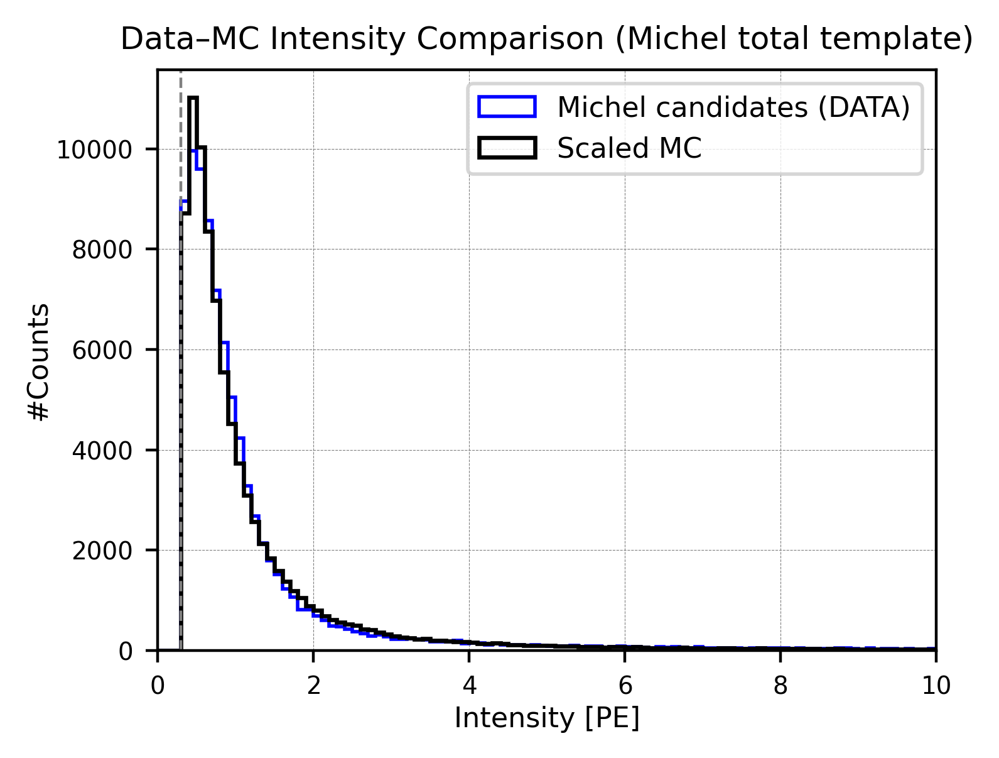

In [17]:
# Plotting=============================================================================
plt.figure(figsize=(4,3), dpi=400)

# ============================================================
# Plot settings
# ============================================================
plot_min = 0.0
plot_max = 10.0
plot_bin_width = 0.1
plot_bins = np.arange(plot_min, plot_max + plot_bin_width, plot_bin_width)

# ============================================================
# 1. Apply the fitted transformation to total MC template
# ============================================================
scale_template = m.values["scale_template"]
shift_template = m.values["shift_template"]

template_MC_scaled = scale_template * miInt_total_MC + shift_template

# ============================================================
# 2. DATA histogram
# ============================================================
plt.hist(
    miInt_diff,
    bins=plot_bins,
    range=(plot_min, plot_max),
    histtype='step',
    edgecolor='blue',
    linewidth=1.0,
    label="Michel candidates (DATA)"
)

# ============================================================
# 3. Total MC template histogram (scaled)
# ============================================================
n_data = len(miInt_diff)
n_template = len(template_MC_scaled)

weight_template = n_data / n_template
weights_template = np.full(n_template, weight_template)

plt.hist(
    template_MC_scaled,
    bins=plot_bins,
    range=(plot_min, plot_max),
    histtype='step',
    linewidth=1.2,
    color='black',
    weights=weights_template,
    label="Scaled MC"
)

# Show fit range
plt.axvline(fit_min, color='gray', linestyle='--', linewidth=0.8)
plt.axvline(fit_max, color='gray', linestyle='--', linewidth=0.8)

# ============================================================
# 4. Plot styling
# ============================================================
plt.xlim(0, plot_max)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)

# plt.ylim(1, 2000)
# plt.yscale('log')

plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.title('Data–MC Intensity Comparison (Michel total template)', fontsize=9)
plt.legend(fontsize=8, loc="upper right")

plt.show()

<br />

### Third Peak Processing:


In [18]:
from iminuit import Minuit
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1. Fit settings for non-zero positive part only
# ============================================================
fit_min = 0.3
fit_max = 10.0
bin_width = 0.1

bins = np.arange(fit_min, fit_max + bin_width, bin_width)

print(f"Third Peak non-zero fit window = [{fit_min}, {fit_max}]")
print(f"Third Peak non-zero bin width  = {bin_width}")
print(f"Number of bins                 = {len(bins) - 1}")

# ============================================================
# 2. Input arrays
# ============================================================
data_all = np.asarray(thirdInt_diff, dtype=float)
mc_all = np.asarray(thirdInt_total_MC, dtype=float)

# ============================================================
# 3. Zero-entry summary
# ============================================================
n_data_all = len(data_all)
n_mc_all = len(mc_all)

n_data_zero = np.sum(data_all == 0.0)
n_mc_zero = np.sum(mc_all == 0.0)

f_data_zero = n_data_zero / n_data_all if n_data_all > 0 else 0.0
f_mc_zero = n_mc_zero / n_mc_all if n_mc_all > 0 else 0.0

print("\n==================================================")
print("Third Peak zero-entry summary")
print("==================================================")
print(f"DATA total         = {n_data_all}")
print(f"DATA zero entries  = {n_data_zero}")
print(f"DATA zero fraction = {f_data_zero:.6f}")

print(f"MC total           = {n_mc_all}")
print(f"MC zero entries    = {n_mc_zero}")
print(f"MC zero fraction   = {f_mc_zero:.6f}")

# ============================================================
# 4. Keep only non-zero entries in fit region
#    Here 'non-zero' is effectively implemented as >= fit_min
# ============================================================
data_nz = data_all[data_all >= fit_min]
mc_nz = mc_all[mc_all >= fit_min]

n_data_nz = len(data_nz)
n_mc_nz = len(mc_nz)

print("\n==================================================")
print("Third Peak non-zero summary")
print("==================================================")
print(f"DATA non-zero entries used in fit = {n_data_nz}")
print(f"MC non-zero entries used in fit   = {n_mc_nz}")

if n_data_nz == 0:
    raise RuntimeError("No non-zero DATA entries found in fit range.")

if n_mc_nz == 0:
    raise RuntimeError("No non-zero MC entries found in fit range.")

# ============================================================
# 5. Helper: linear transformation
# ============================================================
def transform_template(arr, scale, shift):
    return scale * arr + shift

# ============================================================
# 6. DATA histogram using non-zero entries only
# ============================================================
data_hist, _ = np.histogram(data_nz, bins=bins)
data_hist = data_hist.astype(float)

# ============================================================
# 7. Chi2 definition using non-zero entries only
#    Normalization is based on non-zero DATA statistics
# ============================================================
def chi2_template(scale_template, shift_template):

    if scale_template <= 0:
        return 1e30

    mc_transformed = transform_template(mc_nz, scale_template, shift_template)

    # Keep only transformed MC entries still inside fit region
    mc_transformed_in = mc_transformed[
        (mc_transformed >= fit_min) & (mc_transformed <= fit_max)
    ]

    if len(mc_transformed_in) == 0:
        return 1e30

    template_hist, _ = np.histogram(mc_transformed_in, bins=bins)
    template_hist = template_hist.astype(float)

    if np.sum(template_hist) <= 0:
        return 1e30

    template_shape = template_hist / np.sum(template_hist)

    # Normalize only to non-zero DATA statistics
    prediction = n_data_nz * template_shape

    sigma2 = data_hist + prediction + 1.0
    chi2 = np.sum((data_hist - prediction) ** 2 / sigma2)

    return chi2

# ============================================================
# 8. Run fit
# ============================================================
m = Minuit(
    chi2_template,
    scale_template=1.0,
    shift_template=0.0
)

m.errordef = Minuit.LEAST_SQUARES
m.limits["scale_template"] = (1e-6, None)

m.simplex()
m.migrad()
m.hesse()

scale_best = m.values["scale_template"]
shift_best = m.values["shift_template"]

scale_err = m.errors["scale_template"]
shift_err = m.errors["shift_template"]

# ============================================================
# 9. Build best-fit prediction
# ============================================================
mc_best = transform_template(mc_nz, scale_best, shift_best)
mc_best_in = mc_best[(mc_best >= fit_min) & (mc_best <= fit_max)]

template_hist, _ = np.histogram(mc_best_in, bins=bins)
template_hist = template_hist.astype(float)

template_shape = template_hist / np.sum(template_hist)
prediction = n_data_nz * template_shape

sigma2 = data_hist + prediction + 1.0
chi2_val = np.sum((data_hist - prediction) ** 2 / sigma2)

ndf = len(data_hist) - 2
chi2_ndf = chi2_val / ndf if ndf > 0 else np.nan

# ============================================================
# 10. Print fit result
# ============================================================
print("\n==================================================")
print("Third Peak non-zero template fit result")
print("==================================================")
print(f"success        = {m.fmin.is_valid}")
print(f"scale_template = {scale_best:.6f} +/- {scale_err:.6f}")
print(f"shift_template = {shift_best:.6f} +/- {shift_err:.6f}")
print(f"chi2           = {chi2_val:.3f}")
print(f"ndf            = {ndf}")
print(f"chi2/ndf       = {chi2_ndf:.3f}")

print("\nFit diagnostics")
print(m.fmin)



Third Peak non-zero fit window = [0.3, 10.0]
Third Peak non-zero bin width  = 0.1
Number of bins                 = 97

Third Peak zero-entry summary
DATA total         = 87055
DATA zero entries  = 12907
DATA zero fraction = 0.148263
MC total           = 230076
MC zero entries    = 19915
MC zero fraction   = 0.086558

Third Peak non-zero summary
DATA non-zero entries used in fit = 74148
MC non-zero entries used in fit   = 210161

Third Peak non-zero template fit result
success        = False
scale_template = 0.576714 +/- 0.000004
shift_template = 0.131456 +/- 0.000001
chi2           = 283.320
ndf            = 95
chi2/ndf       = 2.982

Fit diagnostics
┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 283.3                      │              Nfcn = 382              │
│ EDM = 0.195 (Goal: 0.0002)       │ 

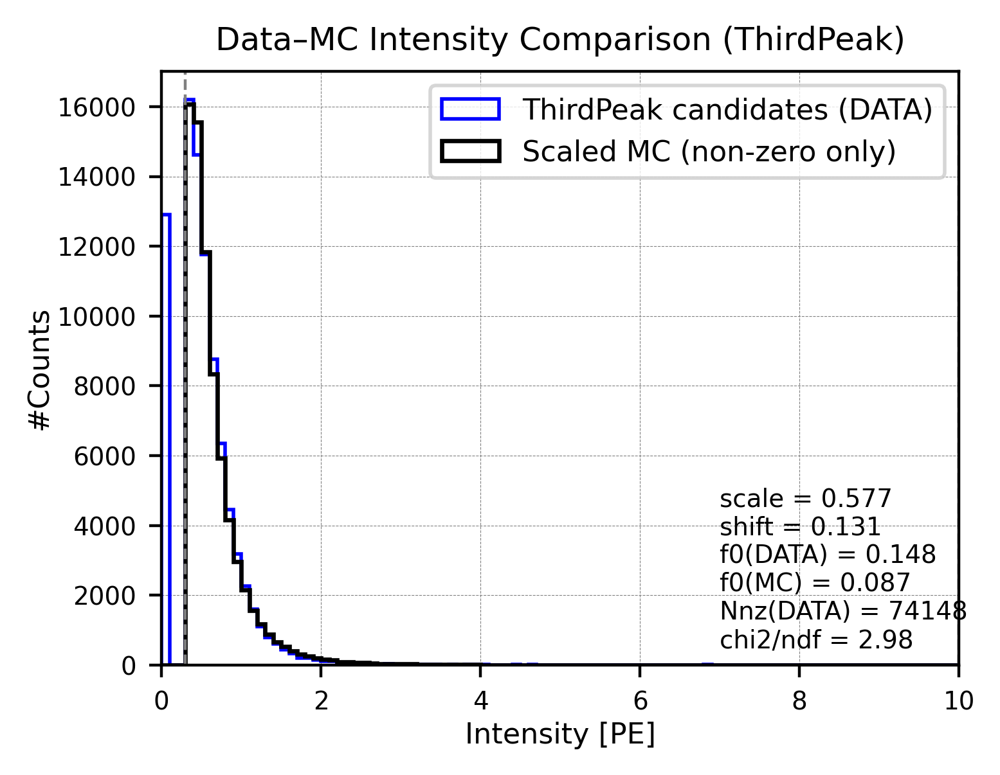

In [19]:
# Plotting=============================================================================
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(4,3), dpi=400)

# ============================================================
# Plot settings
# ============================================================
plot_min = 0.0
plot_max = 10.0
plot_bin_width = 0.1
plot_bins = np.arange(plot_min, plot_max + plot_bin_width, plot_bin_width)

# ============================================================
# 1. Extract fit parameters
# ============================================================
scale_template = m.values["scale_template"]
shift_template = m.values["shift_template"]

# ============================================================
# 2. Input arrays
# ============================================================
data_all = np.asarray(thirdInt_diff, dtype=float)
mc_all   = np.asarray(thirdInt_total_MC, dtype=float)

# ============================================================
# 3. Define non-zero samples used in the fit
#    Here non-zero means entries inside the fit region
# ============================================================
data_nz = data_all[data_all >= fit_min]
mc_nz   = mc_all[mc_all >= fit_min]

# Apply scaling only to non-zero MC entries
mc_nz_scaled = scale_template * mc_nz + shift_template

# Keep only scaled MC entries inside plotting range
mc_nz_scaled_in = mc_nz_scaled[
    (mc_nz_scaled >= plot_min) & (mc_nz_scaled <= plot_max)
]

# ============================================================
# 4. Zero fractions (for display only)
# ============================================================
f_data_zero = np.sum(data_all == 0.0) / len(data_all)
f_mc_zero   = np.sum(mc_all == 0.0) / len(mc_all)

# ============================================================
# 5. DATA histogram
#    Full DATA shown, including zero entries
# ============================================================
plt.hist(
    data_all,
    bins=plot_bins,
    range=(plot_min, plot_max),
    histtype='step',
    edgecolor='blue',
    linewidth=1.0,
    label="ThirdPeak candidates (DATA)"
)

# ============================================================
# 6. Scaled MC histogram
#    Normalize to number of non-zero DATA events
# ============================================================
n_data_nz = len(data_nz)
n_mc_scaled = len(mc_nz_scaled_in)

if n_mc_scaled > 0:
    weight_template = n_data_nz / n_mc_scaled
    weights_template = np.full(n_mc_scaled, weight_template)

    plt.hist(
        mc_nz_scaled_in,
        bins=plot_bins,
        range=(plot_min, plot_max),
        histtype='step',
        linewidth=1.2,
        color='black',
        weights=weights_template,
        label="Scaled MC (non-zero only)"
    )

# ============================================================
# 7. Show fit range
# ============================================================
plt.axvline(fit_min, color='gray', linestyle='--', linewidth=0.8)
plt.axvline(fit_max, color='gray', linestyle='--', linewidth=0.8)

# ============================================================
# 8. Text box
# ============================================================
plt.text(
    0.70, 0.30,
    f"scale = {scale_template:.3f}\n"
    f"shift = {shift_template:.3f}\n"
    f"f0(DATA) = {f_data_zero:.3f}\n"
    f"f0(MC) = {f_mc_zero:.3f}\n"
    f"Nnz(DATA) = {n_data_nz}\n"
    f"chi2/ndf = {chi2_ndf:.2f}",
    transform=plt.gca().transAxes,
    fontsize=7,
    verticalalignment='top'
)

# ============================================================
# 9. Plot styling
# ============================================================
plt.xlim(plot_min, plot_max)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)

# plt.ylim(1, 2000)
# plt.yscale('log')

plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.title('Data–MC Intensity Comparison (ThirdPeak)', fontsize=9)
plt.legend(fontsize=8, loc="upper right")

plt.show()

<br />
<br />
<br />
<br />

### Purification 4:  Michel Intensity / Muon Intensity:

After lifetime cut (cut 3):
# Events:  87055

Total events        = 87055
Mean Michel score   = 0.649
N(score > 0.8)      = 24347
Fraction > 0.8      = 0.280

(michel Intensity) / (muon intensity) (Cut 4):----------
Efficiency (cut4 / cut3):  36015 / 87055 (41.37%)

Total events        = 36015
Mean Michel score   = 0.666
N(score > 0.8)      = 10872
Fraction > 0.8      = 0.302


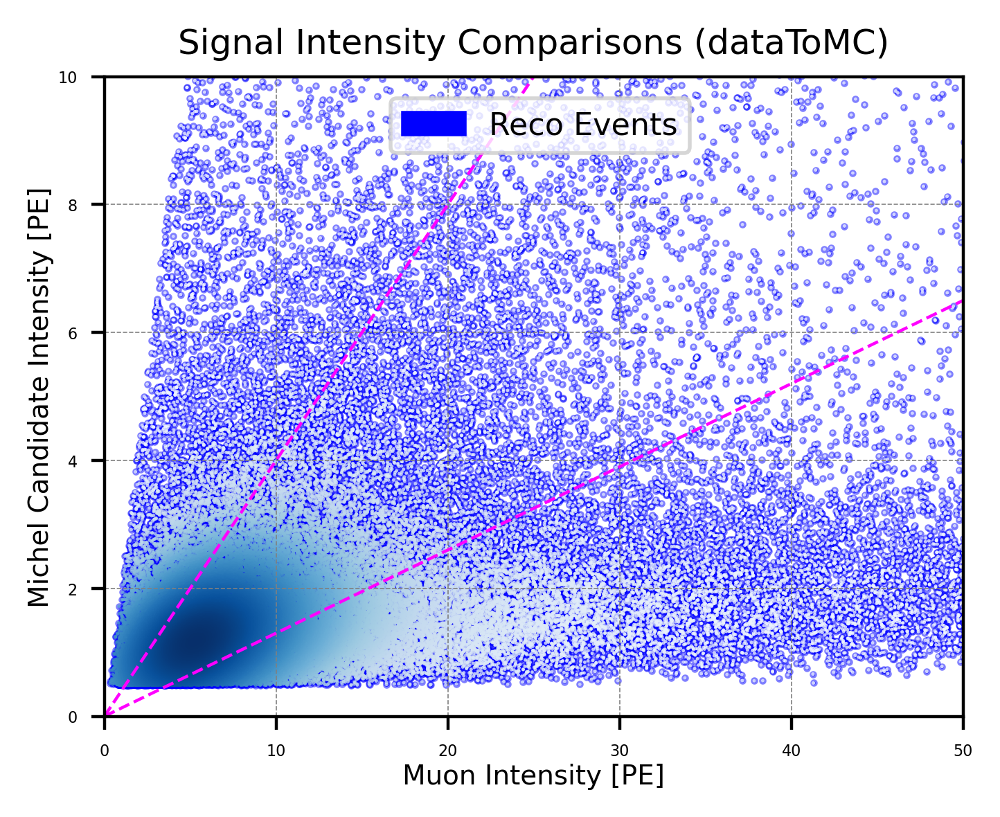


For Purify 4----------------------
ChatGPT (20260311): The 1D Michel scaling is a useful first-order correction, 
but the ratio variable carries additional information that is not captured by that 1D correction.


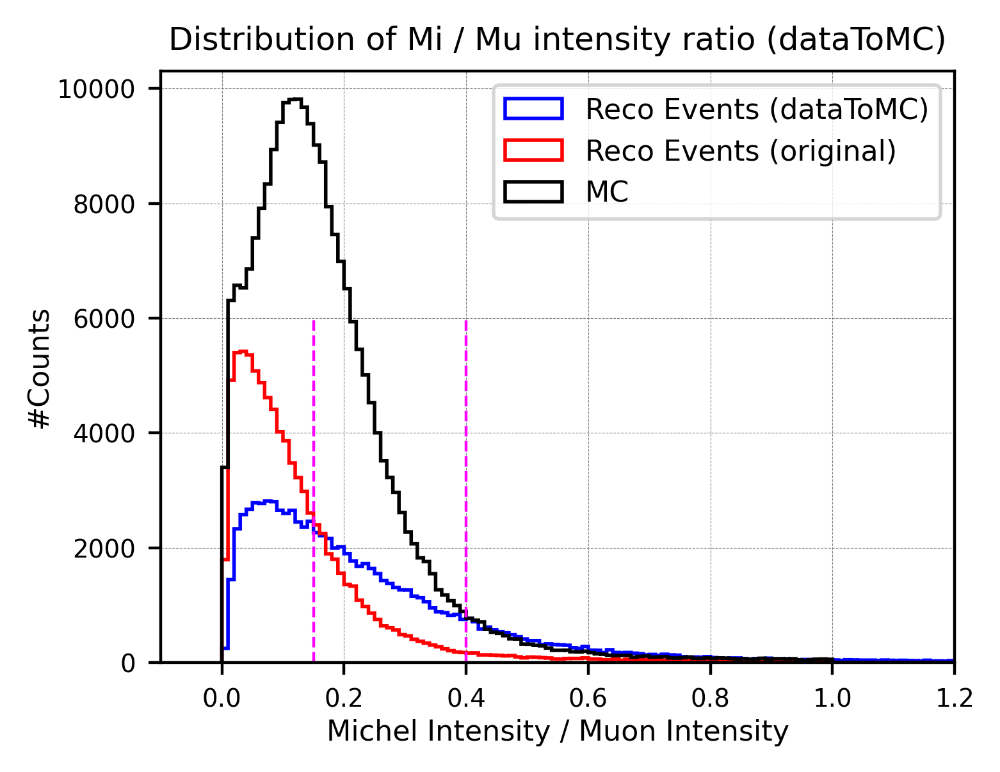

In [20]:
#Adjust and apply scaling===========================================
x_scale_muMC = 1.047 #Best value: 1.047
x_shift_muMC = -0.007 #Best value: -0.007

x_scale_miMC = 0.469 #0.469
x_shift_miMC = 0.072 #0.072

x_scale_thirdMC = 0.522 #0.522
x_shift_thirdMC = 0.136 #0.136


# Convert DATA intensity back to MC-equivalent intensity
def mu_dataToMC(value_data):

    return (value_data - x_shift_muMC) / x_scale_muMC

def michel_dataToMC(value_data):

    return (value_data - x_shift_miMC) / x_scale_miMC

def third_dataToMC(value_data):

    return (value_data - x_shift_thirdMC) / x_scale_thirdMC




#Michel Intensity Cut (Cut 4)================================================
print("After lifetime cut (cut 3):")

print("# Events: ", len(events_newClass))

mScore_total = [ev.michel_score for ev in events_newClass]
#Michel score:
mean_score = sum(mScore_total) / len(mScore_total)
n_high = sum(1 for s in mScore_total if s > 0.8)
frac_high = n_high / len(mScore_total)
print(f"\nTotal events        = {len(mScore_total)}")
print(f"Mean Michel score   = {mean_score:.3f}")
print(f"N(score > 0.8)      = {n_high}")
print(f"Fraction > 0.8      = {frac_high:.3f}")



thre1 = 7.5 / 50
thre2 = 40 / 100

# filter the actual events
events_total_purify4 = [
    ev for ev in events_newClass

#    if ev.muon_intensity != 0 and thre1 <  ev.michel_intensity / ev.muon_intensity < thre2

    #Shifted and scaled data---
    if ev.muon_intensity != 0 and thre1 < michel_dataToMC(ev.michel_intensity) / mu_dataToMC(ev.muon_intensity) < thre2

]
#-------------------------------

print("\n(michel Intensity) / (muon intensity) (Cut 4):----------")

print("Efficiency (cut4 / cut3): ", len(events_total_purify4), "/", len(events_newClass),
      "({:.2f}%)".format(len(events_total_purify4)/len(events_newClass)*100))


mScore_purify4 = [ev.michel_score for ev in events_total_purify4]
#Michel score:
mean_score_purify4 = sum(mScore_purify4) / len(mScore_purify4)
n_high_purify4 = sum(1 for s in mScore_purify4 if s > 0.8)
frac_high_purify4 = n_high_purify4 / len(mScore_purify4)
print(f"\nTotal events        = {len(mScore_purify4)}")
print(f"Mean Michel score   = {mean_score_purify4:.3f}")
print(f"N(score > 0.8)      = {n_high_purify4}")
print(f"Fraction > 0.8      = {frac_high_purify4:.3f}")




# For drawing and comparison------------------------------
muInt_dataToMC = mu_dataToMC(muInt_diff)
miInt_dataToMC = michel_dataToMC(miInt_diff)



# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_dataToMC), np.array(miInt_dataToMC)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Reco Events")

#---------------------------------

plt.plot([0, 500], [0, 65], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0, 1000], [0, 400], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 50) #(-5, 400)
plt.ylim(0, 10) #(-5, 60)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons (dataToMC)', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
blue_patch = mpatches.Patch(color="blue", label="Reco Events")
plt.legend(handles=[blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()






#Ratio distribution===================================
print("\nFor Purify 4----------------------")
print("ChatGPT (20260311): The 1D Michel scaling is a useful first-order correction, " \
"\nbut the ratio variable carries additional information that is not captured by that 1D correction.")

# MC
ratio_diff_purify3_MC = [mi / mu for mi, mu in zip(miInt_total_MC, muInt_total_MC) if mu != 0]
# Data (dataToMC)
ratio_diff_purify3 = [mi / mu for mi, mu in zip(miInt_dataToMC, muInt_dataToMC) if mu != 0]
# Data (original)
ratio_diff_purify3_origin = [mi / mu for mi, mu in zip(miInt_diff, muInt_diff) if mu != 0]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_diff_purify3, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Reco Events (dataToMC)")
plt.hist(ratio_diff_purify3_origin, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label="Reco Events (original)")
# MC
plt.hist(ratio_diff_purify3_MC, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=1.0, label="MC")

plt.plot([0.15, 0.15], [0, 6000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.4, 0.4], [0, 6000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.1, 1.2)
plt.xlabel('Michel Intensity / Muon Intensity', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 4000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Mi / Mu intensity ratio (dataToMC)', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 













#### Cut 5: Michel intensity & Muon intensity: 

After cut 4:
# Events:  36015

Michel Intensity Cut (Cut 5):--------------
Efficiency (cut5 / cut4):  25144 / 36015 (69.82%)


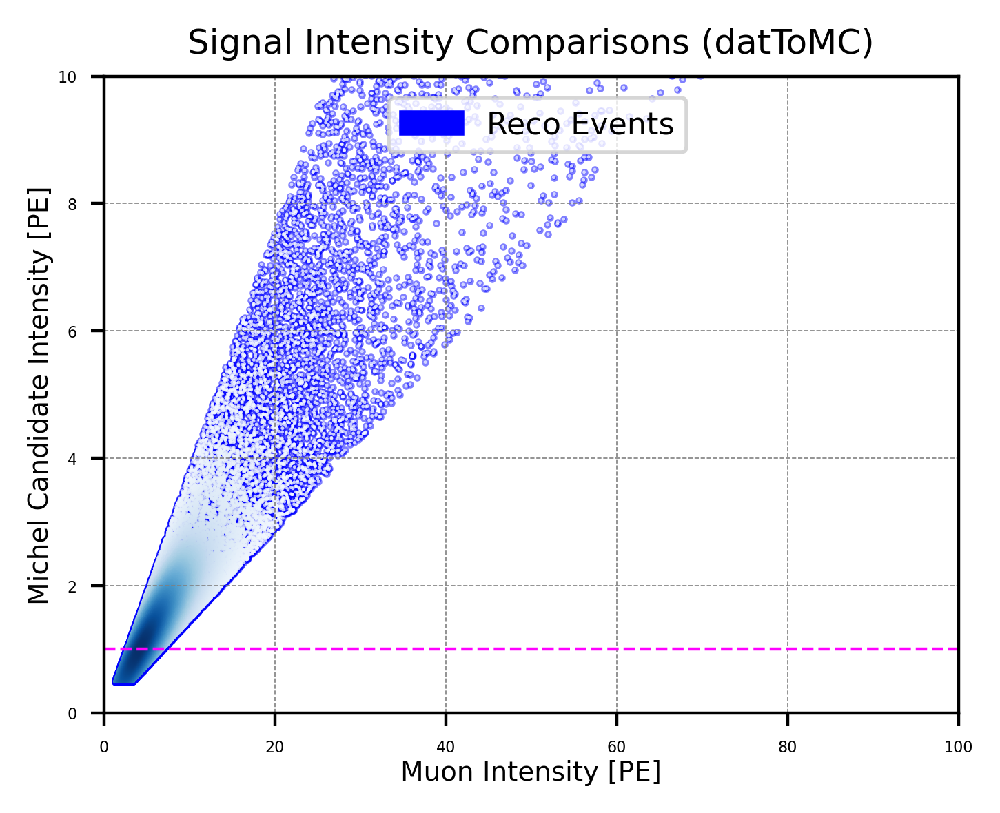


Purify 5----------------------


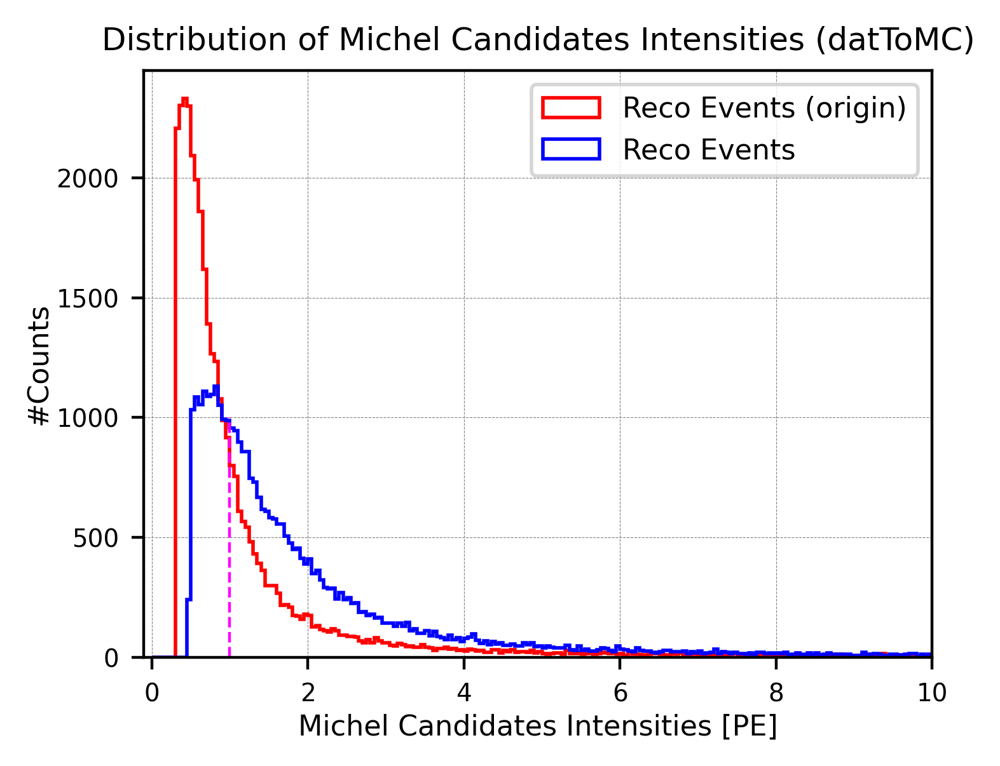

In [21]:
#Michel & Muon Intensities Cut (Cut 5)================================================
print("After cut 4:")

print("# Events: ", len(events_total_purify4))




thre_muInt = 0.3 # mu Int will automatically higher than mi---
thre_miInt = 1.0

#Shifted and scaled from MC & DATA comparison---
#miInt_DATA_scaled = 2.5 * np.array(miInt_diff) - 0.45


# filter the actual events
events_total_purify5 = [
    ev for ev in events_total_purify4
    if thre_miInt < michel_dataToMC(ev.michel_intensity) and thre_muInt < ev.muon_intensity
]
#-------------------------------

print("\nMichel Intensity Cut (Cut 5):--------------")

print("Efficiency (cut5 / cut4): ", len(events_total_purify5), "/", len(events_total_purify4),
      "({:.2f}%)".format(len(events_total_purify5)/len(events_total_purify4)*100))








# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================



# For drawing and comparison------------------------------
muInt_tmp = [ev.muon_intensity for ev in events_total_purify4]
miInt_tmp = [ev.michel_intensity for ev in events_total_purify4]

muInt_tmp = np.array(muInt_tmp, dtype=float)
miInt_tmp = np.array(miInt_tmp, dtype=float)

#scaled (dataToMC)
muInt_diff_purify4 = muInt_tmp
miInt_diff_purify4 = michel_dataToMC(miInt_tmp)




plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_diff_purify4), np.array(miInt_diff_purify4)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Reco Events")

#---------------------------------

plt.plot([0, 100], [1.0, 1.0], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 100)
plt.ylim(0, 10)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons (datToMC)', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Reco Events")
plt.legend(handles=[blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()







#Michel Intensity distribution===================================
print("\nPurify 5----------------------")

#miInt_diff500_purify5 = [ev.michel_intensity for ev in events_diff500_purify5]
#miInt_diff0_purify5 = [ev.michel_intensity for ev in events_diff0_purify5]

#miInt_Total_purify4_MC = np.load("../MC_official2025/miInt_Total_purify4_MC.npz", 
#                               allow_pickle=True)["events"].tolist()

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(miInt_tmp, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label="Reco Events (origin)")
plt.hist(miInt_diff_purify4, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Reco Events")
#plt.hist(miInt_Total_purify4_MC, bins=bins, range=(range_min, range_max), edgecolor='red', 
#         histtype='step', linewidth=1.0, label="Reco Events (MC)")

plt.plot([1.0, 1.0], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.1, 10)
plt.xlabel('Michel Candidates Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Michel Candidates Intensities (datToMC)', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  





#### Mu & Michel intensity distributions after Cut 5:

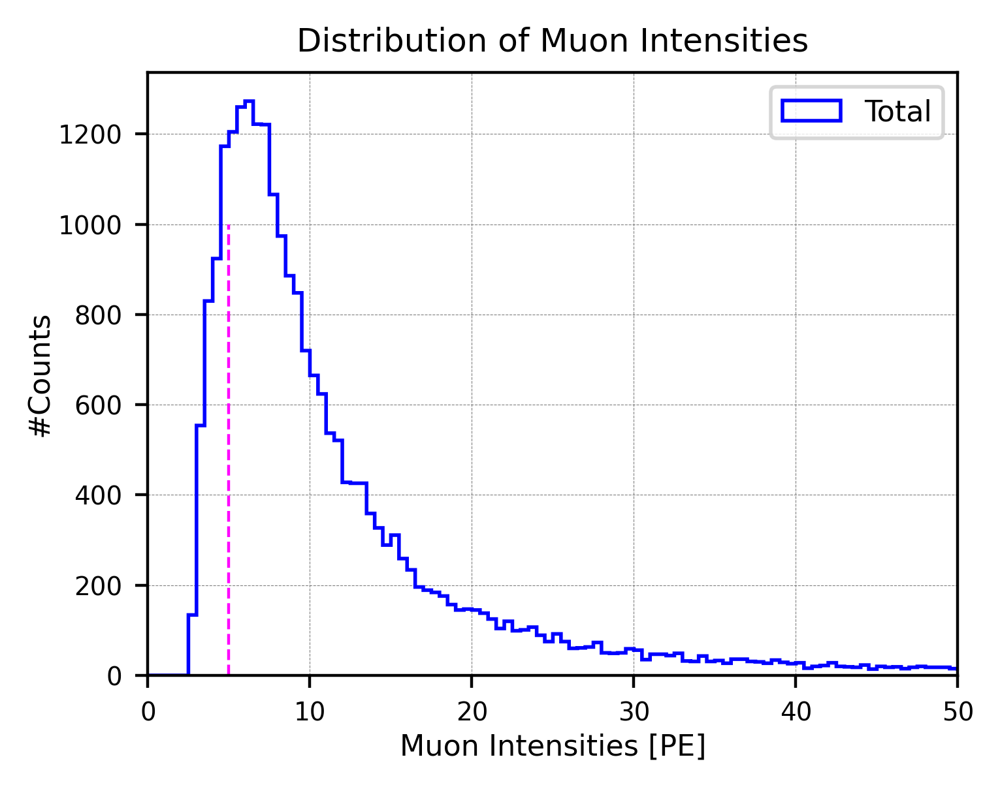

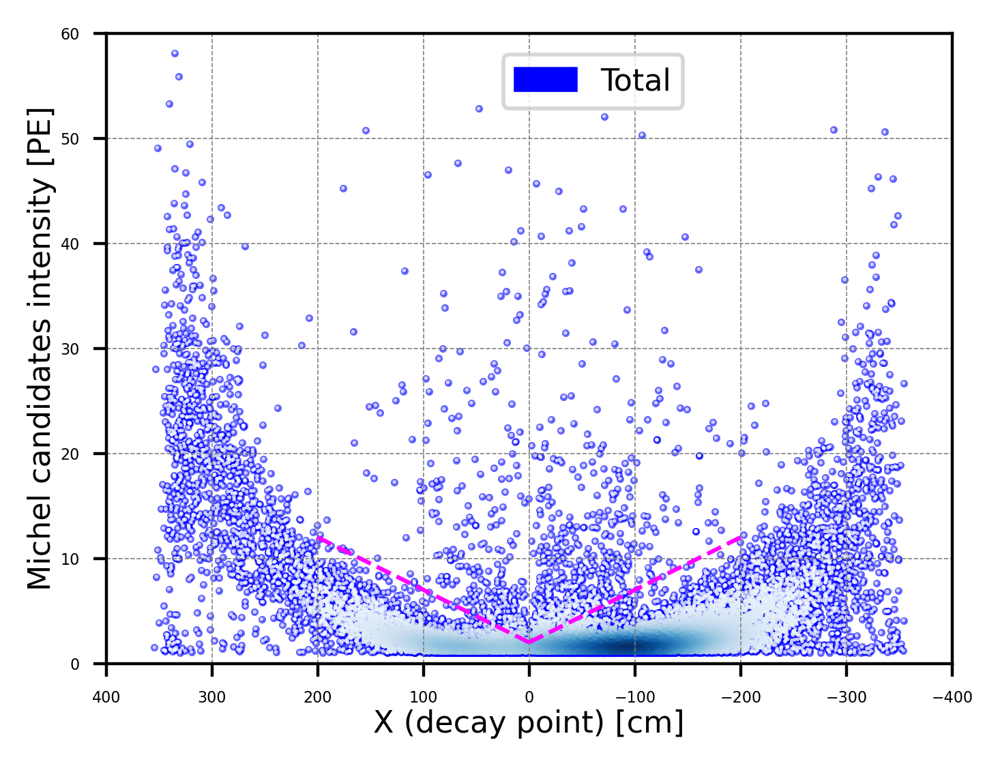

In [22]:
#Muon Intensity distribution===================================

muInt_tmp = [ev.muon_intensity for ev in events_total_purify5]
miInt_tmp = [ev.michel_intensity for ev in events_total_purify5]

muInt_tmp = np.array(muInt_tmp, dtype=float)
miInt_tmp = np.array(miInt_tmp, dtype=float)

#scaled (dataToMC)
muInt_total_purify5 = muInt_tmp
#miInt_total_purify5 = miInt_tmp
miInt_total_purify5 = michel_dataToMC(miInt_tmp)



plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = 0
range_max = 300
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_total_purify5, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Total")

plt.plot([5, 5], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 50)
plt.xlabel('Muon Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Muon Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 





#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_total_purify5 = [ev.posX for ev in events_total_purify5]

# Scatter plot----------

# --- 500<Diff (blue group) ---
x1 = np.array(posX_total_purify5, dtype=float)
y1 = np.array(miInt_total_purify5, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Total")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=1.1, linestyle='--')
plt.plot([0.0, -200.0], [2, 12], color="magenta", linewidth=1.1, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=8)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=8)
#plt.title('dataToMC', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
blue_patch = mpatches.Patch(color="blue", label="Total")
plt.legend(handles=[blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()

#### Cut 5': Michel signal VS Distance cut:

After cut 5:---------
#events:  25144

After Cut 5' (Michel vs Distance):--------------
Efficiency (cut5' / cut5):  24032 / 25144 (95.58%)


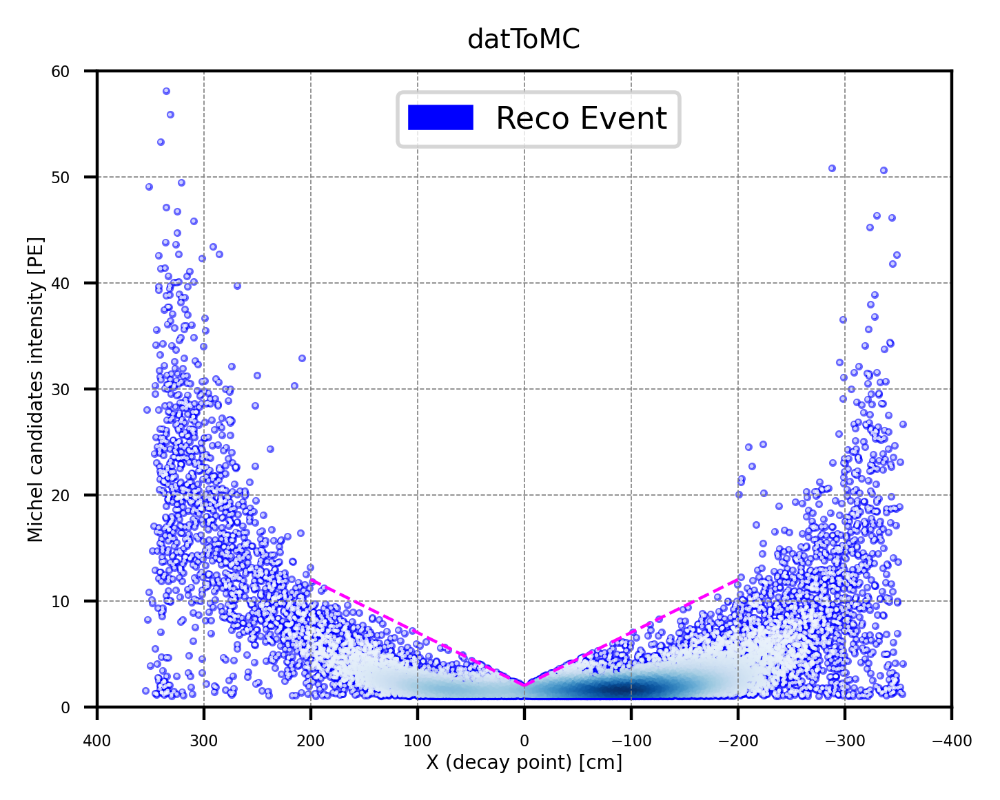

In [23]:
print("After cut 5:---------")

print("#events: ", len(events_total_purify5))



#Michel Peak rise & drop Cut (Cut 5')--------
# --- Define slopes and intercepts for both cuts ---
slope_pos = (7 - 2) / 100.0      # = 0.05
intercept_pos = 2.0

slope_neg = (10 - 0) / (-200 - 0.0)  # = -0.05
# Modified on 2026031: 0.0 to 2.0
intercept_neg = 2.0


#Shifted and scaled from MC & DATA comparison---
#miInt_DATA_scaled = 2.5 * np.array(miInt_diff) - 0.45


def below_line_cut(ev):
    """Return True if event passes both (posX, michel_intensity) cuts."""
    x = ev.posX
#    y = ev.michel_intensity
    y = michel_dataToMC(ev.michel_intensity)#---------------------

    # Region 1: positive side [0, 100]
    if 0 <= x <= 200:
        return y <= intercept_pos + slope_pos * x

    # Region 2: negative side [-200, 0]
    elif -200 <= x <= 0:
        return y <= intercept_neg + slope_neg * x

    # Outside both ranges: no cut
    else:
        return True

# --- Apply the geometric cut to both event classes ---
events_total_purify5P = [ev for ev in events_total_purify5 if below_line_cut(ev)]
#-------------------------------





print("\nAfter Cut 5' (Michel vs Distance):--------------")

print("Efficiency (cut5' / cut5): ", len(events_total_purify5P), "/", len(events_total_purify5),
      "({:.2f}%)".format(len(events_total_purify5P)/len(events_total_purify5)*100))






#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_total_purify5P = [ev.posX for ev in events_total_purify5P]
miInt_tmp = [ev.michel_intensity for ev in events_total_purify5P]

miInt_tmp = np.array(miInt_tmp, dtype=float)

#scaled (dataToMC)
miInt_total_purify5P = michel_dataToMC(miInt_tmp)

# Scatter plot----------

# --- 500<Diff (blue group) ---
x1 = np.array(posX_total_purify5P, dtype=float)
y1 = np.array(miInt_total_purify5P, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Total")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.0, -200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=5)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=5)
plt.title('datToMC', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
blue_patch = mpatches.Patch(color="blue", label="Reco Event")
plt.legend(handles=[blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#### Cut 6: Michel peak rise and drop slope: 

After cut 5':---------
#event    :  24032

Michel Peak Rise Drop Slope (Cut 6):--------------
Efficiency (cut6 / cut5'):  18123 / 24032 (75.41%)


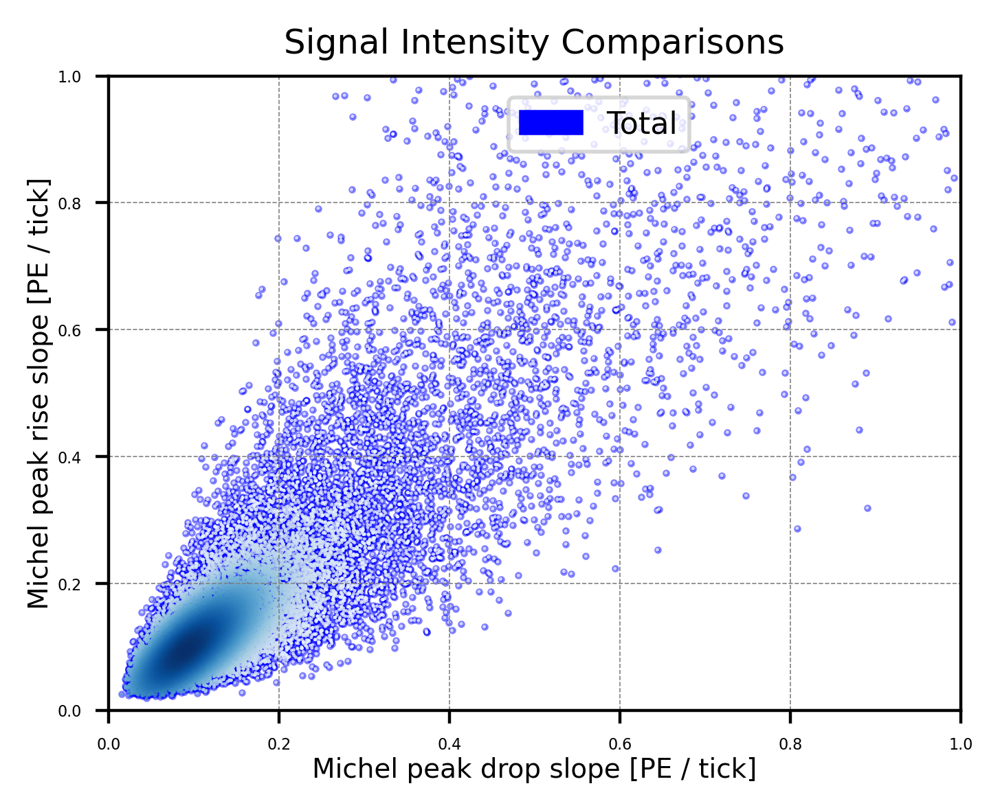

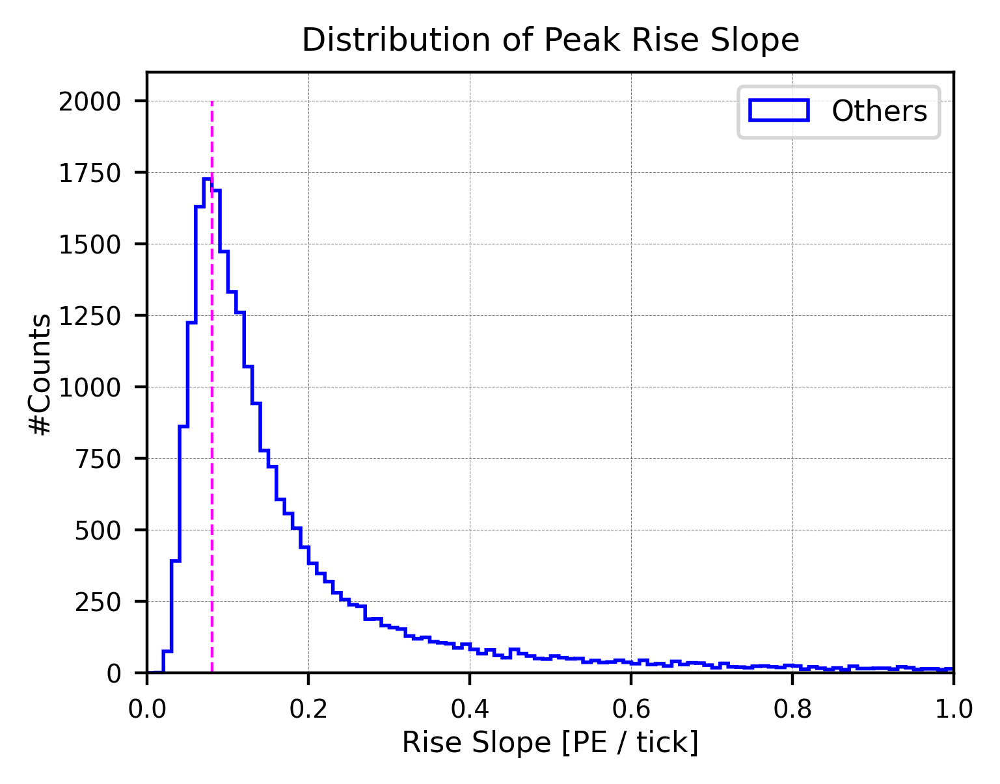

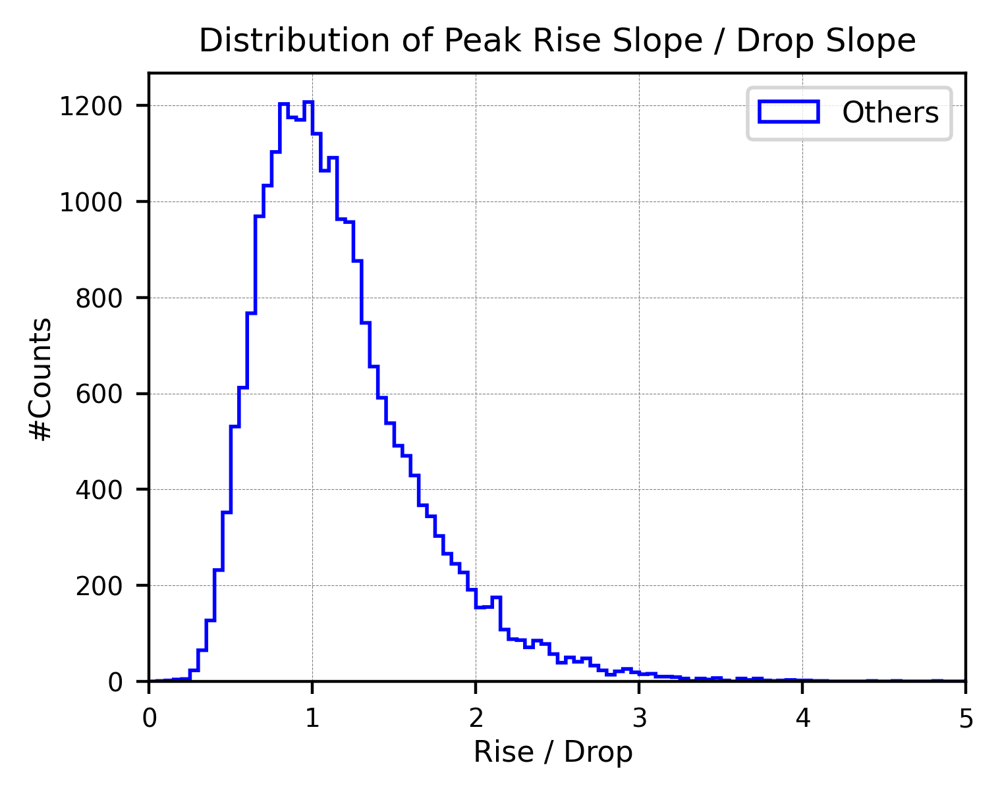

In [24]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 5':---------")
print("#event    : ", len(events_total_purify5P))


#Shu: slope might be unchanged even though the intensity is scaled (peak expansion also modified?)

rise_total_purity5P = [ev.michel_rise for ev in events_total_purify5P]
drop_total_purity5P = [ev.michel_drop for ev in events_total_purify5P]

ratios_total_purity5P = [
    r / d if d not in (0, None) else None
    for r, d in zip(rise_total_purity5P, drop_total_purity5P)
]



thre_rise = 0.08 # mu Int will automatically higher than mi---

#Slope calculation is updated based on miInt update; 20251207---

# filter the actual events
events_total_purify6 = [
    ev for ev in events_total_purify5P
    if thre_rise < ev.michel_rise 
]
#-------------------------------



print("\nMichel Peak Rise Drop Slope (Cut 6):--------------")

print("Efficiency (cut6 / cut5'): ", len(events_total_purify6), "/", len(events_total_purify5P),
      "({:.2f}%)".format(len(events_total_purify6)/len(events_total_purify5P)*100))








# ==========================================================
# Michel Rise VS Michel Drop
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(drop_total_purity5P), np.array(rise_total_purity5P)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Total")


#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xlabel('Michel peak drop slope [PE / tick]', labelpad=1, fontsize=7)
plt.ylabel('Michel peak rise slope [PE / tick]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
blue_patch = mpatches.Patch(color="blue", label="Total")
plt.legend(handles=[blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#Michel Rise Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(rise_total_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.08, 0.08], [0, 2000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 1.0)
plt.xlabel('Rise Slope [PE / tick]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 400)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  





#Michel Rise & Drop Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)
plt.hist(ratios_total_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")


plt.xlim(0, 5)
plt.xlabel('Rise / Drop ', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope / Drop Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 




### Cut 7: 2nd 3rd peak intensity Ratio cut

After cut 6:---------
#event    :  18123

Third / Second peak intensity (Cut 7):--------------
Efficiency (cut7 / cut6):  14441 / 18123 (79.68%)


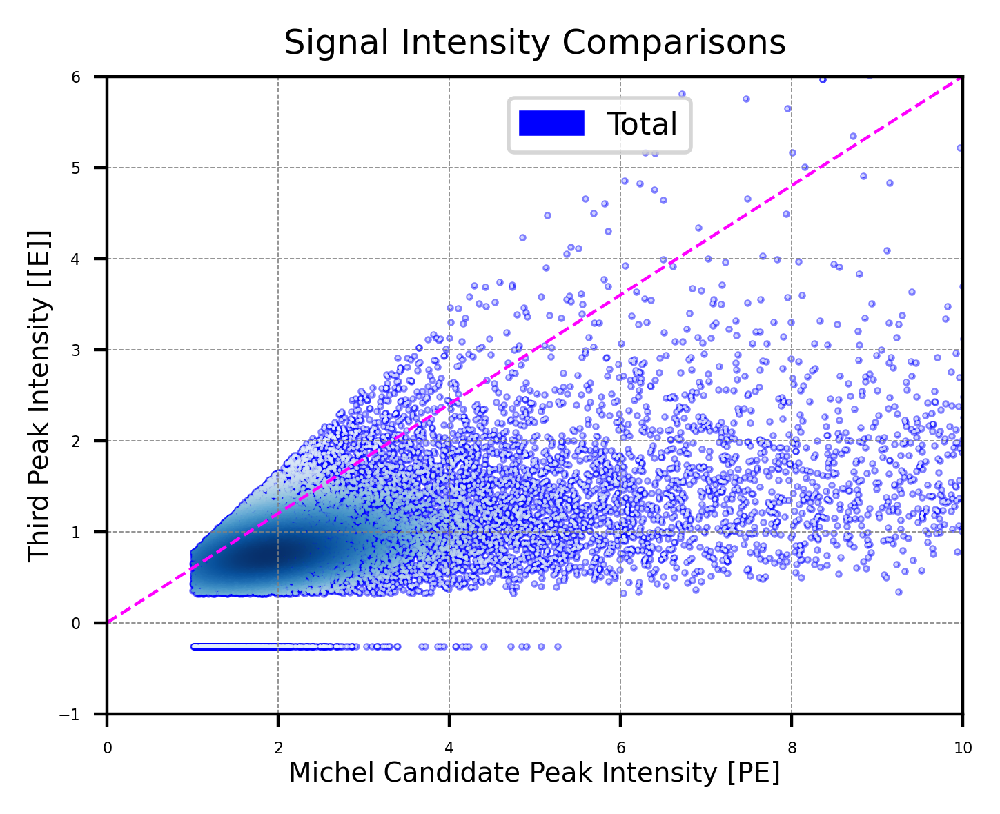

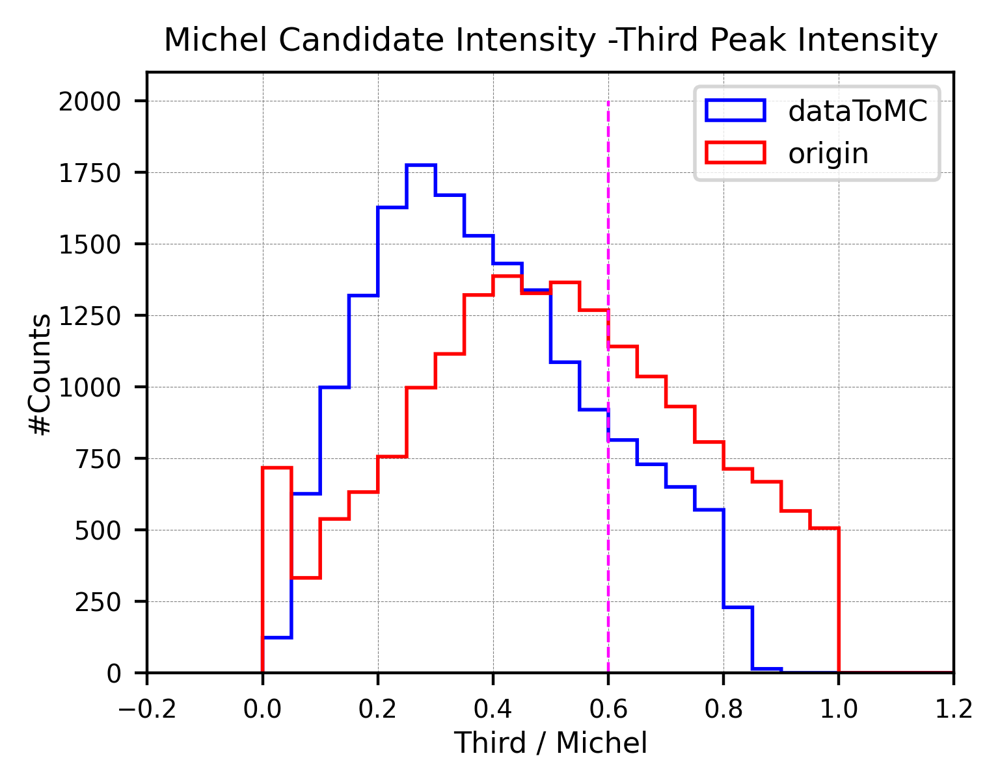

In [25]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 6:---------")

print("#event    : ", len(events_total_purify6))



miInt_tmp = [ev.michel_intensity for ev in events_total_purify6]
miInt_tmp = np.array(miInt_tmp, dtype=float)
miInt_total_purity6 = michel_dataToMC(miInt_tmp)

third_tmp = [ev.third_intensity for ev in events_total_purify6]
third_tmp = np.array(third_tmp, dtype=float)
thInt_total_purity6 = third_dataToMC(third_tmp)


# Element-by-element ratio (thInt / miInt)
ratio_total_purity6 = [th / mi for th, mi in zip(thInt_total_purity6, miInt_total_purity6)]
ratio_initial_purity6 = [th / mi for th, mi in zip(third_tmp, miInt_tmp)]

thre1 = 0.0
thre2 = 0.6

# filter the actual events

#Shifted and scaled from MC & DATA comparison---
#miInt_DATA_scaled = 2.5 * np.array(miInt_diff) - 0.45


events_total_purify7 = [
    ev for ev in events_total_purify6
#    if ev.michel_intensity != 0 and thre1 < ev.third_intensity / ev.michel_intensity < thre2
    if ev.michel_intensity != 0 and thre1 < third_dataToMC(ev.third_intensity) / michel_dataToMC(ev.michel_intensity) < thre2    
]
#-------------------------------


print("\nThird / Second peak intensity (Cut 7):--------------")
print("Efficiency (cut7 / cut6): ", len(events_total_purify7), "/", len(events_total_purify6),
      "({:.2f}%)".format(len(events_total_purify7)/len(events_total_purify6)*100))









# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x2, y2 = np.array(miInt_total_purity6), np.array(thInt_total_purity6)
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Total")
#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0, 100], [0, 60], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
blue_patch = mpatches.Patch(color="blue", label="Total")
plt.legend(handles=[blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()






#Third / Michel Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_total_purity6, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="dataToMC")
plt.hist(ratio_initial_purity6, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label="origin")

plt.plot([0.6, 0.6], [0, 2000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.2, 1.2)
plt.xlabel('Third / Michel', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 

### Cut 8: Third second peak intensity diff cut


After Cut 7:--------------
#event   :  14441

Michel 3rd Peaks intensity Diff (Cut 8):--------------
Efficiency (cut8 / cut7):  13533 / 14441 (93.71%)


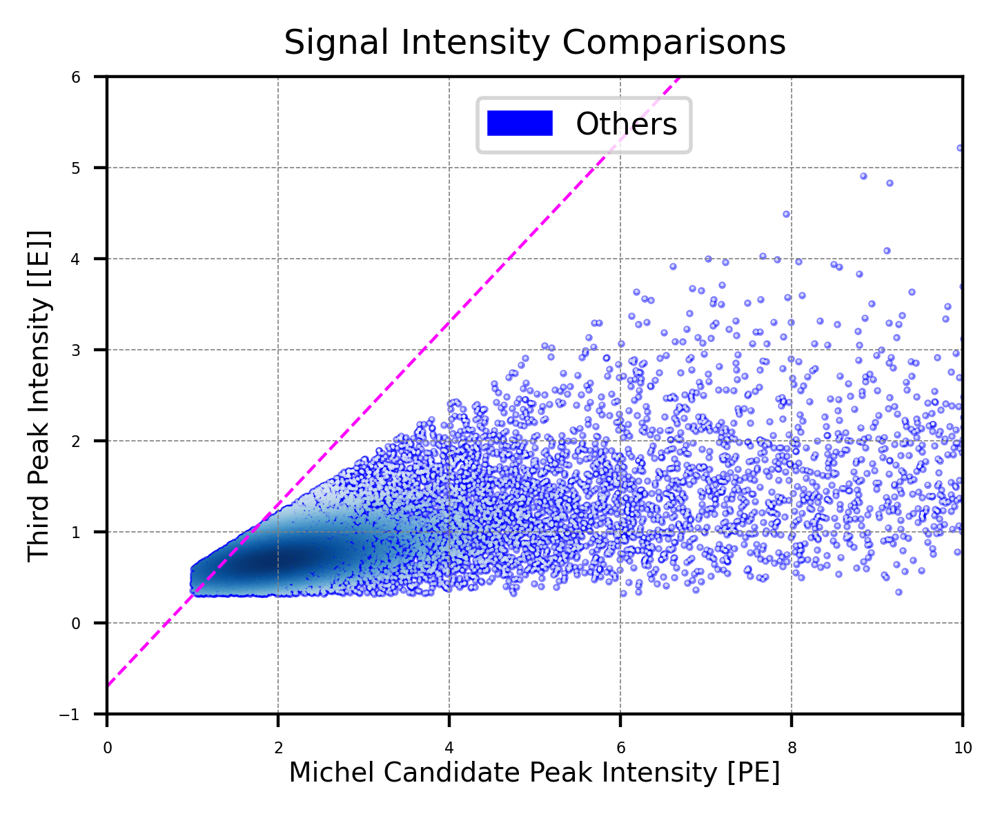

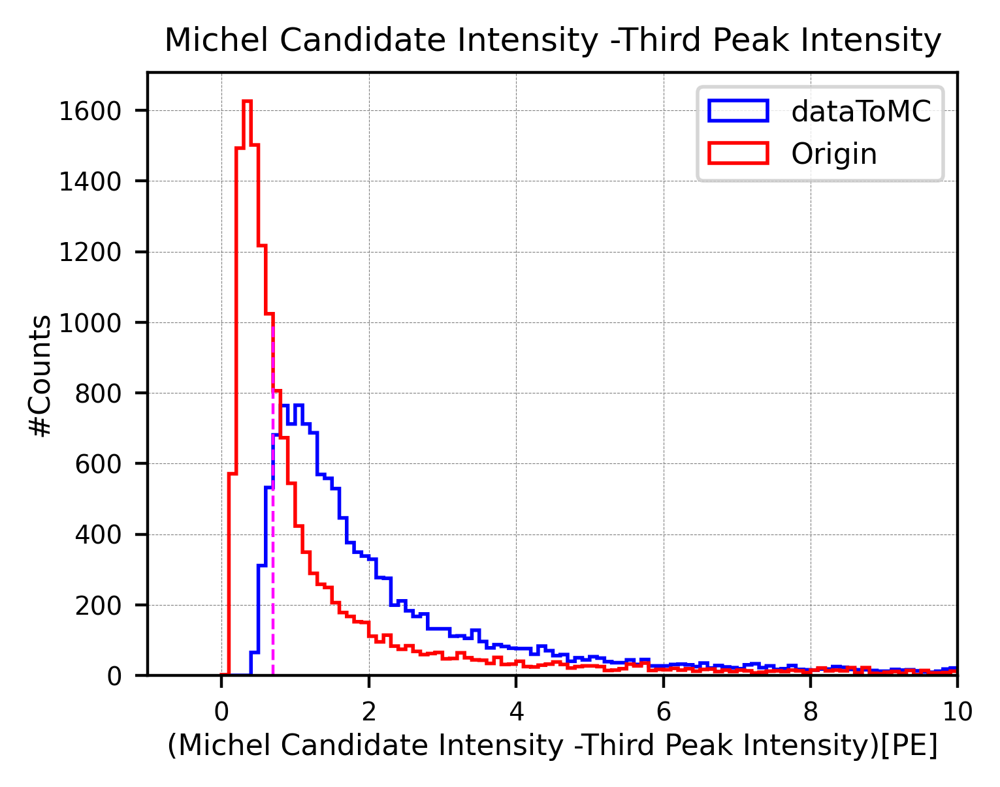

In [26]:
print("\nAfter Cut 7:--------------")

print("#event   : ", len(events_total_purify7))

miInt_tmp = [ev.michel_intensity for ev in events_total_purify7]
miInt_tmp = np.array(miInt_tmp, dtype=float)
miInt_total_purity7 = michel_dataToMC(miInt_tmp)

third_tmp = [ev.third_intensity for ev in events_total_purify7]
third_tmp = np.array(third_tmp, dtype=float)
thInt_total_purity7 = third_dataToMC(third_tmp)



# Element-by-element difference (thInt - miInt)
subtract_total_purity7 = [mi - th for th, mi in zip(thInt_total_purity7, miInt_total_purity7)]
subtract_initial_purity7 = [mi - th for th, mi in zip(third_tmp, miInt_tmp)]

thre_diff = 0.7


# filter the actual events
events_total_purify8 = [
    ev for ev in events_total_purify7
#    if thre_diff <  (ev.michel_intensity - ev.third_intensity)
    if thre_diff <  (michel_dataToMC(ev.michel_intensity) - third_dataToMC(ev.third_intensity))    
]
#-------------------------------


print("\nMichel 3rd Peaks intensity Diff (Cut 8):--------------")

print("Efficiency (cut8 / cut7): ", len(events_total_purify8), "/", len(events_total_purify7),
      "({:.2f}%)".format(len(events_total_purify8)/len(events_total_purify7)*100))










# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(miInt_total_purity7), np.array(thInt_total_purity7)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Total")
#---------------------------------

plt.plot([0, 10], [-0.7, 9.3], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
blue_patch = mpatches.Patch(color="blue", label="Others")
plt.legend(handles=[blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()









#(Michel Candidate Intensity -Third Peak Intensity) Distributions====================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.1
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(subtract_total_purity7, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="dataToMC")
plt.hist(subtract_initial_purity7, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label="Origin")

plt.plot([0.7, 0.7], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-1, 10)
plt.xlabel('(Michel Candidate Intensity -Third Peak Intensity)[PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  

### Cut 9: Space Cut along drift direction


After Cut 8:--------------
Event    :  13533

Drift Direction Cut (Cut 9):--------------
Efficiency (cut9 / cut8):  12570 / 13533 (92.88%)

Decay points distribution: 


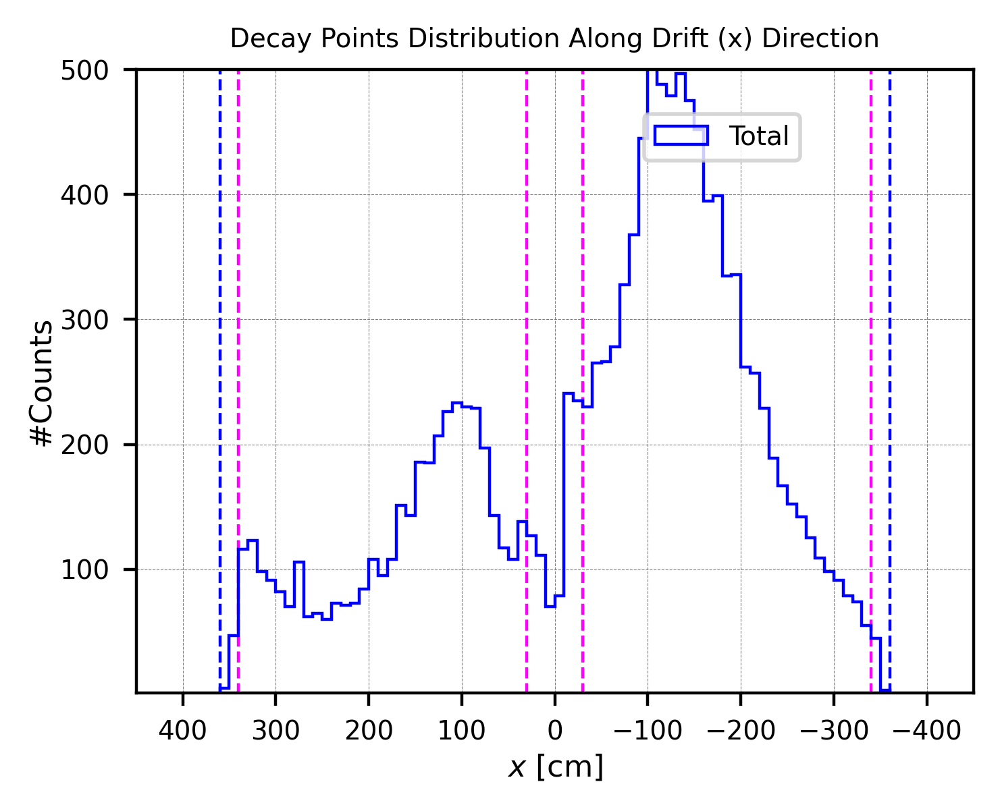

In [27]:
print("\nAfter Cut 8:--------------")

print("Event    : ", len(events_total_purify8))






#Shu (20260311): manually new threshold for beam side
posX_cut1 = 30
posX_cut2 = 340
negX_cut1 = -30
negX_cut2 = -340

# filter the actual events
events_total_purify9 = [
    ev for ev in events_total_purify8
    if posX_cut1 < ev.posX < posX_cut2 or negX_cut2 < ev.posX < negX_cut1
]


#-------------------------------


print("\nDrift Direction Cut (Cut 9):--------------")

print("Efficiency (cut9 / cut8): ", len(events_total_purify9), "/", len(events_total_purify8),
      "({:.2f}%)".format(len(events_total_purify9)/len(events_total_purify8)*100))










posX_total_purify8 = [ev.posX for ev in events_total_purify8]



#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Cut line------
plt.plot([posX_cut1, posX_cut1], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([posX_cut2, posX_cut2], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([negX_cut1, negX_cut1], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([negX_cut2, negX_cut2], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_total_purify8, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Total")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel(r'$x$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




<br />

#### Single Event Inspection:

In [28]:
# "Signal"
for ev in events_total_purify9:
    if ev.reco_lifetime >10000:
        print(ev)



PdsEventNew(muon_time=60, michel_time=695, muon_intensity=9.35785, michel_intensity=0.779525, third_intensity=0.514162, posX=-143.489, posY=35.5506, posZ=347.382, eventID=24405, trackID=1, date=28777, michel_score=0.784206, michel_hits=18, reco_lifetime=10160, michel_rise=0.12244625, michel_drop=0.06516576086956523)
PdsEventNew(muon_time=61, michel_time=805, muon_intensity=114.87, michel_intensity=18.5632, third_intensity=1.8199, posX=332.296, posY=272.623, posZ=363.16, eventID=25970, trackID=18, date=28777, michel_score=0.371262, michel_hits=20, reco_lifetime=11904, michel_rise=1.5224864864864864, michel_drop=1.584758620689655)
PdsEventNew(muon_time=60, michel_time=771, muon_intensity=8.2114, michel_intensity=0.698, third_intensity=0.307843, posX=-117.178, posY=77.147, posZ=434.026, eventID=2803, trackID=3, date=28777, michel_score=0.875067, michel_hits=16, reco_lifetime=11376, michel_rise=0.09159111111111112, michel_drop=0.08633333333333333)
PdsEventNew(muon_time=60, michel_time=954,

<br />
<br />

#### Features of final dataset (after purification 9):


Decay points distribution: 


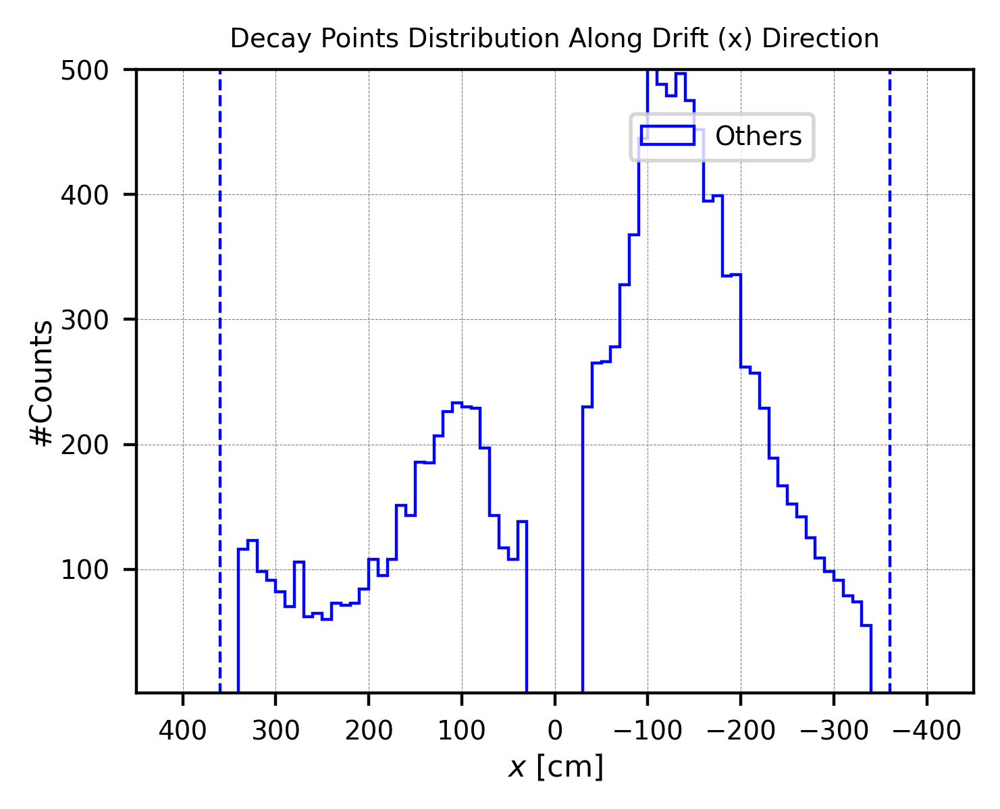

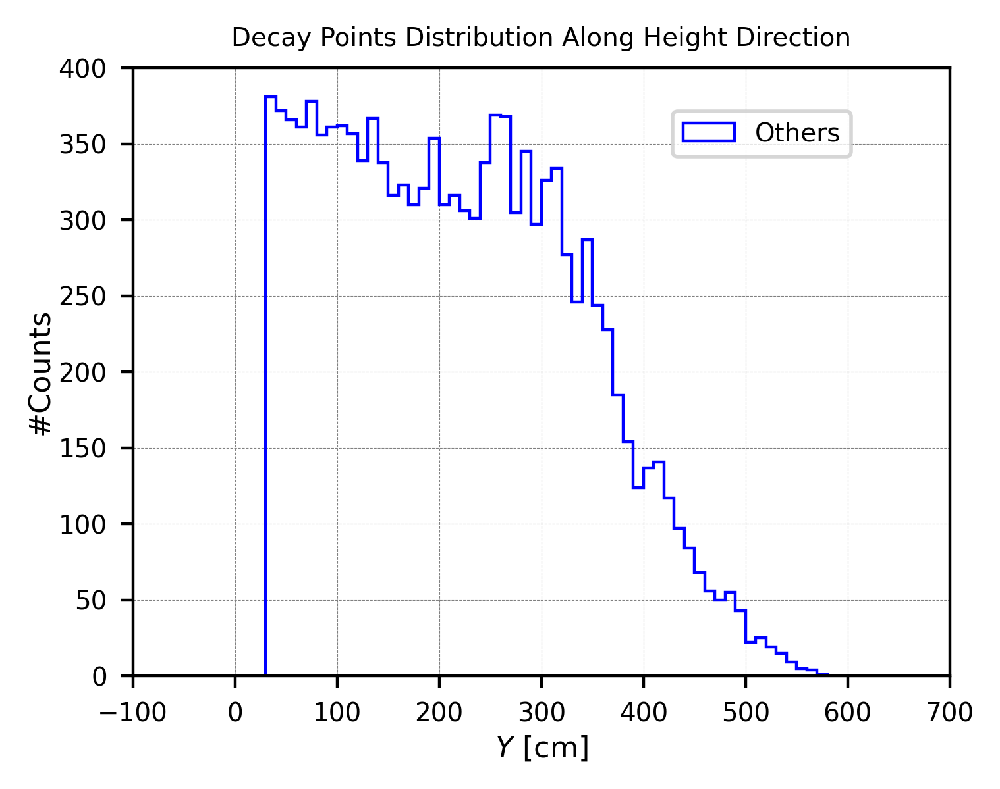

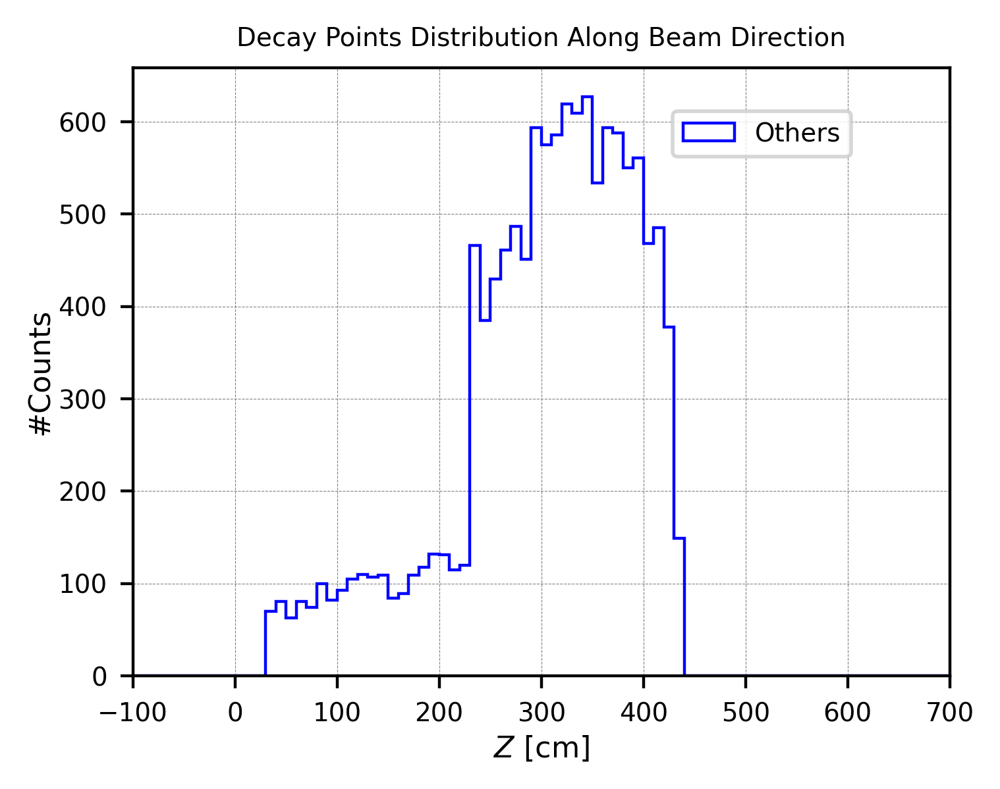

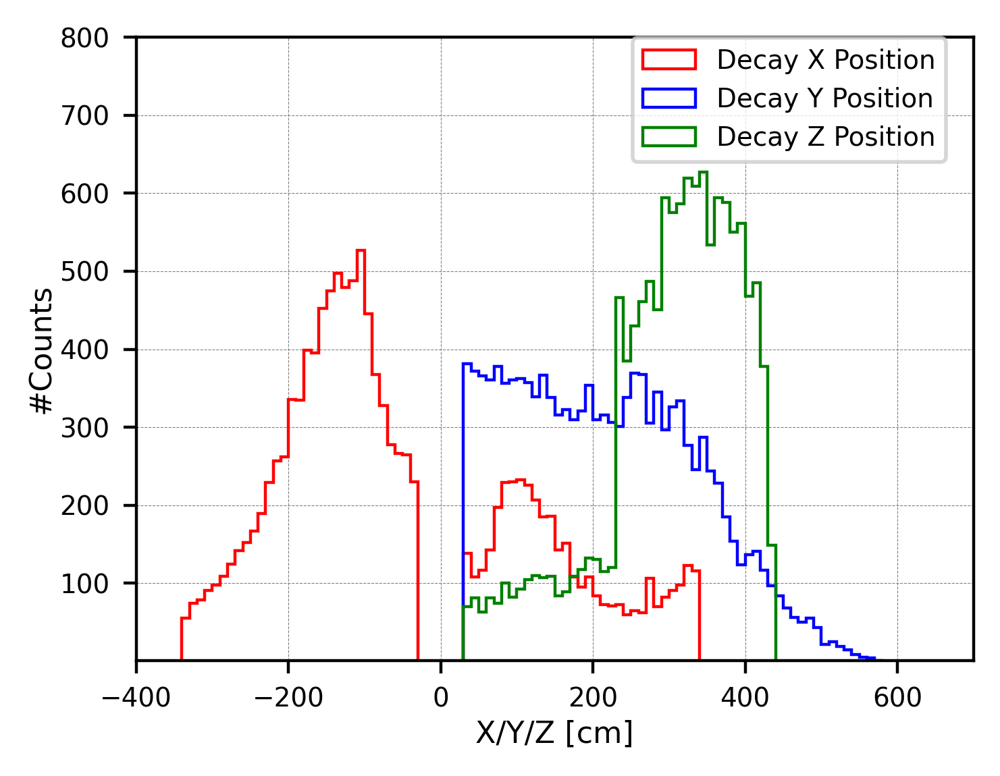

In [50]:

posX_total_purify9 = [ev.posX for ev in events_total_purify9]
posY_total_purify9 = [ev.posY for ev in events_total_purify9]
posZ_total_purify9 = [ev.posZ for ev in events_total_purify9]




#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel(r'$x$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Y distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posY_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Y$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Height Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posZ_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Z$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Beam Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 








#X/Y/Z in one plotting:==========================================
# Plotting the histogram (Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label="Decay X Position")
plt.hist(posY_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Decay Y Position")
plt.hist(posZ_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='green', 
          histtype='step', linewidth=0.8, label="Decay Z Position")
#--------------------------------

plt.xlim(-400, 700)
plt.xlabel('X/Y/Z [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 800)
#plt.yscale('log')
#plt.title('Decay Points Distribution Along Beam Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.78, 1.02), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 







# Set the limits of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

# Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


# ==========================================================
# Y–X plane plotting (Front View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line for field cage
# aux2 = [0, 610, 610, 0, 0]
# aux1 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posX_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posX_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posX_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posX_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posX_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(xmin, xmax)
# plt.ylim(-50, 660)
# plt.gca().invert_xaxis()  # Flip x-axis
# plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Front View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()


# ==========================================================
# Z–X plane plotting (Top View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux1 = [0, 465, 465, 0, 0]
# aux2 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posX_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posX_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posX_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posX_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posX_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.ylim(xmin, xmax)
# plt.xlim(-50, 515)
# plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.title('Top View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()




# ==========================================================
# Y–Z plane plotting (Side View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux2 = [cageMinY, cageMaxY, cageMaxY, cageMinY, cageMinY]
# aux1 = [cageMinZ, cageMinZ, cageMaxZ, cageMaxZ, cageMinZ]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(-50, 515)
# plt.ylim(-50, 660)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Side View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()


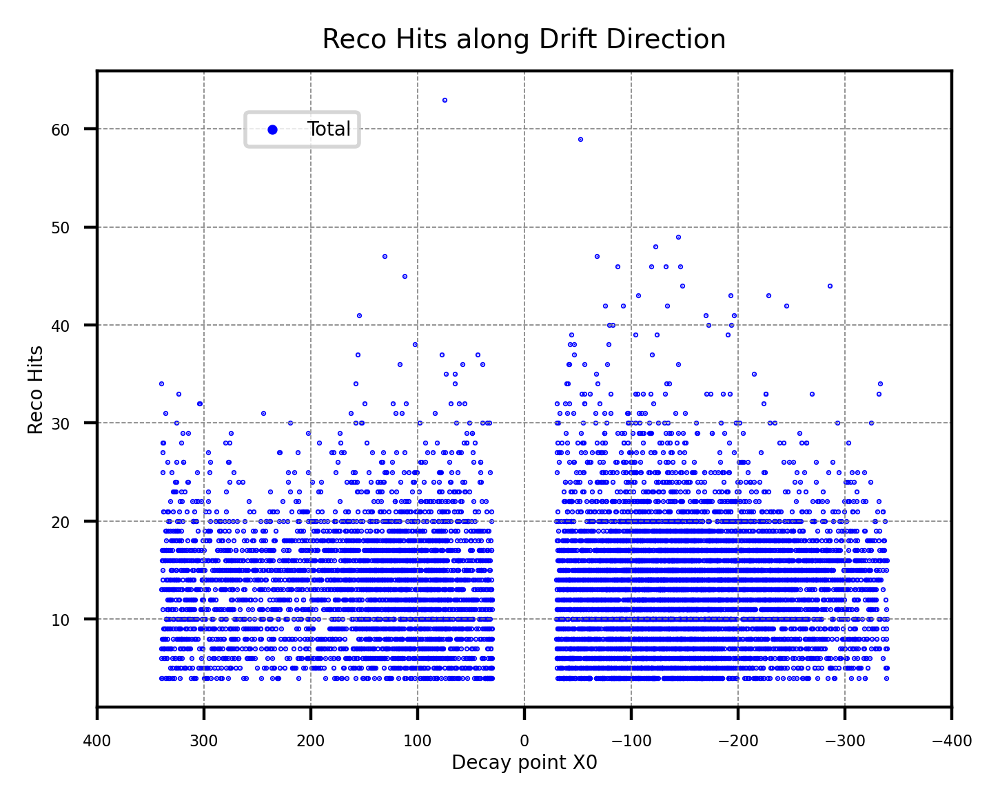


Michel Score Distribution: 


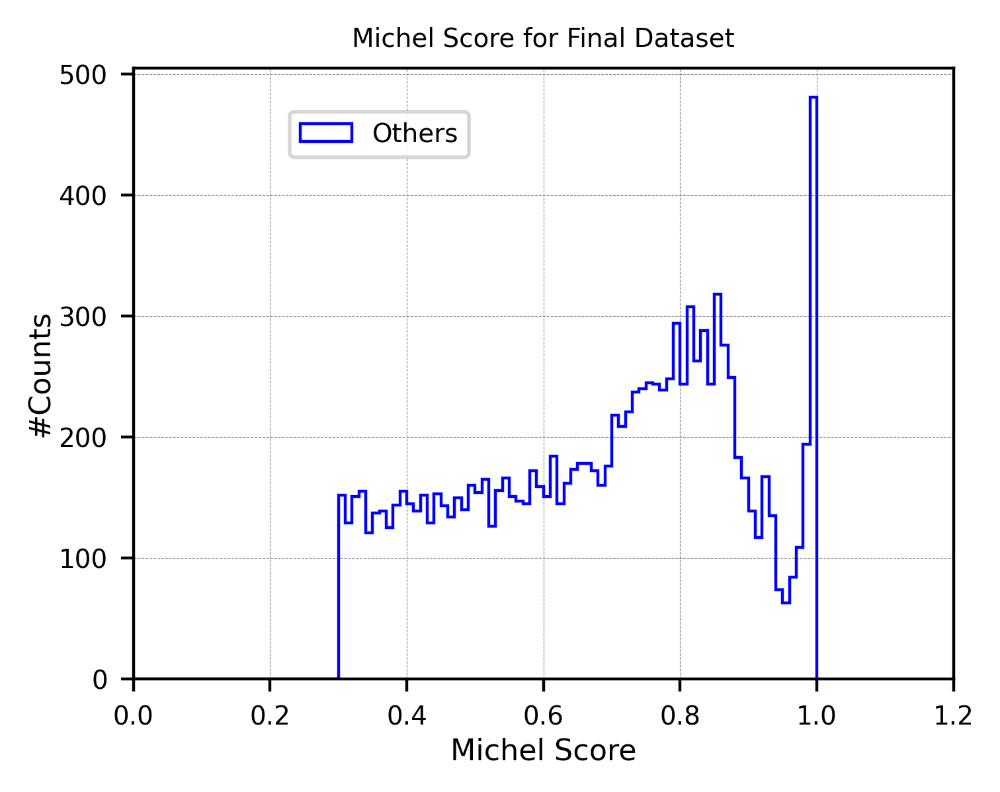


Michel Hits Distribution: 


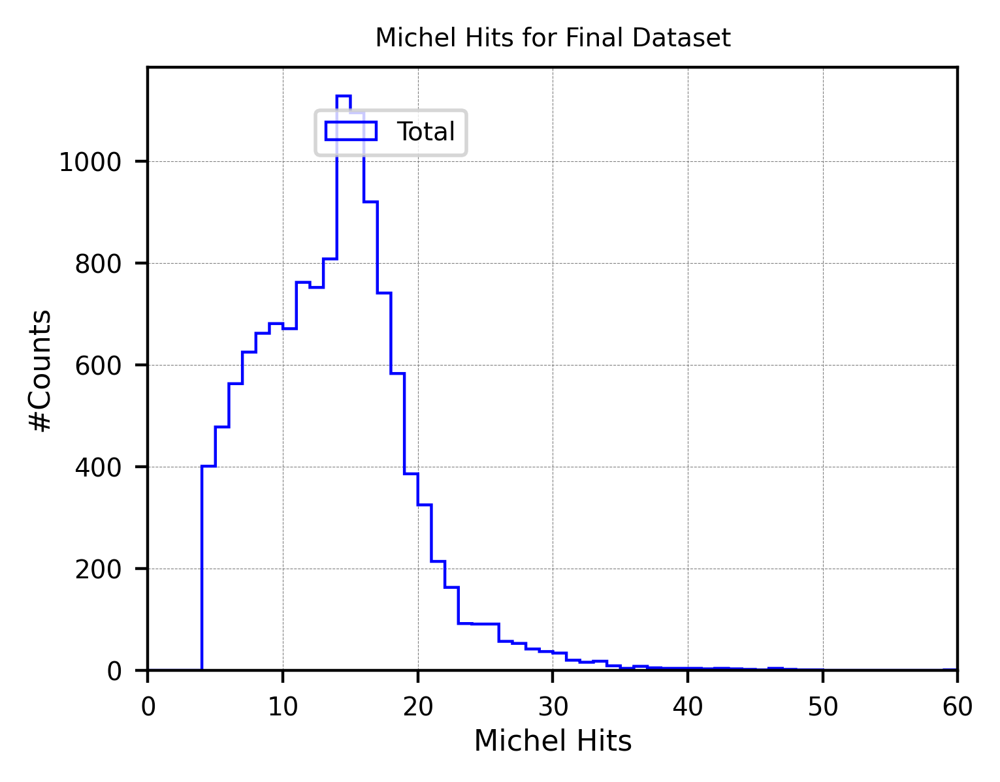

In [ ]:

hits_total_purify9 = [ev.michel_hits for ev in events_total_purify9]

score_total_purify9 = [ev.michel_score for ev in events_total_purify9]











# ==========================================================
# reco hits VS posX
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(posX_total_purify9, hits_total_purify9, s=0.1, c='blue', alpha=1.0, label="Total")
#-----------------------

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0, 2000)
plt.ylabel('Reco Hits', labelpad=1, fontsize=5)
plt.xlabel('Decay point X0', labelpad=1, fontsize=5)
plt.title('Reco Hits along Drift Direction', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=6, markerscale=5, ncol=1, prop={'size':5})
plt.show()














#Michel Score distribution:==========================================
print("\nMichel Score Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 0.01
range_min =-1
range_max = 1
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(score_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------

plt.xlim(0, 1.2)
plt.xlabel('Michel Score', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Score for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 







#Michel Hits distribution:==========================================
print("\nMichel Hits Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 1
range_min =0
range_max = 600
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(hits_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Total")

#--------------------------------

plt.xlim(0, 60)
plt.xlabel('Michel Hits', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Hits for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 





<br />
<br />
<br />

#### Lifetime Distribution of Final Dataset (purification 9):



For each event, +40ns for reco time


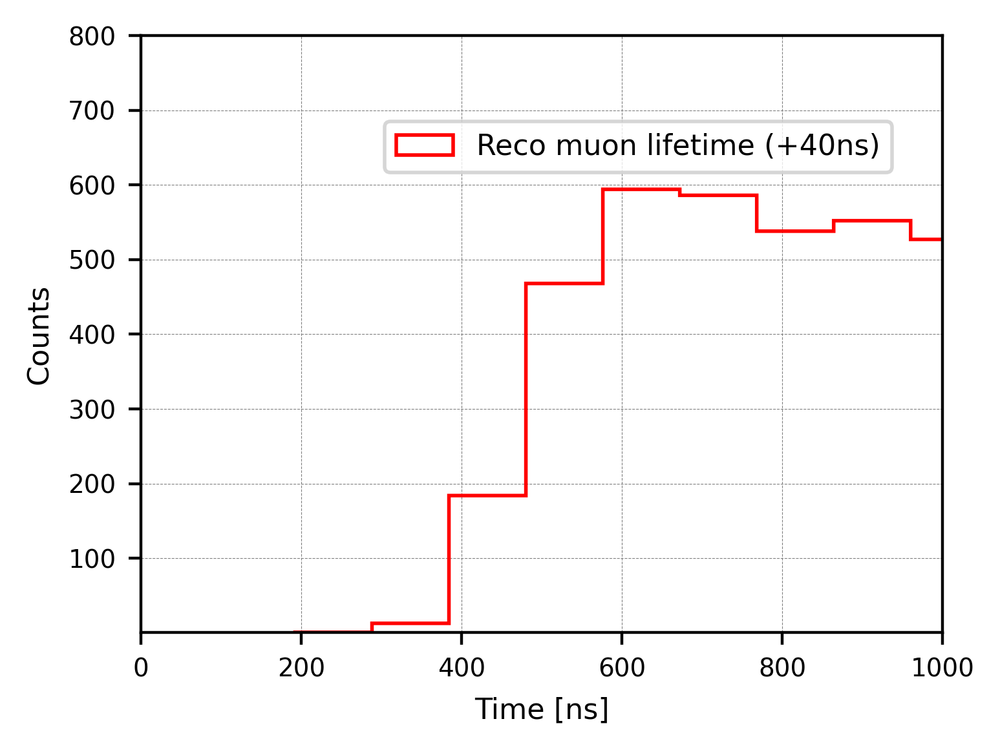

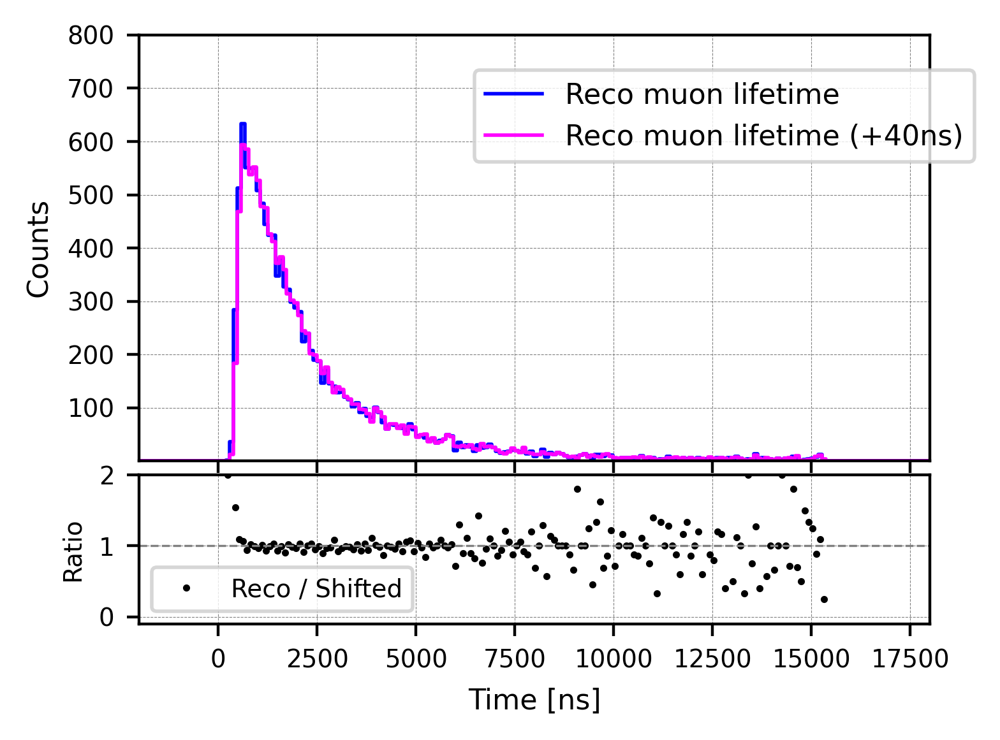

In [56]:

recoT_total_purify9 = [ev.reco_lifetime for ev in events_total_purify9]






#Shift +40ns=========================================
print("\n\n===================================")
print("For each event, +40ns for reco time")
recoT_total_purify9_shift40 = [x + 40 for x in recoT_total_purify9]


bin_width = 96
range_min = -960000
range_max = 960000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)
#plt.hist(recoT_total_purify9, bins=bins, range=(range_min, range_max),
#         edgecolor='blue', histtype='step', linewidth=1.0,
#         label='Reco muon lifetime')

plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
         edgecolor='red', histtype='step', linewidth=1.0,
         label='Reco muon lifetime (+40ns)')

#plt.axvline(384, linestyle='--', color='k', linewidth=0.8)

plt.xlim(0, 1000) 
#plt.xlim(-2000, 18000) 
plt.ylim(0.9, 800)
#plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.62, 0.88), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()











# ============================================================
# Histogram settings
# ============================================================
bin_width = 96
range_min = -96000
range_max = 96000

bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])

# ============================================================
# Histograms
# ============================================================
hist_reco, _ = np.histogram(recoT_total_purify9, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max))
ratio = np.full_like(hist_true, np.nan, dtype=float)
mask = (hist_true > 0) & (centers > 0)
ratio[mask] = hist_reco[mask] / hist_true[mask]

# ============================================================
fig = plt.figure(figsize=(4, 3), dpi=400)

gs = GridSpec(2, 1, height_ratios=[4, 1.4], hspace=0.05)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# ============================================================
# Top panel
# ============================================================
ax1.step(bins, np.append(hist_reco, 0), where='post', color='blue', linewidth=1.0, 
         label='Reco muon lifetime')
ax1.step(bins, np.append(hist_true, 0), where='post',color='magenta', linewidth=1.0,
         label='Reco muon lifetime (+40ns)')

ax1.set_xlim(-2000, 18000)
ax1.set_ylim(0.9, 800)
#ax1.set_ylim(0.9, 10000)

#ax1.set_yscale("log")
ax1.set_ylabel('Counts', fontsize=8)
ax1.tick_params(labelsize=7)
ax1.tick_params(labelbottom=False)
ax1.grid(color='gray', linestyle='--', linewidth=0.2)
ax1.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), prop={'size':8})

# ============================================================
ax2.plot(centers[mask], ratio[mask], 'o', ms=1.0, color='black', label='Reco / Shifted')
ax2.axhline(1.0, linestyle='--', linewidth=0.6, color='gray')

ax2.set_xlim(-2000, 18000)
ax2.set_ylim(-0.1, 2)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('Ratio', fontsize=7)
ax2.tick_params(labelsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2)
ax2.legend(fontsize=7)
plt.show()




<br />
<br />
<br />
<br />

### Apply BKG Subtraction:


Reading bkg reco lifetime distribution---
Entries in bkg sample: 1818

Target scaled bkg sample: 0
Scale factor: 0.0
Scaled bkg sample: 0.0

Reco entries in range: 12570
Background entries before scaling: 1818
Target scaled background: 0
Scale factor: 0.0
Scaled background: 0.0
After subtraction: 12570.0

Background subtraction: OFF
Maximum difference from sqrt(h_reco) when subtraction is off: 0.0


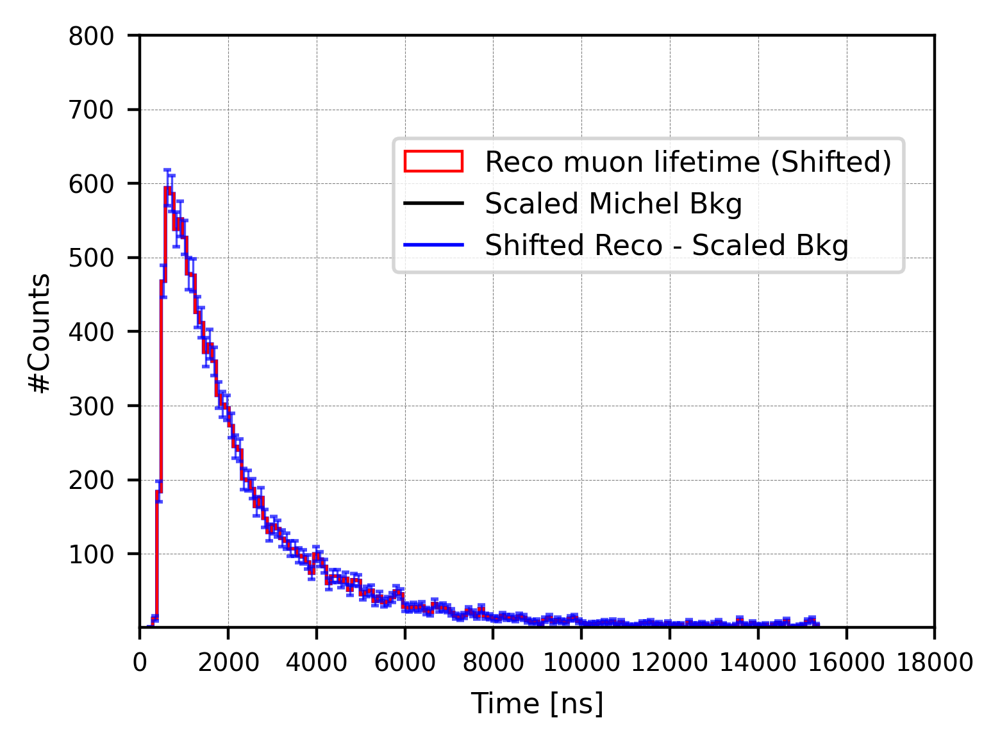

In [32]:
import numpy as np

# read the bkg reco lifetime distribution---
recoT_total_purify9_bkg = np.load("recoT_purify9_shift40_DataBkgSample.npy")

print("\nReading bkg reco lifetime distribution---")
print("Entries in bkg sample:", len(recoT_total_purify9_bkg))


# ---Binning ---
bin_width = 96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])

# --- Histograms ---
h_reco, _ = np.histogram(recoT_total_purify9_shift40, bins=bins)
h_bkg,  _ = np.histogram(recoT_total_purify9_bkg, bins=bins)


#============================================================================
# --- Scale background ---
# no scaling: 0.0; False Michel: 842
signal_bkg_Num = 0 #=========================================================

scale_bkg = signal_bkg_Num / np.sum(h_bkg)
h_bkg_scaled = h_bkg * scale_bkg
#=========================================================================

print("\nTarget scaled bkg sample:", signal_bkg_Num)
print("Scale factor:", scale_bkg)
print("Scaled bkg sample:", np.sum(h_bkg_scaled))



# ============================================================
# Bin-by-bin subtraction
# ============================================================

h_reco_subtracted = h_reco - h_bkg_scaled


# ============================================================
# Uncertainty of the background-subtracted histogram
#
# h_bkg_scaled_i = signal_bkg_Num * h_bkg_i / sum(h_bkg)
#
# signal_bkg_Num is treated as a fixed normalization here.
# The uncertainty includes:
#   1. Poisson uncertainty of the signal-region histogram
#   2. Statistical shape uncertainty of the normalized CR histogram
#
# signal_bkg_Num = 0 automatically gives:
#   h_reco_subtracted = h_reco
#   sigma_reco_subtracted = sqrt(h_reco)
# ============================================================

N_bkg_control = float(np.sum(h_bkg))

if N_bkg_control <= 0:
    raise ValueError("The background control histogram is empty.")

# Control-region bin fractions
bkg_fraction = h_bkg.astype(float) / N_bkg_control


# ------------------------------------------------------------
# Signal-region counting covariance
# ------------------------------------------------------------

Cov_reco_stat = np.diag(h_reco.astype(float))

# ------------------------------------------------------------
# Statistical covariance of the normalized CR template
#
# For p_i = B_i / sum(B):
#
# Cov(p_i, p_j) =
#     [delta_ij p_i - p_i p_j] / N_CR
#
# Multiplying the shape by signal_bkg_Num gives:
#
# Cov(B_scaled) =
#     signal_bkg_Num^2 / N_CR
#     * [diag(p) - outer(p,p)]
# ------------------------------------------------------------

Cov_bkg_shape = (signal_bkg_Num**2 / N_bkg_control) * (
    np.diag(bkg_fraction) - np.outer(bkg_fraction, bkg_fraction)
)

# ------------------------------------------------------------
# Complete covariance after subtraction
#
# Cov(D - B) = Cov(D) + Cov(B)
#
# The plus sign appears because variances add even though
# the central background histogram is subtracted.
# ------------------------------------------------------------

Cov_reco_subtracted = (Cov_reco_stat + Cov_bkg_shape)

sigma_reco_subtracted = np.sqrt(np.clip(np.diag(Cov_reco_subtracted), 0.0, None))


# ============================================================
# Print summary
# ============================================================

print("\nReco entries in range:", np.sum(h_reco))
print("Background entries before scaling:", np.sum(h_bkg))
print("Target scaled background:", signal_bkg_Num)
print("Scale factor:", scale_bkg)
print("Scaled background:", np.sum(h_bkg_scaled))
print("After subtraction:", np.sum(h_reco_subtracted))

if signal_bkg_Num == 0:
    print("\nBackground subtraction: OFF")
else:
    print("\nBackground subtraction: ON")

print(
    "Maximum difference from sqrt(h_reco) when subtraction is off:",
    np.max(np.abs(sigma_reco_subtracted - np.sqrt(h_reco))
    ) if signal_bkg_Num == 0 else "not applicable"
)








# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)

plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max), 
         edgecolor='red', histtype='step', linewidth=0.8, label='Reco muon lifetime (Shifted)')

plt.stairs(h_bkg_scaled, bins, color='black', linewidth=1.0, label='Scaled Michel Bkg')

plt.stairs(h_reco_subtracted, bins, color='blue', linewidth=1.0, label='Shifted Reco - Scaled Bkg')

plt.errorbar(
    centers,
    h_reco_subtracted,
    yerr=sigma_reco_subtracted,
    fmt="none",
    ecolor="blue",
    elinewidth=0.6,
    capsize=1.0,
    alpha=0.7
)


plt.xlim(0, 18000)
#plt.xlim(-2000, 18000)
plt.ylim(0.9, 800)
# plt.yscale("log")

plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)

plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.85), fontsize=11, markerscale=5, ncol=1, prop={'size':8})

plt.show()

### Uncertainty plot

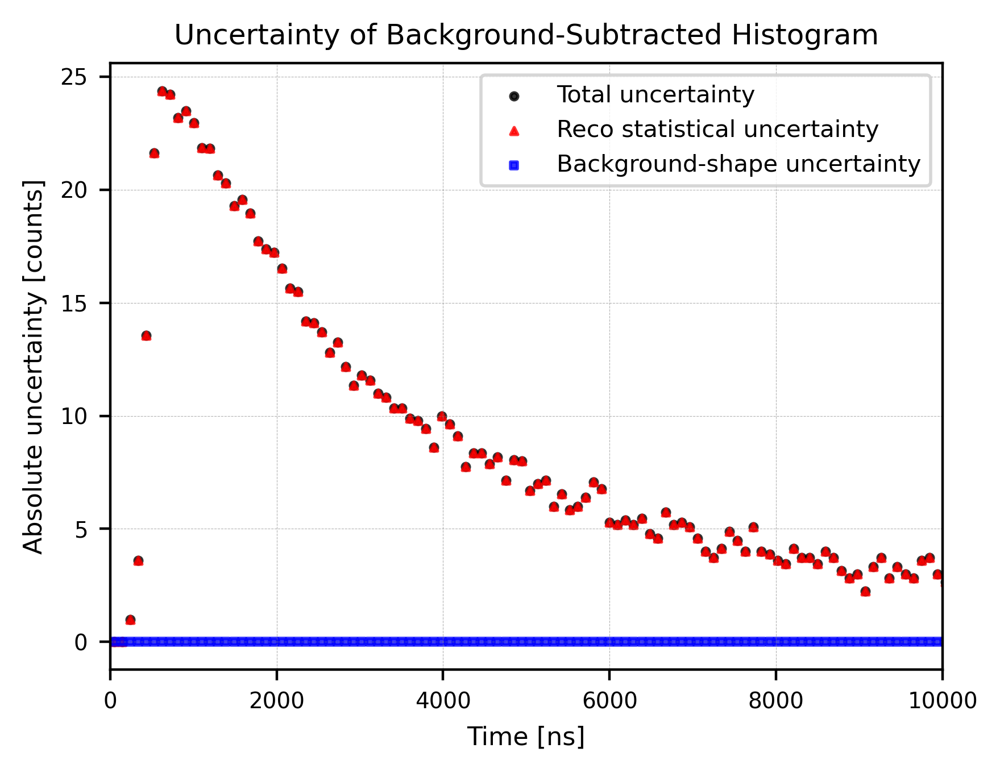


Bin center | Total unc. | Reco stat. | Bkg shape
------------------------------------------------
      48.0 |      0.000 |      0.000 |      0.000
     144.0 |      0.000 |      0.000 |      0.000
     240.0 |      1.000 |      1.000 |      0.000
     336.0 |      3.606 |      3.606 |      0.000
     432.0 |     13.565 |     13.565 |      0.000
     528.0 |     21.633 |     21.633 |      0.000
     624.0 |     24.372 |     24.372 |      0.000
     720.0 |     24.207 |     24.207 |      0.000
     816.0 |     23.195 |     23.195 |      0.000
     912.0 |     23.495 |     23.495 |      0.000


In [33]:
# ============================================================
# Plot uncertainties only — scatter style
# ============================================================

sigma_reco_stat = np.sqrt(
    np.clip(np.diag(Cov_reco_stat), 0.0, None)
)

sigma_bkg_shape = np.sqrt(
    np.clip(np.diag(Cov_bkg_shape), 0.0, None)
)

sigma_total = np.sqrt(
    np.clip(np.diag(Cov_reco_subtracted), 0.0, None)
)

# Plot range
plot_mask = (centers >= 0.0) & (centers <= 18000.0)

plt.figure(figsize=(4.5, 3.5), dpi=400)

plt.scatter(
    centers[plot_mask],
    sigma_total[plot_mask],
    color="black",
    marker="o",
    s=5,
    alpha=0.8,
    label="Total uncertainty"
)

plt.scatter(
    centers[plot_mask],
    sigma_reco_stat[plot_mask],
    color="red",
    marker="^",
    s=5,
    alpha=0.8,
    label="Reco statistical uncertainty"
)

plt.scatter(
    centers[plot_mask],
    sigma_bkg_shape[plot_mask],
    color="blue",
    marker="s",
    s=5,
    alpha=0.8,
    label="Background-shape uncertainty"
)

plt.xlim(0, 10000)
plt.xlabel("Time [ns]", fontsize=8)
plt.ylabel("Absolute uncertainty [counts]", fontsize=8)

plt.tick_params(labelsize=7)
plt.grid(
    color="gray",
    linestyle="--",
    linewidth=0.2,
    alpha=0.6
)
plt.legend(fontsize=7.5, loc="upper right")

plt.title(
    "Uncertainty of Background-Subtracted Histogram",
    fontsize=9
)

plt.tight_layout()
plt.show()


# Print the first 10 uncertainty values in the plotting range
plot_indices = np.where(plot_mask)[0][:10]

print("\nBin center | Total unc. | Reco stat. | Bkg shape")
print("------------------------------------------------")

for i in plot_indices:
    print(
        f"{centers[i]:10.1f} | "
        f"{sigma_total[i]:10.3f} | "
        f"{sigma_reco_stat[i]:10.3f} | "
        f"{sigma_bkg_shape[i]:10.3f}"
    )

<br />
<br />
<br />
<br />
<br />

### Apply detection efficiency:


Saved variables:
['bin_center', 'bin_low', 'bin_high', 'initial_counts', 'selected_counts', 'measured_efficiency', 'measured_efficiency_error', 'fitted_efficiency', 'fitted_efficiency_sigma', 'fitted_efficiency_low_68', 'fitted_efficiency_high_68', 'fitted_efficiency_error_low', 'fitted_efficiency_error_high', 'covariance_fitted_efficiency', 'spline_parameters', 'covariance_parameters', 'internal_knots', 'fit_lower_bound', 'fit_upper_bound', 'spline_degree']
Efficiency mode: fitted
Efficiency treatment: Fitted B-spline efficiency
Covariance mode: correlated
Covariance treatment: Full correlated efficiency covariance
Loaded efficiency bins: 100
Nonzero off-diagonal covariance elements: 9240
Maximum absolute off-diagonal covariance: 4.507238157377253e-05
Matched efficiency bins: 100
Valid correction bins: 100
Correction center range: 432.0 to 9936.0 ns
Corrected experimental histogram constructed.
Corrected covariance contains correlations: True
Maximum corrected off-diagonal covariance:

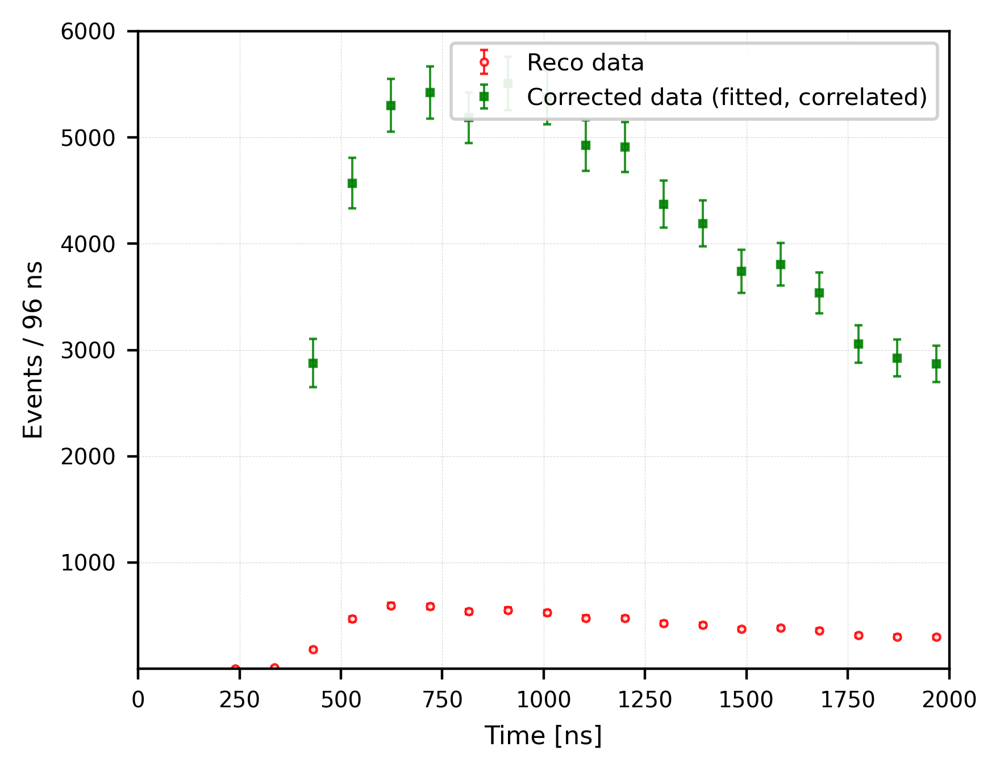

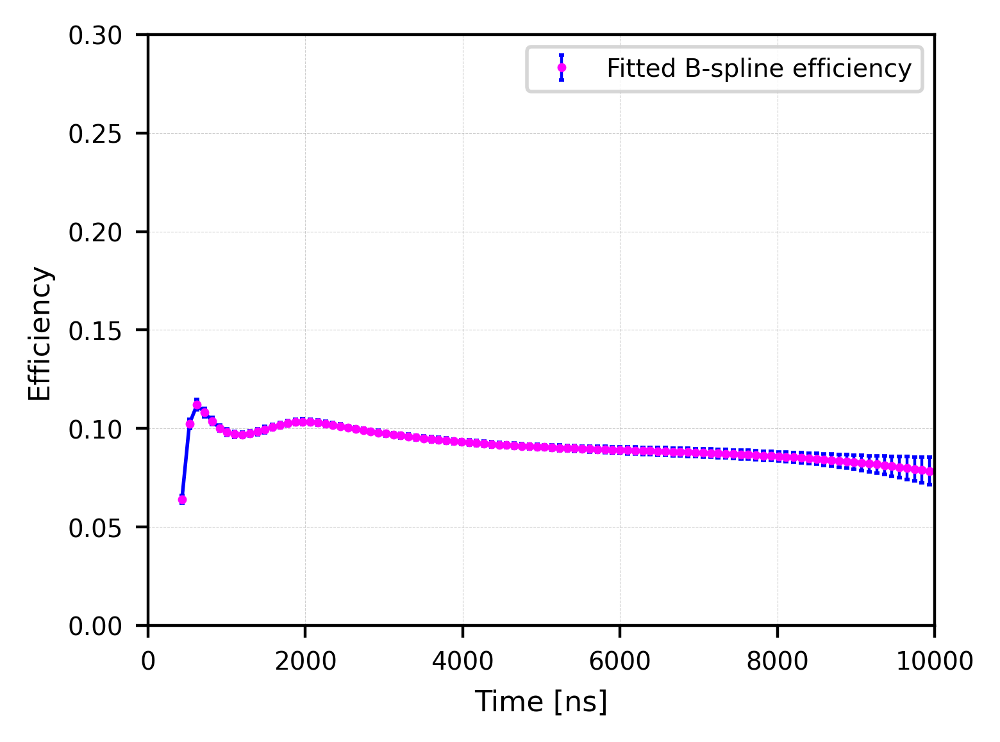

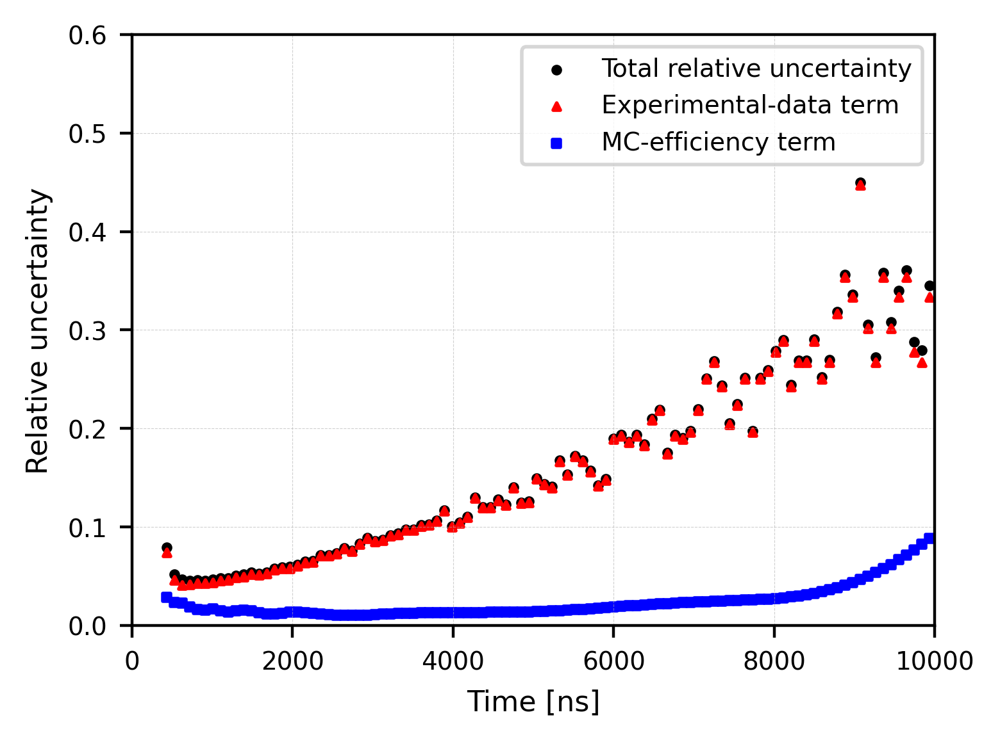

Saved: experimental_efficiency_corrected_fitted_correlated.npz


In [34]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 0. Select efficiency and covariance treatments
# ============================================================

# Efficiency central values
efficiency_mode = "fitted"       # "measured" or "fitted"

# Efficiency covariance used during error propagation
covariance_mode = "correlated"   # "diagonal" or "correlated"

efficiency_file = ("../MC_official2025/michel_efficiency_bspline_10par.npz")


# ============================================================
# 1. Define experimental-data bins
# ============================================================

bin_width = 96
range_min = -96000
range_max = 96000

bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])
nbins = len(centers)


# ============================================================
# 2. Load measured and fitted MC efficiencies
# ============================================================

eff_data = np.load(efficiency_file)

print("Saved variables:")
print(eff_data.files)

eff_centers = np.asarray(eff_data["bin_center"], dtype=float)


# ------------------------------------------------------------
# 2a. Select efficiency central values
# ------------------------------------------------------------
if efficiency_mode == "measured":

    eff_source = np.asarray(eff_data["measured_efficiency"], dtype=float)

    eff_unc_nominal = np.asarray(eff_data["measured_efficiency_error"], dtype=float)

    efficiency_label = "Measured MC efficiency"

    # A full measured covariance is optional. Your current file
    # may not contain this quantity.
    measured_covariance_key = "covariance_measured_efficiency"

    if measured_covariance_key in eff_data.files:
        Cov_eff_available = np.asarray(eff_data[measured_covariance_key], dtype=float)
        full_covariance_available = True

    else:
        # Only independent measured-bin errors are available.
        Cov_eff_available = np.diag(np.nan_to_num(eff_unc_nominal, nan=0.0)**2)
        full_covariance_available = False


elif efficiency_mode == "fitted":

    eff_source = np.asarray(eff_data["fitted_efficiency"], dtype=float)

    eff_unc_nominal = np.asarray(eff_data["fitted_efficiency_sigma"], dtype=float)

    # Full B-spline prediction covariance
    Cov_eff_available = np.asarray(eff_data["covariance_fitted_efficiency"], dtype=float)

    efficiency_label = "Fitted B-spline efficiency"
    full_covariance_available = True


else:
    raise ValueError("efficiency_mode must be 'measured' or 'fitted'.")


# ------------------------------------------------------------
# 2b. Validate available covariance
# ------------------------------------------------------------
number_efficiency_bins = len(eff_source)

if Cov_eff_available.shape != (number_efficiency_bins, number_efficiency_bins):
    raise ValueError(
        "Efficiency covariance has the wrong shape: "
        f"{Cov_eff_available.shape}; expected "
        f"({number_efficiency_bins}, "
        f"{number_efficiency_bins})."
    )

# Remove insignificant numerical asymmetry
Cov_eff_available = 0.5 * (Cov_eff_available + Cov_eff_available.T)


# ------------------------------------------------------------
# 2c. Select covariance treatment before propagation
# ------------------------------------------------------------
if covariance_mode == "diagonal":

    # Discard all correlations but retain each bin variance.
    Cov_eff_source = np.diag(np.diag(Cov_eff_available))

    covariance_label = "Diagonal efficiency covariance"


elif covariance_mode == "correlated":

    if not full_covariance_available:
        raise RuntimeError(
            "'measured + correlated' was selected, but the NPZ "
            "file does not contain a full measured-efficiency "
            "covariance matrix named "
            "'covariance_measured_efficiency'.\n\n"
            "A correlated covariance cannot be reconstructed from "
            "per-bin uncertainties alone. Select "
            "covariance_mode='diagonal', or save a genuine full "
            "measured covariance in the efficiency file."
        )

    # Retain both diagonal and off-diagonal terms.
    Cov_eff_source = Cov_eff_available.copy()

    covariance_label = "Full correlated efficiency covariance"


else:
    raise ValueError("covariance_mode must be 'diagonal' or 'correlated'.")


# Use uncertainties consistent with the selected covariance.
eff_unc_source = np.sqrt(np.clip(np.diag(Cov_eff_source), 0, None))


# ------------------------------------------------------------
# 2d. Covariance diagnostics
# ------------------------------------------------------------
off_diagonal_eff = (Cov_eff_source - np.diag(np.diag(Cov_eff_source)))

number_nonzero_off_diagonal = np.count_nonzero(~np.isclose(off_diagonal_eff, 0.0))

maximum_off_diagonal = np.max(np.abs(off_diagonal_eff))

print("Efficiency mode:", efficiency_mode)
print("Efficiency treatment:", efficiency_label)
print("Covariance mode:", covariance_mode)
print("Covariance treatment:", covariance_label)
print("Loaded efficiency bins:", len(eff_centers))
print("Nonzero off-diagonal covariance elements:", number_nonzero_off_diagonal)
print("Maximum absolute off-diagonal covariance:", maximum_off_diagonal)


# ============================================================
# 3. Experimental reconstructed histogram
# ============================================================

counts_reco = np.asarray(h_reco_subtracted, dtype=float).copy()
Cov_reco = np.asarray(Cov_reco_subtracted, dtype=float).copy()

sigma_reco = np.sqrt(
    np.clip(np.diag(Cov_reco), 0.0, None)
)



# ============================================================
# 4. Align MC efficiency bins with experimental histogram bins
# ============================================================

eff_full = np.full(nbins, np.nan)
eff_unc_full = np.full(nbins, np.nan)
Cov_eff_full = np.zeros((nbins, nbins))

histogram_indices = []
efficiency_indices = []

for source_index, source_center in enumerate(eff_centers):
    matches = np.where(np.isclose(centers, source_center, atol=1e-8))[0]

    if len(matches) == 1:
        histogram_indices.append(matches[0])
        efficiency_indices.append(source_index)

histogram_indices = np.asarray(histogram_indices, dtype=int)
efficiency_indices = np.asarray(efficiency_indices, dtype=int)

eff_full[histogram_indices] = eff_source[efficiency_indices]
eff_unc_full[histogram_indices] = eff_unc_source[efficiency_indices]

Cov_eff_full[np.ix_(histogram_indices, histogram_indices)] = (
    Cov_eff_source[np.ix_(efficiency_indices, efficiency_indices)]
)

valid = (np.isfinite(eff_full) & (eff_full > 0) & (centers >= 384) & (centers <= 12000))

print("Matched efficiency bins:", len(histogram_indices))
print("Valid correction bins:", np.count_nonzero(valid))
print("Correction center range:", centers[valid][0], "to", centers[valid][-1], "ns")


# ============================================================
# 5. Apply efficiency correction
# ============================================================

R_corr = np.full(nbins, np.nan)
R_corr[valid] = counts_reco[valid] / eff_full[valid]

# ------------------------------------------------------------
# Experimental-data statistical contribution
#
# Var(N/epsilon) from N:
# Var_data = Var(N) / epsilon^2
# ------------------------------------------------------------

inverse_efficiency = np.zeros(nbins)
inverse_efficiency[valid] = 1.0 / eff_full[valid]

Cov_corr_data = (
    inverse_efficiency[:, None]
    * Cov_reco
    * inverse_efficiency[None, :]
)

# ------------------------------------------------------------
# MC-efficiency contribution
#
# d(N/epsilon)/d epsilon = -N/epsilon^2
# ------------------------------------------------------------

eff_derivative_scale = np.zeros(nbins)
eff_derivative_scale[valid] = counts_reco[valid] / eff_full[valid]**2

Cov_corr_eff = (
    eff_derivative_scale[:, None]
    * Cov_eff_full
    * eff_derivative_scale[None, :]
)

# Data and MC are independent, so their covariances can be added
Cov_R_corr = Cov_corr_data + Cov_corr_eff
sigma_R_corr = np.sqrt(np.clip(np.diag(Cov_R_corr), 0, None))

term_data = np.diag(Cov_corr_data)
term_eff = np.diag(Cov_corr_eff)

print("Corrected experimental histogram constructed.")


# ============================================================
# Corrected-data covariance diagnostic
# ============================================================

Cov_R_corr_valid = Cov_R_corr[np.ix_(valid, valid)]

off_diagonal_corr = (Cov_R_corr_valid - np.diag(np.diag(Cov_R_corr_valid))
)

print(
    "Corrected covariance contains correlations:",
    np.any(~np.isclose(off_diagonal_corr, 0.0))
)

print(
    "Maximum corrected off-diagonal covariance:",
    np.max(np.abs(off_diagonal_corr))
)





# ============================================================
# 6. Plot raw and corrected experimental data
# ============================================================

raw_plot_mask = (
    (centers >= -2000) & (centers <= 18000)
    & np.isfinite(counts_reco) & (counts_reco > 0)
)

corrected_plot_mask = (
    valid
    & np.isfinite(R_corr) & (R_corr > 0)
    & np.isfinite(sigma_R_corr)
)

plt.figure(figsize=(4.5, 3.5), dpi=400)

# Raw experimental reconstructed data
plt.errorbar(
    centers[raw_plot_mask], counts_reco[raw_plot_mask],
    yerr=sigma_reco[raw_plot_mask], fmt="o", ms=2.2,
    mfc="white", mec="red", mew=0.8, ecolor="red",
    elinewidth=0.7, capsize=1.2, alpha=0.85,
    label="Reco data"
)

# Efficiency-corrected experimental data
plt.errorbar(
    centers[corrected_plot_mask], R_corr[corrected_plot_mask],
    yerr=sigma_R_corr[corrected_plot_mask], fmt="s", ms=2.2,
    mfc="green", mec="green", mew=0.8, ecolor="green",
    elinewidth=0.7, capsize=1.2, alpha=0.85,
    label=(f"Corrected data "
        f"({efficiency_mode}, {covariance_mode})"
    )
)

#plt.xlim(-2000, 18000)
plt.xlim(0, 2000)
plt.ylim(0.9, 6000)
#plt.ylim(0.9, 1000)
#plt.yscale("log")

plt.xlabel("Time [ns]", fontsize=8)
plt.ylabel(f"Events / {bin_width:.0f} ns", fontsize=8)
plt.grid(ls="--", lw=0.2, alpha=0.5)
plt.tick_params(labelsize=7)
plt.legend(fontsize=7.5, loc="upper right", frameon=True, framealpha=0.9)

plt.tight_layout()
plt.show()


# ============================================================
# 7. Plot the efficiency used for correction
# ============================================================

plt.figure(figsize=(4, 3), dpi=400)

plt.errorbar(centers[valid], eff_full[valid], yerr=eff_unc_full[valid],
             fmt="o", ms=1.5, color="magenta", ecolor="blue",
             elinewidth=0.8, capsize=0.8, label=efficiency_label)

if efficiency_mode == "fitted":
    plt.plot(centers[valid], eff_full[valid], color="blue", lw=1.0)

plt.xlim(0, 10000)
plt.ylim(0.0, 0.3)
plt.xlabel("Time [ns]", fontsize=8)
plt.ylabel("Efficiency", fontsize=8)
plt.grid(ls="--", lw=0.2, alpha=0.6)
plt.tick_params(labelsize=7)
plt.legend(fontsize=7)
plt.tight_layout()
plt.show()


# ============================================================
# 8. Plot relative uncertainty contributions
# ============================================================

relative_data = np.full(nbins, np.nan)
relative_efficiency = np.full(nbins, np.nan)
relative_total = np.full(nbins, np.nan)

relative_data[valid] = np.sqrt(term_data[valid]) / R_corr[valid]
relative_efficiency[valid] = np.sqrt(term_eff[valid]) / R_corr[valid]
relative_total[valid] = sigma_R_corr[valid] / R_corr[valid]

plt.figure(figsize=(4, 3), dpi=400)

plt.scatter(centers[valid], relative_total[valid], color="black", s=4,
            label="Total relative uncertainty")

plt.scatter(centers[valid], relative_data[valid], color="red", marker="^", s=4,
            label="Experimental-data term")

plt.scatter(centers[valid], relative_efficiency[valid], color="blue", marker="s", s=4,
            label="MC-efficiency term")

plt.xlim(0, 10000)
plt.ylim(0, 0.6)
plt.xlabel("Time [ns]", fontsize=8)
plt.ylabel("Relative uncertainty", fontsize=8)
plt.grid(ls="--", lw=0.2, alpha=0.6)
plt.tick_params(labelsize=7)
plt.legend(fontsize=7)
plt.tight_layout()
plt.show()



# ============================================================
# 9. Save corrected experimental result
# ============================================================

output_name = (
    f"experimental_efficiency_corrected_"
    f"{efficiency_mode}_{covariance_mode}.npz"
)

np.savez_compressed(
    output_name,

    bin_edges=bins,
    bin_centers=centers,

    raw_reco_counts=counts_reco,
    raw_reco_uncertainty=sigma_reco,

    corrected_counts=R_corr,
    corrected_uncertainty=sigma_R_corr,
    corrected_covariance=Cov_R_corr,

    covariance_data=Cov_corr_data,
    covariance_efficiency=Cov_corr_eff,

    efficiency=eff_full,
    efficiency_uncertainty=eff_unc_full,
    efficiency_covariance=Cov_eff_full,

    valid_mask=valid,

    efficiency_mode=efficiency_mode,
    covariance_mode=covariance_mode
)

print("Saved:", output_name)

#### Uncertainty printing:

In [35]:
# ============================================================
# Bin uncertainties and correlations after efficiency correction
# ============================================================

import numpy as np


# ============================================================
# 1. Diagnostic range
# ============================================================

diagnostic_min = 384.0
diagnostic_max = 10000.0

total_variance = np.diag(Cov_R_corr)

diagnostic_mask = (
    valid
    & (centers >= diagnostic_min)
    & (centers <= diagnostic_max)
    & np.isfinite(R_corr)
    & np.isfinite(total_variance)
    & (R_corr > 0)
    & (total_variance > 0)
)

diagnostic_indices = np.flatnonzero(diagnostic_mask)

if len(diagnostic_indices) == 0:
    raise RuntimeError(
        "No valid bins were found in the diagnostic range."
    )


# ============================================================
# 2. Separate reconstructed-data and background contributions
#
# Cov_reco_subtracted =
#     Cov_reco_stat + Cov_bkg_shape
#
# These two contributions are independently propagated through
# the efficiency correction.
# ============================================================

inverse_efficiency_diagnostic = np.zeros(nbins)

inverse_efficiency_diagnostic[valid] = (
    1.0 / eff_full[valid]
)

Cov_corr_counting = (
    inverse_efficiency_diagnostic[:, None]
    * Cov_reco_stat
    * inverse_efficiency_diagnostic[None, :]
)

Cov_corr_background = (
    inverse_efficiency_diagnostic[:, None]
    * Cov_bkg_shape
    * inverse_efficiency_diagnostic[None, :]
)

# Check that the decomposition reproduces Cov_corr_data
decomposition_difference = np.max(
    np.abs(
        Cov_corr_data
        - Cov_corr_counting
        - Cov_corr_background
    )
)

print(
    "Maximum data-covariance decomposition difference:",
    decomposition_difference
)


# ============================================================
# 3. Per-bin absolute and relative uncertainties
# ============================================================

counting_error = np.sqrt(
    np.clip(np.diag(Cov_corr_counting), 0.0, None)
)

background_error = np.sqrt(
    np.clip(np.diag(Cov_corr_background), 0.0, None)
)

data_background_error = np.sqrt(
    np.clip(np.diag(Cov_corr_data), 0.0, None)
)

efficiency_error = np.sqrt(
    np.clip(np.diag(Cov_corr_eff), 0.0, None)
)

total_error = np.sqrt(
    np.clip(np.diag(Cov_R_corr), 0.0, None)
)

relative_total_error = np.full(nbins, np.nan)

relative_total_error[diagnostic_mask] = (
    total_error[diagnostic_mask]
    / R_corr[diagnostic_mask]
)


print("\nPer-bin uncertainty decomposition")
print(
    "==========================================================================================="
)
print(
    f"{'Center':>8s}"
    f"{'Corrected':>13s}"
    f"{'Total err':>13s}"
    f"{'Relative':>12s}"
    f"{'Count err':>13s}"
    f"{'Bkg err':>13s}"
    f"{'Count+Bkg':>13s}"
    f"{'Eff err':>13s}"
)
print(
    "==========================================================================================="
)

for index in diagnostic_indices:
    print(
        f"{centers[index]:8.0f}"
        f"{R_corr[index]:13.3f}"
        f"{total_error[index]:13.3f}"
        f"{relative_total_error[index]:12.3%}"
        f"{counting_error[index]:13.3f}"
        f"{background_error[index]:13.3f}"
        f"{data_background_error[index]:13.3f}"
        f"{efficiency_error[index]:13.3f}"
    )


print("\nSummary of relative bin uncertainties")
print(
    "Number of diagnostic bins:",
    len(diagnostic_indices)
)
print(
    "Mean relative uncertainty:",
    np.mean(relative_total_error[diagnostic_mask])
)
print(
    "Median relative uncertainty:",
    np.median(relative_total_error[diagnostic_mask])
)
print(
    "Minimum relative uncertainty:",
    np.min(relative_total_error[diagnostic_mask])
)
print(
    "Maximum relative uncertainty:",
    np.max(relative_total_error[diagnostic_mask])
)


# ============================================================
# 4. Construct the corrected-spectrum correlation matrix
# ============================================================

Cov_selected = Cov_R_corr[
    np.ix_(diagnostic_indices, diagnostic_indices)
].copy()

Cov_selected = 0.5 * (
    Cov_selected + Cov_selected.T
)

selected_errors = np.sqrt(
    np.clip(np.diag(Cov_selected), 0.0, None)
)

Corr_selected = np.divide(
    Cov_selected,
    np.outer(selected_errors, selected_errors),
    out=np.zeros_like(Cov_selected),
    where=np.outer(selected_errors, selected_errors) > 0
)

# Remove insignificant numerical asymmetry
Corr_selected = 0.5 * (
    Corr_selected + Corr_selected.T
)

np.fill_diagonal(Corr_selected, 1.0)


# ============================================================
# 5. Correlation diagnostics
# ============================================================

off_diagonal_correlation = (
    Corr_selected
    - np.eye(len(diagnostic_indices))
)

print("\nCorrected-spectrum correlation diagnostics")
print(
    "Maximum absolute off-diagonal correlation:",
    np.max(np.abs(off_diagonal_correlation))
)

# Find the most strongly correlated pair
upper_triangle = np.triu_indices(
    len(diagnostic_indices),
    k=1
)

upper_correlations = np.abs(
    Corr_selected[upper_triangle]
)

if len(upper_correlations) > 0:
    strongest_position = np.argmax(upper_correlations)

    row = upper_triangle[0][strongest_position]
    column = upper_triangle[1][strongest_position]

    original_row = diagnostic_indices[row]
    original_column = diagnostic_indices[column]

    print(
        "Strongest correlated bin pair:",
        f"{centers[original_row]:.0f} ns and "
        f"{centers[original_column]:.0f} ns"
    )

    print(
        "Correlation coefficient:",
        Corr_selected[row, column]
    )


# ============================================================
# 6. Print the first ten corrected-bin correlations
# ============================================================

number_to_print = min(
    10,
    len(diagnostic_indices)
)

printed_indices = diagnostic_indices[:number_to_print]
printed_centers = centers[printed_indices]

Corr_first = Corr_selected[
    :number_to_print,
    :number_to_print
]

print(
    f"\nCorrelation matrix for the first "
    f"{number_to_print} diagnostic bins"
)
print("Rows and columns are bin centers in ns.\n")

print(
    f"{'Bin':>8s}",
    "".join(
        f"{center:>10.0f}"
        for center in printed_centers
    )
)

for center, row in zip(
    printed_centers,
    Corr_first
):
    print(
        f"{center:8.0f}",
        "".join(
            f"{value:10.4f}"
            for value in row
        )
    )

Maximum data-covariance decomposition difference: 0.0

Per-bin uncertainty decomposition
  Center    Corrected    Total err    Relative    Count err      Bkg err    Count+Bkg      Eff err
     432     2876.710      227.491      7.908%      212.074        0.000      212.074       82.323
     528     4570.635      236.562      5.176%      211.278        0.000      211.278      106.412
     624     5300.658      248.595      4.690%      217.489        0.000      217.489      120.409
     720     5422.389      246.772      4.551%      223.997        0.000      223.997      103.545
     816     5185.473      239.255      4.614%      223.562        0.000      223.562       85.224
     912     5508.169      249.087      4.522%      234.443        0.000      234.443       84.148
    1008     5374.715      251.079      4.671%      234.126        0.000      234.126       90.696
    1104     4924.814      237.155      4.816%      225.256        0.000      225.256       74.176
    1200     4909.87

<br />
<br />
<br />
<br />
<br />

### Apply fitting:

#### Fitting function:

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.optimize import curve_fit


# ============================================================
# Integrated double-exponential model
# ============================================================
def exp2_integrated(bin_edges, N, tau1, ratio, tau2=2197.0):
    """
    Expected number of events in each histogram bin.
    """
    left_edges = bin_edges[:-1]
    right_edges = bin_edges[1:]

    component1 = (
        np.exp(-left_edges / tau1)
        - np.exp(-right_edges / tau1)
    )

    component2 = (
        np.exp(-left_edges / tau2)
        - np.exp(-right_edges / tau2)
    )

    return N * (component1 + ratio * component2)


# ============================================================
# Correlated chi-square fit
# ============================================================
def fit_double_exp(
    bin_edges,
    y,
    ycov,
    fit_range=(960, 10000),
    tau2=2197.0,
    raw_y=None,
    analysis_label=None
):
    """
    Fit an efficiency-corrected histogram using the covariance
    matrix constructed during efficiency correction.

    The fitting function does not select diagonal or correlated
    treatment. It uses ycov exactly as supplied.

    Parameters
    ----------
    bin_edges : array
        Histogram bin edges.

    y : array
        Efficiency-corrected histogram values.

    ycov : 2D array
        Corrected-data covariance matrix. It may be diagonal or
        correlated, depending on the upstream propagation mode.

    fit_range : tuple
        Time range used in the fit.

    tau2 : float
        Fixed second lifetime.

    raw_y : array or None
        Raw reconstructed histogram, used only for plotting.

    analysis_label : str or None
        Description displayed in the plot legend.
    """

    bin_edges = np.asarray(bin_edges, dtype=float)
    y = np.asarray(y, dtype=float)

    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    bin_widths = np.diff(bin_edges)

    if len(bin_edges) != len(y) + 1:
        raise ValueError(
            "Expected len(bin_edges) = len(y) + 1."
        )

    # The smooth display curve below assumes uniform-width bins.
    if not np.allclose(bin_widths, bin_widths[0]):
        raise ValueError(
            "This plotting implementation requires uniform-width bins."
        )

    bin_width = bin_widths[0]

    # ========================================================
    # Validate the covariance produced upstream
    # ========================================================
    ycov = np.asarray(ycov, dtype=float)

    if ycov.shape != (len(y), len(y)):
        raise ValueError(
            "ycov must have shape "
            f"({len(y)}, {len(y)}); got {ycov.shape}."
        )

    if not np.all(np.isfinite(ycov)):
        raise ValueError(
            "ycov contains non-finite values."
        )

    # Remove insignificant numerical asymmetry
    ycov = 0.5 * (ycov + ycov.T)

    # Individual errors used for plotting and bin validation
    yerr_plot = np.sqrt(
        np.clip(np.diag(ycov), 0, None)
    )

    # ========================================================
    # Select fit bins
    # ========================================================
    fit_mask = (
        (bin_centers >= fit_range[0])
        & (bin_centers <= fit_range[1])
        & np.isfinite(y)
        & (y > 0)
        & np.isfinite(yerr_plot)
        & (yerr_plot > 0)
    )

    fit_indices = np.flatnonzero(fit_mask)

    if len(fit_indices) < 4:
        raise RuntimeError(
            "At least four valid bins are required."
        )

    first_bin = fit_indices[0]
    last_bin = fit_indices[-1]

    # exp2_integrated requires a continuous sequence of bin edges.
    expected_indices = np.arange(first_bin, last_bin + 1)

    if not np.array_equal(fit_indices, expected_indices):
        raise RuntimeError(
            "There are missing or invalid bins inside the fit range. "
            "Choose a continuous valid range or inspect the efficiency."
        )

    edges_fit = bin_edges[first_bin:last_bin + 2]
    centers_fit = bin_centers[first_bin:last_bin + 1]
    y_fit = y[first_bin:last_bin + 1]

    covariance_fit = ycov[
        first_bin:last_bin + 1,
        first_bin:last_bin + 1
    ]

    covariance_fit = 0.5 * (
        covariance_fit + covariance_fit.T
    )

    sigma_fit_plot = np.sqrt(
        np.clip(np.diag(covariance_fit), 0, None)
    )

    # curve_fit requires the selected covariance to be
    # positive definite.
    try:
        np.linalg.cholesky(covariance_fit)
    except np.linalg.LinAlgError as error:
        raise RuntimeError(
            "The covariance matrix inside the fit range is not "
            "positive definite. Check zero-count bins, efficiency "
            "uncertainties, and covariance construction."
        ) from error

    # ========================================================
    # Initial parameter estimates
    # ========================================================
    tau1_initial = 1000.0
    ratio_initial = 4.5

    unit_prediction = exp2_integrated(
        edges_fit,
        N=1.0,
        tau1=tau1_initial,
        ratio=ratio_initial,
        tau2=tau2
    )

    N_initial = np.sum(y_fit) / np.sum(unit_prediction)

    # ========================================================
    # Perform fit
    # ========================================================
    popt, pcov = curve_fit(
        lambda edges, N, tau1, ratio: exp2_integrated(
            edges,
            N,
            tau1,
            ratio,
            tau2
        ),
        edges_fit,
        y_fit,
        p0=[
            N_initial,
            tau1_initial,
            ratio_initial
        ],
        sigma=covariance_fit,
        absolute_sigma=True,
        bounds=(
            [0.0, 1.0e-6, 0.0],
            [np.inf, np.inf, 20.0]
        ),
        maxfev=20000
    )

    N_fit, tau1_fit, ratio_fit = popt
    N_err, tau1_err, ratio_err = np.sqrt(
        np.diag(pcov)
    )

    # ========================================================
    # Model, residuals, and chi-square
    # ========================================================
    model_fit = exp2_integrated(
        edges_fit,
        N_fit,
        tau1_fit,
        ratio_fit,
        tau2
    )

    residuals = y_fit - model_fit

    # Uses the supplied covariance exactly as constructed upstream:
    # chi2 = residual.T @ covariance^-1 @ residual
    chi2 = float(
        residuals @ np.linalg.solve(
            covariance_fit,
            residuals
        )
    )

    number_parameters = len(popt)
    ndf = len(y_fit) - number_parameters

    # These are standardized residuals. When covariance is
    # non-diagonal, they are not statistically independent.
    standardized_residuals = (
        residuals / sigma_fit_plot
    )

    # ========================================================
    # Smooth curve for display
    # ========================================================
    xs = np.linspace(
        fit_range[0],
        fit_range[1],
        600
    )

    ys = bin_width * (
        (N_fit / tau1_fit) * np.exp(-xs / tau1_fit)
        +
        (N_fit * ratio_fit / tau2) * np.exp(-xs / tau2)
    )


    # ========================================================
    # Plot
    # ========================================================
    fig = plt.figure(figsize=(4.8, 4.0), dpi=400)

    grid = GridSpec(
        2,
        1,
        height_ratios=[3, 1],
        hspace=0.05
    )

    ax1 = fig.add_subplot(grid[0])
    ax2 = fig.add_subplot(grid[1], sharex=ax1)

    # ========================================================
    # Raw reconstructed data: red open circles
    # ========================================================
    if raw_y is not None:
        raw_y = np.asarray(raw_y, dtype=float)

        # Appropriate for an unweighted event-count histogram
        raw_yerr = np.sqrt(np.clip(raw_y, 0, None))

        raw_plot_mask = (
            np.isfinite(raw_y)
            & np.isfinite(raw_yerr)
            & (raw_y > 0)
        )

        ax1.errorbar(
            bin_centers[raw_plot_mask],
            raw_y[raw_plot_mask],
            yerr=raw_yerr[raw_plot_mask],
            fmt="s",
            ms=1.5,
            mfc="white",
            mec="red",
            mew=0.8,
            color="red",
            ecolor="red",
            elinewidth=0.7,
            capsize=1.2,
            alpha=0.85,
            label="Reco data"
        )

    # ========================================================
    # Efficiency-corrected data: green filled squares
    # ========================================================
    corrected_label = "Efficiency-corrected data"

#    if analysis_label is not None:
#        corrected_label += f" ({analysis_label})"

    corrected_plot_mask = (
        np.isfinite(y)
        & np.isfinite(yerr_plot)
        & (y > 0)
        & (yerr_plot > 0)
    )

    ax1.errorbar(
        bin_centers[corrected_plot_mask],
        y[corrected_plot_mask],
        yerr=yerr_plot[corrected_plot_mask],
        fmt="s",
        ms=2.5,
        mfc="green",
        mec="green",
        mew=0.8,
        color="green",
        ecolor="green",
        elinewidth=0.7,
        capsize=1.2,
        alpha=0.85,
        label=corrected_label
    )



    # ========================================================
    # Fitted model and legend label
    # ========================================================
    fit_label = (
        "Integrated double-exponential fit\n"
        + rf"$\tau_{{\mu^-}}={tau1_fit:.1f}\pm{tau1_err:.1f}$ ns"
        + "\n"
        + rf"$N={N_fit:.0f}\pm{N_err:.0f}$"
        + "\n"
        + rf"$r={ratio_fit:.2f}\pm{ratio_err:.2f}$"
        + "\n"
        + rf"$\tau_{{\mu^+}}={tau2:.1f}$ ns (fixed)"
        + "\n"
        + rf"$\chi^2/\mathrm{{ndf}}={chi2:.1f}/{ndf}$"
    )

    ax1.plot(xs, ys, color="orange", lw=1.5, label=fit_label)

    handles, labels = ax1.get_legend_handles_labels()

    desired_order = [
        "Reco data",
        "Efficiency-corrected data",
        fit_label
    ]

    ordered_pairs = [
        (handles[labels.index(label)], label)
        for label in desired_order
        if label in labels
    ]

    ax1.legend(
        [handle for handle, label in ordered_pairs],
        [label for handle, label in ordered_pairs],
        fontsize=7.5,
        loc="upper right",
        framealpha=0.9
    )

    #ax1.set_xlim(-2000, 18000)
    ax1.set_xlim(-2000, 12000)
    ax1.set_ylim(0.9, 8000)
    # ax1.set_yscale("log")
    ax1.set_ylabel(f"Events / {bin_width:.0f} ns", fontsize=9)
    ax1.grid(ls="--", lw=0.3, alpha=0.6)
    ax1.tick_params(labelbottom=False, labelsize=7)





    # Standardized residuals
    # Standardized residuals with ±1σ error bars
    ax2.errorbar(centers_fit, standardized_residuals, 
                 yerr=np.ones_like(standardized_residuals),
                 fmt="o", ms=2.2, color="orange", ecolor="orange", 
                 elinewidth=0.8, capsize=1.2, alpha=0.9)

    ax2.axhline(0.0, color="gray", ls="--", lw=0.8)

    ax2.axhline(3.0, color="gray", ls=":", lw=0.6)

    ax2.axhline(-3.0, color="gray", ls=":", lw=0.6)

    #ax2.set_xlim(-2000, 18000)
    ax2.set_xlim(-2000, 12000)
    ax2.set_ylim(-5, 5)

    ax2.set_xlabel("Time [ns]", fontsize=9)

    ax2.set_ylabel(r"$(D-F)/\sqrt{V_{ii}}$", fontsize=8)

    ax2.grid(ls="--", lw=0.3, alpha=0.6)

    ax2.tick_params(labelsize=7)

    plt.show()

    # ========================================================
    # Return results
    # ========================================================
    return {
        "N": (N_fit, N_err),
        "tau1": (tau1_fit, tau1_err),
        "ratio": (ratio_fit, ratio_err),
        "tau2": tau2,
        "chi2": chi2,
        "ndf": ndf,
        "chi2_ndf": chi2 / ndf,
        "fit_bin_centers": centers_fit,
        "model_fit": model_fit,
        "standardized_residuals": standardized_residuals,
        "parameter_covariance": pcov
    }

<br />
<br />

#### Run the fit---

Efficiency mode: fitted
Fit covariance mode: correlated
Maximum absolute off-diagonal covariance: 7428.183825273219


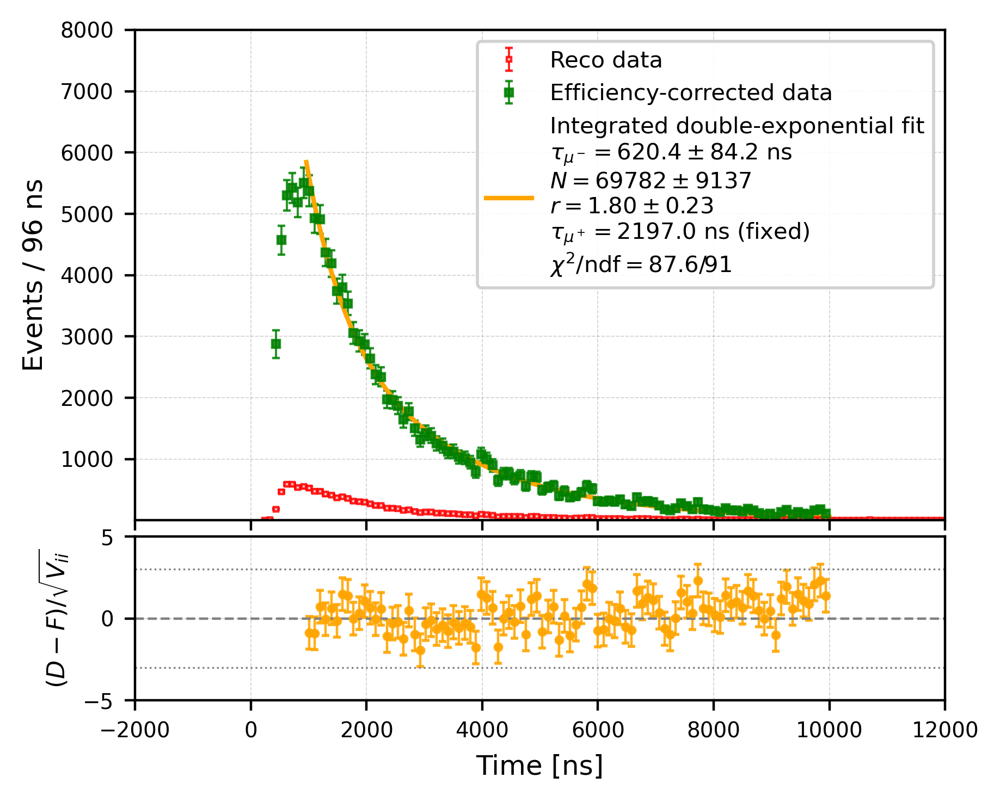

In [37]:
# ============================================================
# Select covariance treatment used by the lifetime fit
# ============================================================

if covariance_mode == "diagonal":

    # Retain only the individual-bin variances.
    # All bin-to-bin correlations are discarded.
    Cov_R_corr_for_fit = np.diag(
        np.diag(Cov_R_corr)
    )

elif covariance_mode == "correlated":

    # Retain the complete covariance matrix.
    Cov_R_corr_for_fit = Cov_R_corr.copy()

else:
    raise ValueError(
        "covariance_mode must be "
        "'diagonal' or 'correlated'."
    )


# Useful diagnostic
off_diagonal = (
    Cov_R_corr_for_fit
    - np.diag(np.diag(Cov_R_corr_for_fit))
)

print("Efficiency mode:", efficiency_mode)
print("Fit covariance mode:", covariance_mode)
print(
    "Maximum absolute off-diagonal covariance:",
    np.nanmax(np.abs(off_diagonal))
)







#Final Fit=====================================================
results = fit_double_exp(
    bin_edges=bins,
    y=R_corr,
    ycov=Cov_R_corr_for_fit,
    fit_range=(960, 10000),
    tau2=2197.0,
    raw_y=counts_reco,
    analysis_label=(
        f"{efficiency_mode} efficiency, "
        f"{covariance_mode} covariance"
    )
)

results["efficiency_mode"] = efficiency_mode
results["covariance_mode"] = covariance_mode


#### Study correlation:


Fit parameter values
       N = 69782.4 ± 9136.79
    tau1 = 620.414 ± 84.2033
   ratio = 1.79922 ± 0.226902

Parameter covariance matrix
                        N           tau1          ratio
         N   8.348088e+07  -6.018196e+05  -2.024237e+03
      tau1  -6.018196e+05   7.090194e+03   1.241099e+01
     ratio  -2.024237e+03   1.241099e+01   5.148443e-02

Parameter correlation matrix
                     N        tau1       ratio
         N      1.0000     -0.7822     -0.9764
      tau1     -0.7822      1.0000      0.6496
     ratio     -0.9764      0.6496      1.0000

Pairwise correlations
corr(N, tau1)     = -0.7822
corr(N, ratio)    = -0.9764
corr(tau1, ratio) = 0.6496


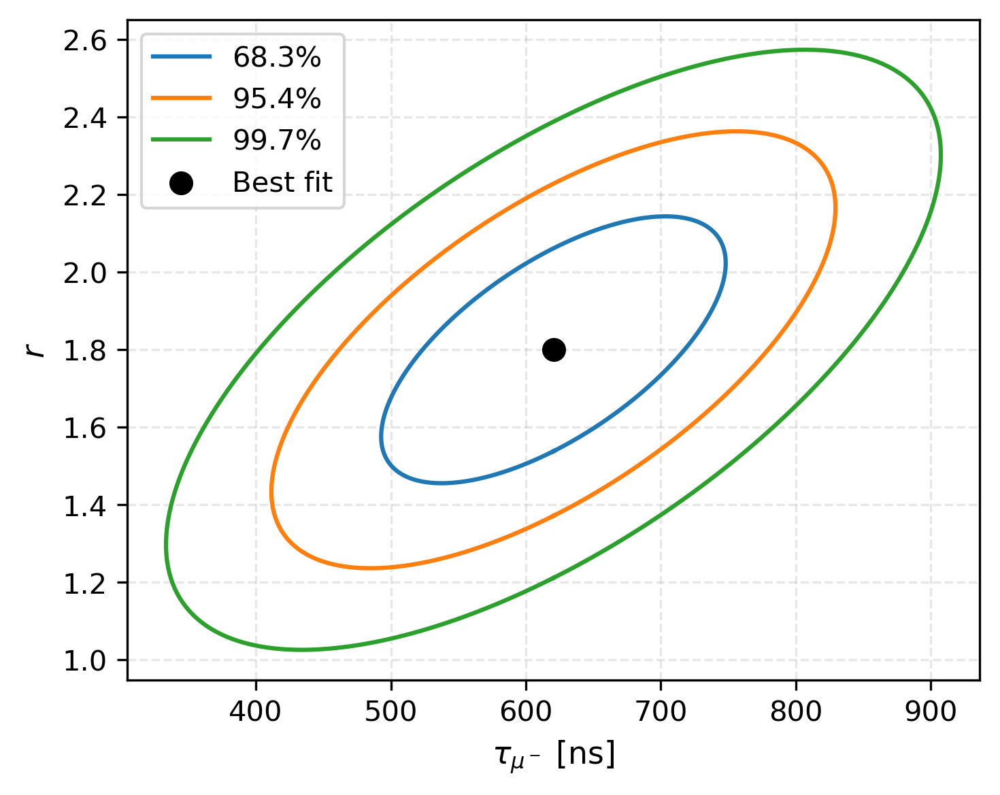

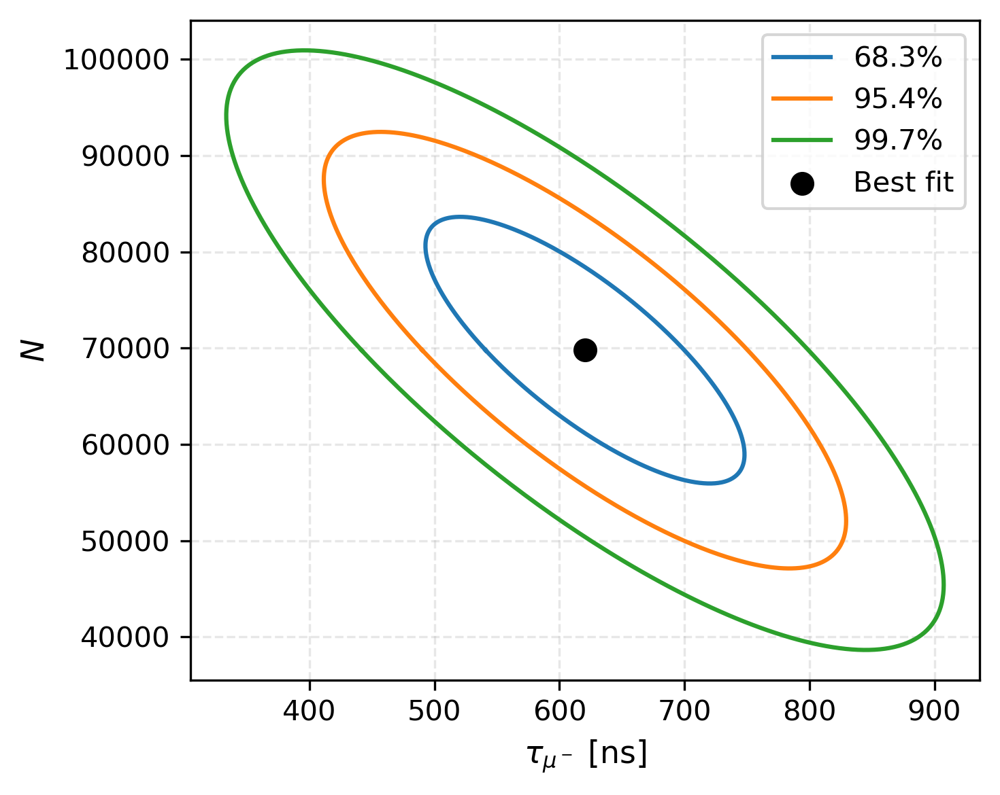

In [38]:
# ============================================================
# Parameter correlations and Gaussian confidence contours
#
# Run after:
#     results = fit_double_exp(...)
#
# Parameter order in curve_fit:
#     N, tau1, ratio
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2 as chi2_distribution


# ============================================================
# 1. Extract fitted values and parameter covariance
# ============================================================

parameter_names = ["N", "tau1", "ratio"]

parameter_values = np.array([
    results["N"][0],
    results["tau1"][0],
    results["ratio"][0]
], dtype=float)

parameter_covariance = np.asarray(
    results["parameter_covariance"],
    dtype=float
)

if parameter_covariance.shape != (3, 3):
    raise ValueError(
        "Expected a 3x3 parameter covariance matrix; "
        f"received {parameter_covariance.shape}."
    )

# Remove insignificant numerical asymmetry
parameter_covariance = 0.5 * (
    parameter_covariance + parameter_covariance.T
)

parameter_errors = np.sqrt(
    np.clip(np.diag(parameter_covariance), 0.0, None)
)

parameter_correlation = np.divide(
    parameter_covariance,
    np.outer(parameter_errors, parameter_errors),
    out=np.full_like(parameter_covariance, np.nan),
    where=np.outer(parameter_errors, parameter_errors) > 0
)


# ============================================================
# 2. Print fitted parameters
# ============================================================

print("\n===================================================")
print("Fit parameter values")
print("===================================================")

for name, value, error in zip(
    parameter_names,
    parameter_values,
    parameter_errors
):
    print(f"{name:>8s} = {value:.6g} ± {error:.6g}")


# ============================================================
# 3. Print parameter covariance matrix
# ============================================================

print("\n===================================================")
print("Parameter covariance matrix")
print("===================================================")

print(f"{'':>10s}", end="")

for name in parameter_names:
    print(f"{name:>15s}", end="")

print()

for row_name, row in zip(
    parameter_names,
    parameter_covariance
):
    print(f"{row_name:>10s}", end="")

    for value in row:
        print(f"{value:15.6e}", end="")

    print()


# ============================================================
# 4. Print parameter correlation matrix
# ============================================================

print("\n===================================================")
print("Parameter correlation matrix")
print("===================================================")

print(f"{'':>10s}", end="")

for name in parameter_names:
    print(f"{name:>12s}", end="")

print()

for row_name, row in zip(
    parameter_names,
    parameter_correlation
):
    print(f"{row_name:>10s}", end="")

    for value in row:
        print(f"{value:12.4f}", end="")

    print()


print("\n===================================================")
print("Pairwise correlations")
print("===================================================")

name_to_index = {
    name: index
    for index, name in enumerate(parameter_names)
}

print(
    "corr(N, tau1)     = "
    f"{parameter_correlation[name_to_index['N'], name_to_index['tau1']]:.4f}"
)

print(
    "corr(N, ratio)    = "
    f"{parameter_correlation[name_to_index['N'], name_to_index['ratio']]:.4f}"
)

print(
    "corr(tau1, ratio) = "
    f"{parameter_correlation[name_to_index['tau1'], name_to_index['ratio']]:.4f}"
)


# ============================================================
# 5. Function for two-parameter Gaussian confidence contours
#
# The contour equation is:
#
#     delta.T @ Cov_2D^(-1) @ delta
#         = chi2.ppf(CL, df=2)
#
# These are joint two-parameter confidence regions.
# ============================================================

def plot_parameter_contours(
    x_parameter,
    y_parameter,
    x_label,
    y_label,
    output_name=None
):
    x_index = name_to_index[x_parameter]
    y_index = name_to_index[y_parameter]

    selected_indices = [x_index, y_index]

    covariance_2d = parameter_covariance[
        np.ix_(selected_indices, selected_indices)
    ]

    covariance_2d = 0.5 * (
        covariance_2d + covariance_2d.T
    )

    eigenvalues, eigenvectors = np.linalg.eigh(
        covariance_2d
    )

    if np.any(eigenvalues <= 0):
        raise RuntimeError(
            f"The covariance for ({x_parameter}, {y_parameter}) "
            "is not positive definite."
        )

    center = np.array([
        parameter_values[x_index],
        parameter_values[y_index]
    ])

    # Converts a unit circle into the covariance ellipse
    covariance_transform = (
        eigenvectors
        @ np.diag(np.sqrt(eigenvalues))
    )

    angles = np.linspace(0.0, 2.0 * np.pi, 500)

    unit_circle = np.vstack([
        np.cos(angles),
        np.sin(angles)
    ])

    confidence_levels = [
        (0.683, "68.3%"),
        (0.954, "95.4%"),
        (0.997, "99.7%")
    ]

    fig, ax = plt.subplots(
        figsize=(5, 4),
        dpi=300
    )

    for confidence_level, label in confidence_levels:

        # Joint two-parameter confidence radius
        radius = np.sqrt(
            chi2_distribution.ppf(
                confidence_level,
                df=2
            )
        )

        contour_points = (
            center[:, None]
            + radius
            * covariance_transform
            @ unit_circle
        )

        ax.plot(
            contour_points[0],
            contour_points[1],
            linewidth=1.5,
            label=label
        )

    ax.scatter(
        center[0],
        center[1],
        s=55,
        color="black",
        marker="o",
        zorder=5,
        label="Best fit"
    )

    ax.set_xlabel(x_label, fontsize=11)
    ax.set_ylabel(y_label, fontsize=11)

    ax.grid(
        alpha=0.3,
        linestyle="--"
    )

    ax.legend()
    plt.tight_layout()

    if output_name is not None:
        plt.savefig(
            output_name,
            dpi=600,
            bbox_inches="tight"
        )

    plt.show()


# ============================================================
# 6. tau_mu- versus ratio contour
# ============================================================

plot_parameter_contours(
    x_parameter="tau1",
    y_parameter="ratio",
    x_label=r"$\tau_{\mu^-}$ [ns]",
    y_label=r"$r$",
    output_name="pds_contour_ratio_tauMinus_data.png"
)


# ============================================================
# 7. tau_mu- versus normalization contour
# ============================================================

plot_parameter_contours(
    x_parameter="tau1",
    y_parameter="N",
    x_label=r"$\tau_{\mu^-}$ [ns]",
    y_label=r"$N$",
    output_name="pds_contour_N_tauMinus_data.png"
)

<br />
<br />

####  Apply fitting:

<br />
<br />

### Apply new fitting function  (physics-motivated):

In [39]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.optimize import curve_fit

# # ============================================================
# # Physics constants (FIXED)
# # ============================================================
# tau_mu_plus = 2197.0   # ns
# Q = 0.988
# R_mu = 1.2

# # ============================================================
# # Integrated Michel model (bin-integrated)
# # ============================================================
# def michel_integrated(bin_edges, N_plus, tau_mu_minus):
#     """
#     Bin-integrated Michel lifetime model.

#     Returns expected counts per bin.
#     """
#     a = bin_edges[:-1]
#     b = bin_edges[1:]

#     term_plus  = np.exp(-a / tau_mu_plus)  - np.exp(-b / tau_mu_plus)
#     term_minus = np.exp(-a / tau_mu_minus) - np.exp(-b / tau_mu_minus)

#     prefactor = (Q * tau_mu_minus) / (R_mu * tau_mu_plus)

#     return N_plus * (term_plus + prefactor * term_minus)

# # ============================================================
# # Inputs assumed to exist from previous notebook cells
# # ============================================================
# # bins            : bin edges (length N+1)
# # centers         : bin centers (length N)
# # counts_reco     : reco histogram
# # R_corr          : efficiency-corrected histogram
# # sigma_R_corr    : uncertainties on R_corr

# # ============================================================
# # 1. Define CONTIGUOUS fit window (critical!)
# # ============================================================
# fit_range = (960, 12000)  # ns===============================================================

# mask_window = (
#     (centers >= fit_range[0]) &
#     (centers <= fit_range[1])
# )

# idx = np.where(mask_window)[0]
# if len(idx) < 2:
#     raise RuntimeError("Fit window too small or empty.")

# i0, i1 = idx[0], idx[-1]

# # Slice CONTIGUOUS bins
# edges_fit = bins[i0 : i1 + 2]         # N+1
# y_fit     = R_corr[i0 : i1 + 1]        # N
# sigma_fit = sigma_R_corr[i0 : i1 + 1]  # N

# # Safety check (now always true)
# assert len(edges_fit) == len(y_fit) + 1

# # Down-weight invalid bins instead of removing them
# valid = (y_fit > 0) & np.isfinite(y_fit)
# sigma_fit = np.where(valid, sigma_fit, 1e9)

# # ============================================================
# # 2. Perform χ² fit
# # ============================================================
# N0 = np.sum(y_fit[valid])
# tau_minus_0 = 600.0  # ns

# popt, pcov = curve_fit(
#     michel_integrated,
#     edges_fit, y_fit,
#     p0=[N0, tau_minus_0],
#     sigma=sigma_fit,
#     absolute_sigma=True,
#     bounds=([0.0, 50.0], [np.inf, 3000.0])
# )

# N_fit, tau_mu_minus_fit = popt
# N_err, tau_mu_minus_err = np.sqrt(np.diag(pcov))

# # χ² / ndf
# y_model_fit = michel_integrated(edges_fit, *popt)
# chi2 = np.sum(((y_fit - y_model_fit) / sigma_fit) ** 2)
# ndf  = len(y_fit) - len(popt)

# print("\nFit results:")
# print(f"  N⁺        = {N_fit:.0f} ± {N_err:.0f}")
# print(f"  τ(μ⁻)     = {tau_mu_minus_fit:.1f} ± {tau_mu_minus_err:.1f} ns")
# print(f"  χ²/ndf    = {chi2:.1f}/{ndf} = {chi2/ndf:.2f}")

# # ============================================================
# # 3. Plot: data + fit + residuals
# # ============================================================
# fig, (ax, ax_resid) = plt.subplots(
#     2, 1, figsize=(4.6, 3.8), dpi=400,
#     gridspec_kw={'height_ratios': [4, 1], 'hspace': 0.05},
#     sharex=True
# )

# # ------------------------------------------------------------
# # Main panel
# # ------------------------------------------------------------
# ax.step(
#     bins, np.append(counts_reco, counts_reco[-1]),
#     where='post', color='red', lw=1.0,
#     label='Reco μ lifetime'
# )

# ax.step(
#     bins, np.append(R_corr, R_corr[-1]),
#     where='post', color='green', lw=1.0,
#     label='Corrected (Reco / Eff)'
# )

# ax.errorbar(
#     centers, R_corr, yerr=sigma_R_corr,
#     fmt='none', ecolor='green',
#     elinewidth=0.8, capsize=1.5, alpha=0.85
# )

# # Smooth fitted curve (visual only)
# bin_width = bins[1] - bins[0]
# x_smooth = np.linspace(fit_range[0], fit_range[1], 600)

# y_smooth = (
#     (N_fit / tau_mu_plus) * np.exp(-x_smooth / tau_mu_plus)
#     + (N_fit * Q / (R_mu * tau_mu_plus)) * np.exp(-x_smooth / tau_mu_minus_fit)
# ) * bin_width

# ax.plot(
#     x_smooth, y_smooth,
#     color='orange', ls='--', lw=1.3,
#     label=(
#         r"Michel fit" "\n"
#         + rf"$\tau_{{\mu^-}} = {tau_mu_minus_fit:.1f} \pm {tau_mu_minus_err:.1f}\,\mathrm{{ns}}$" "\n"
#         + rf"$N^+ = {N_fit:.0f} \pm {N_err:.0f}$" "\n"
#         + rf"$R_\mu = {R_mu:.2f}$, $Q = {Q:.3f}$ (fixed)" "\n"
#         + rf"$\tau_{{\mu^+}} = {tau_mu_plus:.0f}\,\mathrm{{ns}}$ (fixed)" "\n"
#         + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$"
#     )
# )

# #ax.set_yscale('log')
# ax.set_ylim(-200, 6000)
# ax.set_ylabel('#Counts')
# ax.set_xlim(-2000, 18000)
# ax.grid(ls='--', lw=0.3)
# ax.legend(fontsize=7.5, framealpha=0.9)

# # ------------------------------------------------------------
# # Residuals panel (ONLY fit region)
# # ------------------------------------------------------------
# pulls = (y_fit - y_model_fit) / sigma_fit

# ax_resid.axhline(0, color='black', lw=0.6, ls='--')
# ax_resid.errorbar(
#     centers[i0 : i1 + 1], pulls,
#     yerr=np.ones_like(pulls),
#     fmt='o', color='orange',
#     markersize=3, elinewidth=0.7, capsize=1.5
# )

# ax_resid.set_xlabel('Time [ns]')
# ax_resid.set_ylabel('(data − fit)/σ')
# ax_resid.set_ylim(-5, 5)
# ax_resid.grid(ls='--', lw=0.3)

# plt.tight_layout()
# plt.show()


<br />
<br />
<br />
<br />

### Comparison of different measurements:

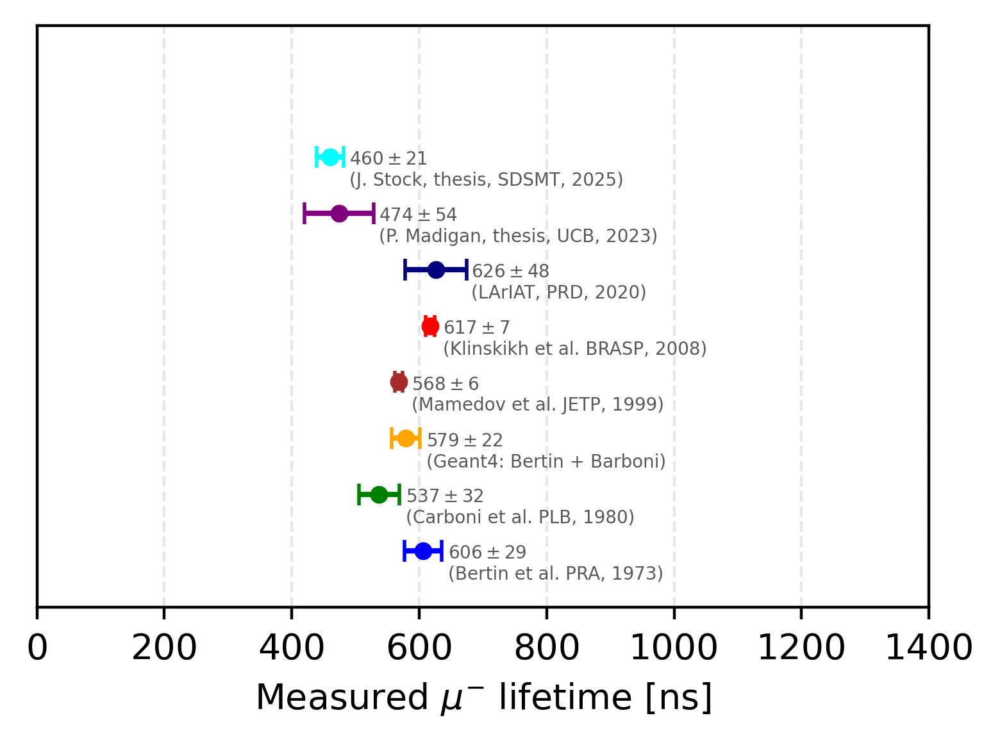

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------
# Measurements
# -----------------------

values = np.array([606, 537, 579, 568, 617, 626, 474, 460])
errors = np.array([29,  32,  22,  6,   7,   48,  54,  21])

y_positions = np.array([0.5, 2, 3.5, 5, 6.5, 8, 9.5, 11])

labels = [
    "$606 \\pm 29$\n(Bertin et al. PRA, 1973)",
    "$537 \\pm 32$\n(Carboni et al. PLB, 1980)",
    "$579 \\pm 22$\n(Geant4: Bertin + Barboni)",
    "$568 \\pm 6$\n(Mamedov et al. JETP, 1999)",
    "$617 \\pm 7$\n(Klinskikh et al. BRASP, 2008)",
    "$626 \\pm 48$\n(LArIAT, PRD, 2020)",
    "$474 \\pm 54$\n(P. Madigan, thesis, UCB, 2023)",
    "$460 \\pm 21$\n(J. Stock, thesis, SDSMT, 2025)"
]

# Point colors
point_colors = ["blue", "green", "orange", "brown", "red", "navy", "purple", "cyan"]

# (dx, dy) offsets for each label
label_offsets = [
    (39, -0.35),
    (42, -0.35),
    (32, -0.35),
    (20, -0.35),
    (20, -0.35),    
    (55, -0.35),
    (63, -0.35),
    (30, -0.35),
]

plt.figure(figsize=(4, 3), dpi=400)

for val, err, y, lab, col, (dx, dy) in zip(values, errors, y_positions, labels, point_colors, label_offsets):
    
    plt.errorbar(
        val, y, xerr=err,
        fmt='o', color=col,
        ecolor=col, capsize=3, markersize=4
    )
    
    # Multi-line label + size control
    plt.text(
        val + dx, y + dy,
        lab,
        fontsize=5,         # <<< set label size here
        va='center',
        color='0.35'
    )

plt.xlabel(r"Measured $\mu^{-}$ lifetime [ns]")
plt.xlim(0, 1400)
plt.yticks([])
plt.ylim(-1, 14.5)
plt.grid(alpha=0.3, linestyle="--")
plt.tight_layout()

plt.savefig("ch9_previousMeasure.png", dpi=600, bbox_inches='tight')

plt.show()


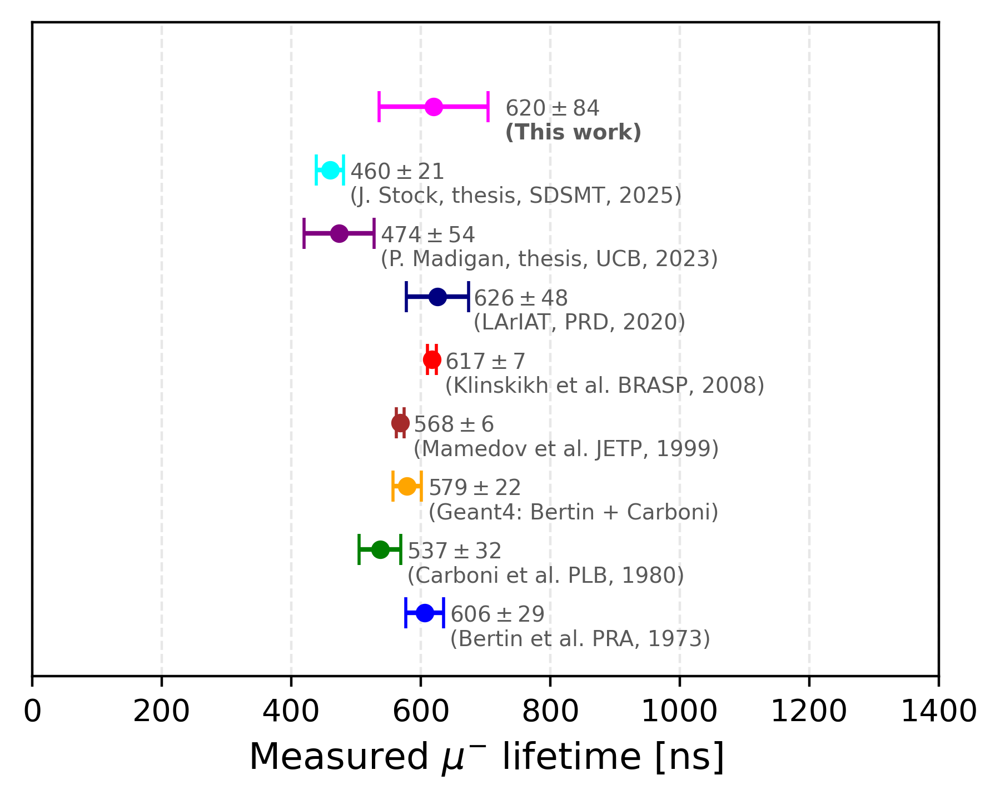

In [41]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------
# Measurements
# -----------------------

values = np.array([606, 537, 579, 568, 617, 626, 474, 460, 620])
errors = np.array([29,  32,  22,  6,   7,   48,  54,  21,  84])

y_positions = np.array([0.5, 2, 3.5, 5, 6.5, 8, 9.5, 11, 12.5])

labels = [
    "$606 \\pm 29$\n(Bertin et al. PRA, 1973)",
    "$537 \\pm 32$\n(Carboni et al. PLB, 1980)",
    "$579 \\pm 22$\n(Geant4: Bertin + Carboni)",
    "$568 \\pm 6$\n(Mamedov et al. JETP, 1999)",
    "$617 \\pm 7$\n(Klinskikh et al. BRASP, 2008)",
    "$626 \\pm 48$\n(LArIAT, PRD, 2020)",
    "$474 \\pm 54$\n(P. Madigan, thesis, UCB, 2023)",
    "$460 \\pm 21$\n(J. Stock, thesis, SDSMT, 2025)",
    "$620 \\pm 84$\n(This work)",
]

# Point colors
point_colors = [
    "blue", "green", "orange", "brown", "red",
    "navy", "purple", "cyan", "magenta"
]

# (dx, dy) offsets for each label
label_offsets = [
    (39, -0.35),
    (42, -0.35),
    (32, -0.35),
    (20, -0.35),
    (20, -0.35),
    (55, -0.35),
    (63, -0.35),
    (30, -0.35),
    (110, -0.35),
]

plt.figure(figsize=(4.6, 3.7), dpi=400)

for i, (val, err, y, lab, col, (dx, dy)) in enumerate(
    zip(values, errors, y_positions, labels, point_colors, label_offsets)
):

    plt.errorbar(
        val, y, xerr=err,
        fmt='o',
        color=col,
        ecolor=col,
        capsize=5,
        markersize=5
    )

    plt.text(
        val + dx,
        y + dy,
        lab,
        fontsize=7,
        va='center',
        color='0.35',
        fontweight='bold' if i == len(labels) - 1 else 'normal'
    )

plt.xlabel(r"Measured $\mu^{-}$ lifetime [ns]", fontsize=12)
plt.xlim(0, 1400)
plt.yticks([])
plt.ylim(-1, 14.5)
plt.grid(alpha=0.3, linestyle="--")
plt.tight_layout()

plt.savefig("ch9_previousMeasure.png", dpi=600, bbox_inches='tight')

plt.show()

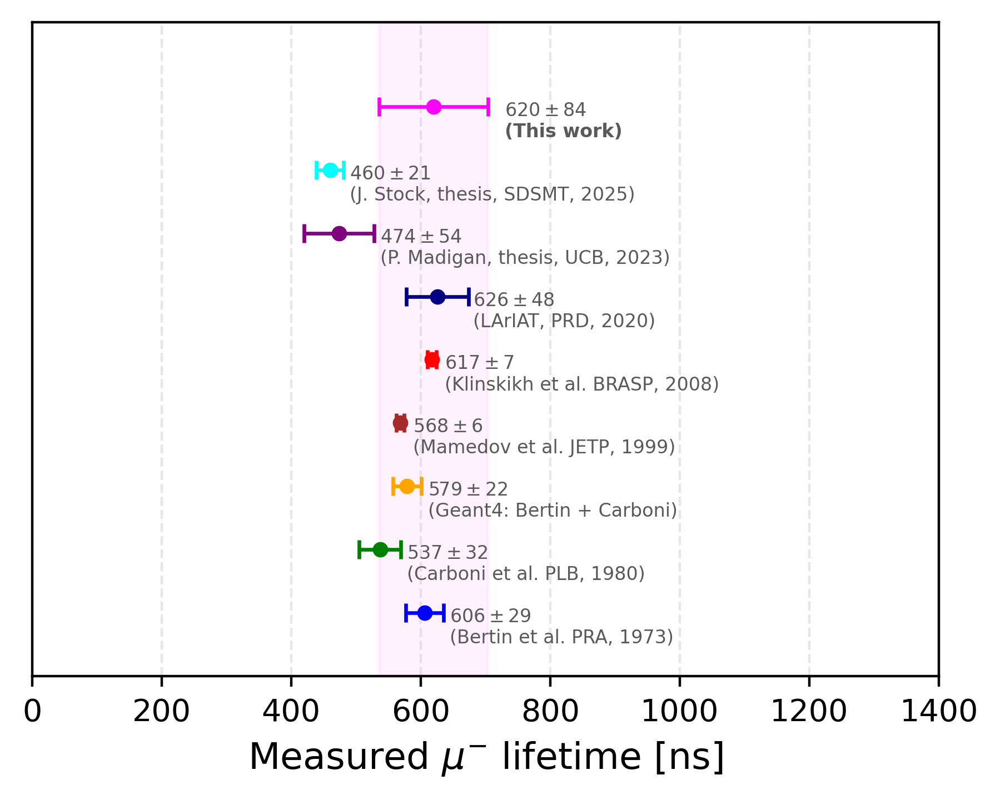

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------
# Measurements
# -----------------------
values = np.array([
    606, 537, 579, 568, 617, 626, 474, 460, 620
])

errors = np.array([
    29, 32, 22, 6, 7, 48, 54, 21, 84
])

y_positions = np.array([
    0.5, 2, 3.5, 5, 6.5, 8, 9.5, 11, 12.5
])

labels = [
    "$606 \\pm 29$\n(Bertin et al. PRA, 1973)",
    "$537 \\pm 32$\n(Carboni et al. PLB, 1980)",
    "$579 \\pm 22$\n(Geant4: Bertin + Carboni)",
    "$568 \\pm 6$\n(Mamedov et al. JETP, 1999)",
    "$617 \\pm 7$\n(Klinskikh et al. BRASP, 2008)",
    "$626 \\pm 48$\n(LArIAT, PRD, 2020)",
    "$474 \\pm 54$\n(P. Madigan, thesis, UCB, 2023)",
    "$460 \\pm 21$\n(J. Stock, thesis, SDSMT, 2025)",
    "$620 \\pm 84$\n(This work)",
]

# Point colors
point_colors = [
    "blue",
    "green",
    "orange",
    "brown",
    "red",
    "navy",
    "purple",
    "cyan",
    "magenta",
]

# Label offsets: (dx, dy)
label_offsets = [
    (39, -0.35),
    (42, -0.35),
    (32, -0.35),
    (20, -0.35),
    (20, -0.35),
    (55, -0.35),
    (63, -0.35),
    (30, -0.35),
    (110, -0.35),
]

# -----------------------
# Plot
# -----------------------
fig, ax = plt.subplots(figsize=(4.6, 3.7), dpi=400)

# This-work measurement
this_work_value = values[-1]
this_work_error = errors[-1]

# Uncertainty band: 620 ± 84 ns
ax.axvspan(
    this_work_value - this_work_error,
    this_work_value + this_work_error,
    color="magenta",
    alpha=0.05,
    label=r"This work: $620\pm84$ ns",
    zorder=0,
)



# Measurements
for i, (val, err, y, lab, col, (dx, dy)) in enumerate(
    zip(
        values,
        errors,
        y_positions,
        labels,
        point_colors,
        label_offsets,
    )
):
    ax.errorbar(
        val,
        y,
        xerr=err,
        fmt="o",
        color=col,
        ecolor=col,
        capsize=3,
        markersize=4,
        elinewidth=1.2,
        capthick=1.2,
        zorder=3,
    )

    ax.text(
        val + dx,
        y + dy,
        lab,
        fontsize=6,
        va="center",
        color="0.35",
        fontweight="bold" if i == len(labels) - 1 else "normal",
        zorder=4,
    )

# -----------------------
# Formatting
# -----------------------
plt.xlabel(r"Measured $\mu^{-}$ lifetime [ns]", fontsize=12)
plt.xlim(0, 1400)
plt.yticks([])
plt.ylim(-1, 14.5)
plt.grid(alpha=0.3, linestyle="--")
plt.tight_layout()

plt.savefig("ch9_previousMeasure.png", dpi=600, bbox_inches='tight')

plt.show()
